# High-mountain Asia Glacier Mass Balance

Companion notebook for analysis and figure generation for:

## A systematic, regional assessment of High-Mountain Asia glacier mass balance
### Shean et al. (2019), Frontiers in Earth Science

Disclaimer: This notebook was created around the time I was switching from iPython command line and standalone Python scripts to Jupyter notebooks for interactive analysis. Rather than starting from scratch, I copied code from some of these existing scripts and tried to modify for final analysis. I learned a lot in the process, but some sections are not as clean as I would hope.
Several figures for the manuscript were created here, though others were combined and labeled with Adobe Illustrator as a final step.

In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
#%matplotlib notebook
%matplotlib inline

In [4]:
import os, sys
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects

import scipy.stats

from osgeo import gdal

from imview.lib import pltlib
from pygeotools.lib import iolib, geolib, malib
from adjustText import adjust_text

import geopandas as gpd
import cartopy.crs as ccrs 

In [5]:
#Default pandas options
pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_columns', 500)

In [6]:
#Default matplotlib options
plt_opt = {'dpi':300, 'bbox_inches':'tight', 'pad_inches':0.01}

In [7]:
def cartopy_extent(extent):
    return [extent[0], extent[2], extent[1], extent[3]]

def append_centroid_xy(df):
    xlist = []
    ylist = []
    for index, row in df.centroid.iteritems():
        xlist.append(row.x)
        ylist.append(row.y)
    df['centroid_x'] = xlist
    df['centroid_y'] = ylist

In [8]:
#Root sum of squared errors
def rss(a, c=0.0, axis=0):
    #return ((a**2).sum() + c*a.prod())**0.5
    return ((a**2).sum(axis=axis))**0.5

#Root mean squared errors
def rms(a):
    return ((a**2).mean())**0.5

In [227]:
sigma_rho_perc

0.07058823529411765

In [570]:
#Define aggregation function for the dissolve
def aggregate(glac_df, glac_df_mb, col):
    aggfunc = {'area_m2':[np.mean, np.sum], \
               'mb_mwea':[np.mean, np.median, np.std, np.sum, np.size], \
               'mb_mwea_sigma':[np.mean, np.sum, rss], \
               'dhdt_ma':[np.mean, np.median, np.std, np.sum], \
               'dhdt_ma_sigma':[np.mean, np.sum, rss, rms], \
               'dhdt_ma_A':[np.mean, np.sum], \
               'dhdt_ma_A_abs':[np.mean, np.sum], \
               'dhdt_ma_sigma_A':[np.mean, np.sum, rss, rms], \
               'mb_m3wea':[np.mean, np.median, np.sum], \
               'mb_m3wea_sigma':[np.mean, np.sum, rss, rms], \
               'mb_Gta':[np.sum], \
               'mb_Gta_sigma':[np.mean, np.sum, rss, rms], \
               'Area':[np.mean, np.sum], \
               't1':[np.mean, np.min, np.max], \
               't2':[np.mean, np.min, np.max], \
               'dt':[np.mean, np.min, np.max], \
               'z_med':[np.mean, np.median, np.min, np.max]}
    
    #glac_df_mb['dhdt_ma_sigma_A'] = glac_df_mb['dhdt_ma_sigma'] * glac_df_mb['Area'] *1E6
    glac_df_mb['dhdt_ma_sigma_A'] = glac_df_mb['dhdt_ma_sigma'] * glac_df_mb['area_m2']
    glac_df_mb['dhdt_ma_A'] = glac_df_mb['dhdt_ma'] * glac_df_mb['area_m2']
    glac_df_mb['dhdt_ma_A_abs'] = glac_df_mb['dhdt_ma_A'].abs()
    glac_df_mb['dhdt_ma_sigma_perc'] = glac_df_mb['dhdt_ma_sigma']/glac_df_mb['dhdt_ma'].abs()
    
    #Perform the aggregation
    glac_df_mb_agg = glac_df_mb.groupby(col).agg(aggfunc)
    
    #Compute correlated dhdt sigma and total mb_m3wa sigma for the hex cell
    glac_df_mb_agg[('dhdt_ma', 'm3_to_ma')] = glac_df_mb_agg[('dhdt_ma_A', 'sum')] / glac_df_mb_agg[('area_m2', 'sum')]
    glac_df_mb_agg[('dhdt_ma', 'm3_to_ma_abs')] = glac_df_mb_agg[('dhdt_ma_A_abs', 'sum')] / glac_df_mb_agg[('area_m2', 'sum')]
    glac_df_mb_agg[('dhdt_ma_sigma', 'perc')] = glac_df_mb_agg[('dhdt_ma_sigma_A', 'sum')] / glac_df_mb_agg[('dhdt_ma_A_abs', 'sum')]
    glac_df_mb_agg[('dhdt_ma_sigma', 'perc_to_ma')] = glac_df_mb_agg[('dhdt_ma_sigma', 'perc')] * glac_df_mb_agg[('dhdt_ma', 'm3_to_ma_abs')]
    glac_df_mb_agg[('mb_m3wea_sigma', 'sum_perc')] = glac_df_mb_agg[('dhdt_ma_sigma', 'perc')] + sigma_A_perc + sigma_rho_perc
    #glac_df_mb_agg[('mb_m3wea_sigma', 'sum_perc_to_m3wea')] = glac_df_mb_agg[('mb_m3wea_sigma', 'sum_perc')] * glac_df_mb_agg[('mb_m3wea','sum')].abs() 
    glac_df_mb_agg[('mb_m3wea_abs', 'sum')] = glac_df_mb_agg[('dhdt_ma_A_abs', 'sum')] * rho
    glac_df_mb_agg[('mb_m3wea_sigma', 'sum_perc_to_m3wea')] = glac_df_mb_agg[('mb_m3wea_sigma', 'sum_perc')] * glac_df_mb_agg[('mb_m3wea_abs','sum')]
    glac_df_mb_agg[('mb_m3wea_sigma', 'sum_perc_to_Gta')] = glac_df_mb_agg[('mb_m3wea_sigma', 'sum_perc_to_m3wea')]/1E9
    glac_df_mb_agg[('mb_m3wea_sigma', 'sum_perc_to_mwea')] = glac_df_mb_agg[('mb_m3wea_sigma', 'sum_perc_to_m3wea')] / glac_df_mb_hex[('area_m2', 'sum')]
    
    
    #At basin/region scale, 
    basin_dhdt_ma = glac_df_mb_agg[('dhdt_ma_A', 'sum')].sum()/glac_df_mb_hex[('area_m2', 'sum')].sum()
    basin_dhdt_ma_sigma = rss(glac_df_mb_agg[('dhdt_ma_sigma_A', 'sum')])
    basin_dhdt_ma_sigma_perc = basin_dhdt_ma_sigma/glac_df_mb_agg[('dhdt_ma_A_abs', 'sum')].sum()
    #basin_dhdt_ma_sigma_perc = basin_dhdt_ma_sigma/glac_df_mb_agg[('dhdt_ma_A', 'sum')].abs().sum()
    basin_sigma_sum_perc = basin_dhdt_ma_sigma_perc + sigma_A_perc + sigma_rho_perc
    basin_sigma = glac_df_mb_agg[('mb_m3wea','sum')].sum() * basin_sigma_sum_perc
    
    
    #This is count of number of glaciers
    glac_df_mb_agg[('mb_mwea', 'count')] = glac_df_mb_agg[('mb_mwea', 'size')].astype('int64')
    
    #Sigma for ('mb_mwea','mean'), assumign errors are dependent is ('mb_mwea_sigma', 'mean') - sum of errors divided by n samples
    #Sigma for ('mb_mwea','mean'), assuming errors for each glacier are independent, with equal weight
    glac_df_mb_agg[('mb_mwea_sigma', 'rss_mean')] = glac_df_mb_agg[('mb_mwea_sigma', 'rss')]/glac_df_mb_agg[('mb_mwea', 'count')]
    
    #This includes all RGI glacier polygons, not just those with valid mb records - mostly just to get total area
    glac_df_agg_sum = glac_df.groupby(col).sum()
    glac_df_agg_mean = glac_df.groupby(col).mean()
    #glac_df_agg_mean = glac_df.groupby(col).median()
    #These are values for all glaciers in each region (not just those with mb numbers)
    glac_df_mb_agg[('Area_all', 'mean')] = glac_df_agg_mean['Area']
    glac_df_mb_agg[('Area_all', 'sum')] = glac_df_agg_sum['Area']
    
    #Percent coverage of mb numbers
    glac_df_mb_agg[('Area','perc')] = 100*glac_df_mb_agg[('Area','sum')]/glac_df_mb_agg[('Area_all', 'sum')]
    glac_df_mb_agg[('mb_mwea', 'total_m3a')] = glac_df_mb_agg[('mb_mwea', 'mean')] * glac_df_mb_agg[('Area_all', 'sum')] * 1E6
    glac_df_mb_agg[('mb_mwea', 'total_Gta')] = glac_df_mb_agg[('mb_mwea', 'total_m3a')]/1E9 
    
    #Gta and Gta_sigma estimate converted to m_wea
    glac_df_mb_agg[('mb_mwea', 'Gta_to_mwea')] = 1000*glac_df_mb_agg[('mb_Gta','sum')]/glac_df_mb_agg[('Area', 'sum')]
    glac_df_mb_agg[('mb_mwea_sigma', 'Gta_to_mwea')] = 1000*glac_df_mb_agg[('mb_Gta_sigma','sum')]/glac_df_mb_agg[('Area', 'sum')]
    
    #Cumulative numbers for full time period
    glac_df_mb_agg[('mb_mwe_cum', 'mean')] = glac_df_mb_agg[('mb_mwea','mean')] * glac_df_mb_agg[('dt', 'mean')]
    glac_df_mb_agg[('mb_mwe_cum', 'total_m3')] = glac_df_mb_agg[('mb_mwea', 'total_m3a')] * glac_df_mb_agg[('dt', 'mean')] 
    glac_df_mb_agg[('mb_mwe_cum', 'total_Gt')] = glac_df_mb_agg[('mb_mwea', 'total_Gta')] * glac_df_mb_agg[('dt', 'mean')] 
   
    #Compute numbers for meltwater - polygons with negative mass balance (mb < 0)
    #glac_df_mb_agg_meltwater = glac_df_mb[glac_df_mb['mb_mwea' < 0]].sum()
    glac_df_mb_agg_meltwater = glac_df_mb[glac_df_mb['mb_m3wea'] < 0].groupby(col).agg(aggfunc)
    glac_df_mb_agg[('meltwater', 'count')] = glac_df_mb_agg_meltwater[('mb_mwea', 'size')].astype('int64') 
    glac_df_mb_agg[('meltwater', 'total_m3a')] = glac_df_mb_agg_meltwater[('mb_m3wea', 'sum')]
    glac_df_mb_agg[('meltwater', 'total_m3a_sigma')] = glac_df_mb_agg_meltwater[('mb_m3wea_sigma', 'sum')]
    glac_df_mb_agg[('meltwater', 'total_Gta')] = glac_df_mb_agg[('meltwater', 'total_m3a')]/1E9 
    glac_df_mb_agg[('meltwater', 'total_Gta_sigma')] = glac_df_mb_agg[('meltwater', 'total_m3a_sigma')]/1E9
    glac_df_mb_agg[('meltwater', 'total_mmSLEa')] = glac_df_mb_agg[('meltwater', 'total_Gta')]/Gt2mm
    glac_df_mb_agg[('meltwater', 'total_mmSLEa_sigma')] = glac_df_mb_agg[('meltwater', 'total_Gta_sigma')]/Gt2mm
    
    #Cumulative meltwater numbers for full time period
    glac_df_mb_agg[('meltwater_cum', 'total_m3')] = glac_df_mb_agg[('meltwater', 'total_m3a')] * glac_df_mb_agg[('dt', 'mean')] 
    glac_df_mb_agg[('meltwater_cum', 'total_Gt')] = glac_df_mb_agg[('meltwater', 'total_Gta')] * glac_df_mb_agg[('dt', 'mean')] 
    glac_df_mb_agg[('meltwater_cum', 'total_mmSLE')] = glac_df_mb_agg[('meltwater', 'total_Gta')] * glac_df_mb_agg[('dt', 'mean')] 
    return glac_df_mb_agg

In [571]:
def hex_agg(glac_gdf_mb_hex, region_df, region_col):
    print("One-time spatial join by hex")
    glac_gdf_mb_hex_region = gpd.sjoin(glac_gdf_mb_hex, region_df, how="inner", op="within")
    glac_gdf_mb_hex_region.rename(index=str, columns={'index_right':region_col}, inplace=True)
    print(glac_gdf_mb_hex_region.shape)
    
    aggfunc = { ('mb_m3wea_sigma', 'sum'):[np.sum, rss, rms], \
               ('mb_m3wea', 'sum'):[np.sum, np.size], \
               ('z_med', 'median'):[np.mean, np.median], \
               ('Area_all', 'sum'):[np.sum],\
               ('meltwater', 'total_m3a'):[np.sum], \
               ('meltwater', 'total_m3a_sigma'):[np.sum, rss, rms], \
               
               ('dhdt_ma_A', 'sum'):[np.sum], \
               ('area_m2', 'sum'):[np.sum], \
               ('dhdt_ma_sigma_A', 'sum'):[np.sum, rss], \
               ('dhdt_ma_A_abs', 'sum'):[np.sum] }
    
    glac_gdf_mb_hex_region_agg = glac_gdf_mb_hex_region.groupby(region_col).agg(aggfunc)
    
    glac_gdf_mb_hex_region_agg[('dhdt_ma','m3_to_ma','region')] = glac_gdf_mb_hex_region_agg[('dhdt_ma_A','sum','sum')] / glac_gdf_mb_hex_region_agg[('area_m2','sum','sum')]
    glac_gdf_mb_hex_region_agg[('dhdt_ma','m3_to_ma_abs','region')] = glac_gdf_mb_hex_region_agg[('dhdt_ma_A_abs','sum','sum')] / glac_gdf_mb_hex_region_agg[('area_m2','sum','sum')]
    
    #This is the primary difference from aggregation at hex cell level - instead of sum,sum we are using sum,rss
    glac_gdf_mb_hex_region_agg[('dhdt_ma_sigma','perc','region')] = glac_gdf_mb_hex_region_agg[('dhdt_ma_sigma_A','sum','rss')] / glac_gdf_mb_hex_region_agg[('dhdt_ma_A_abs','sum','sum')]
    glac_gdf_mb_hex_region_agg[('dhdt_ma_sigma','perc_to_ma','region')] = glac_gdf_mb_hex_region_agg[('dhdt_ma_sigma','perc','region')] * glac_gdf_mb_hex_region_agg[('dhdt_ma','m3_to_ma_abs','region')]
    
    #glac_gdf_mb_hex_region_agg[('mb_m3wea_sigma','sum_perc','region')] = glac_gdf_mb_hex_region_agg[('dhdt_ma_sigma','perc','region')] + sigma_A_perc + sigma_rho_perc
    #glac_gdf_mb_hex_region_agg[('mb_m3wea_sigma','sum_perc','region')] = np.sqrt(glac_gdf_mb_hex_region_agg[('dhdt_ma_sigma','perc','region')]**2 + (sigma_A_perc + sigma_rho_perc)**2)
    glac_gdf_mb_hex_region_agg[('mb_m3wea_sigma','sum_perc','region')] = np.sqrt(glac_gdf_mb_hex_region_agg[('dhdt_ma_sigma','perc','region')]**2 + sigma_A_perc**2 + sigma_rho_perc**2)
    
    glac_gdf_mb_hex_region_agg[('mb_m3wea_abs','sum','region')] = glac_gdf_mb_hex_region_agg[('dhdt_ma_A_abs','sum','sum')] * rho
    glac_gdf_mb_hex_region_agg[('mb_m3wea_sigma','sum_perc_to_m3wea','region')] = glac_gdf_mb_hex_region_agg[('mb_m3wea_sigma','sum_perc','region')] * glac_gdf_mb_hex_region_agg[('mb_m3wea_abs','sum','region')]
    glac_gdf_mb_hex_region_agg[('mb_m3wea_sigma','sum_perc_to_Gta','region')] = glac_gdf_mb_hex_region_agg[('mb_m3wea_sigma','sum_perc_to_m3wea','region')]/1E9
    glac_gdf_mb_hex_region_agg[('mb_m3wea_sigma','sum_perc_to_mwea','region')] = glac_gdf_mb_hex_region_agg[('mb_m3wea_sigma','sum_perc_to_m3wea','region')]/glac_gdf_mb_hex_region_agg[('area_m2','sum','sum')]
    
    #Aggregate earlier meltwater aggregation
    glac_gdf_mb_hex_region_agg_melt = glac_gdf_mb_hex_region[glac_gdf_mb_hex_region[('meltwater', 'total_Gta')] < 0].groupby(region_col).agg(aggfunc)
    #Compute a new round of meltwater for hex cells with negative mass balance 
    glac_gdf_mb_hex_region_agg_melt_hex = glac_gdf_mb_hex_region[glac_gdf_mb_hex_region[('mb_m3wea', 'sum')] < 0].groupby(region_col).agg(aggfunc)
    
    glac_gdf_mb_hex_region_agg['centroid_x'] = region_df['centroid_x']
    glac_gdf_mb_hex_region_agg['centroid_y'] = region_df['centroid_y']
    #glac_gdf_mb_hex_region_agg['Area_all'] = glac_gdf_mb_hex_region_agg[('Area_all', 'sum', 'sum')]
    #glac_gdf_mb_hex_region_agg['Area_all'] = glac_df_mb_region[('Area_all', 'sum')
    glac_gdf_mb_hex_region_agg[('mb_Gta','sum','sum')] = glac_gdf_mb_hex_region_agg[('mb_m3wea','sum','sum')]/1E9
    glac_gdf_mb_hex_region_agg[('mb_Gta_sigma','sum','rss')] = glac_gdf_mb_hex_region_agg[('mb_m3wea_sigma','sum','rss')]/1E9
    glac_gdf_mb_hex_region_agg[('mb_mwea','sum','sum')] = glac_gdf_mb_hex_region_agg[('mb_m3wea','sum','sum')]/1E6/glac_gdf_mb_hex_region_agg[('Area_all', 'sum', 'sum')]
    glac_gdf_mb_hex_region_agg[('mb_mwea_sigma','sum','rss')] = glac_gdf_mb_hex_region_agg[('mb_m3wea_sigma','sum','rss')]/1E6/glac_gdf_mb_hex_region_agg[('Area_all', 'sum', 'sum')]
    
    glac_gdf_mb_hex_region_agg[('meltwater_Gta','sum','sum')] = glac_gdf_mb_hex_region_agg_melt[('meltwater','total_m3a','sum')]/1E9
    glac_gdf_mb_hex_region_agg[('meltwater_Gta_sigma','sum','rss')] = glac_gdf_mb_hex_region_agg_melt[('meltwater','total_m3a_sigma','rss')]/1E9
    glac_gdf_mb_hex_region_agg[('meltwater_Gta_sigma','sum','sum')] = glac_gdf_mb_hex_region_agg_melt[('meltwater','total_m3a_sigma','sum')]/1E9
    glac_gdf_mb_hex_region_agg[('meltwater_Gta_hex','sum','sum')] = glac_gdf_mb_hex_region_agg_melt_hex[('mb_m3wea', 'sum','sum')]/1E9
    glac_gdf_mb_hex_region_agg[('meltwater_Gta_hex_sigma','sum','rss')] = glac_gdf_mb_hex_region_agg_melt_hex[('mb_m3wea_sigma', 'sum','rss')]/1E9
    glac_gdf_mb_hex_region_agg[('meltwater_Gta_hex_sigma','sum','sum')] = glac_gdf_mb_hex_region_agg_melt_hex[('mb_m3wea_sigma', 'sum','sum')]/1E9
    
    if 'ENDO' in region_df:
        glac_gdf_mb_hex_region_agg['ENDO'] = region_df['ENDO']
    
    #glac_gdf_mb_hex_region_agg.sort_values(by=('Area_all', 'sum', 'sum'), ascending=False, inplace=True)
    glac_gdf_mb_hex_region_agg.sort_values(by='centroid_x', ascending=True, inplace=True)
    
    return glac_gdf_mb_hex_region_agg

In [188]:
def spatial_aggregate(glac_df, glac_df_mb, agg_df, col, sort=True):
    glac_df_mb_agg = aggregate(glac_df, glac_df_mb, col)
    append_centroid_xy(agg_df)
    if 'basin' in col:
        #Preserve basin attributes (endorheic flag, discharge)
        glac_df_mb_agg = glac_df_mb_agg.merge(agg_df[['ENDO', 'centroid_x', 'centroid_y']], left_index=True, right_index=True)
    else:
        glac_df_mb_agg = glac_df_mb_agg.merge(agg_df[['centroid_x', 'centroid_y']], left_index=True, right_index=True)
    if sort:
        glac_df_mb_agg.sort_values(by=('Area_all', 'sum'), ascending=False, inplace=True)
    glac_df_mb_agg.df_name = col
    return glac_df_mb_agg

In [11]:
def add_legend(ax, sf=16, loc='upper right'):
    """
    Create legend for scaled scatterplot markers
    """
    ax.autoscale(False)
    #CONUS
    #leg_s = np.array([0.1, 0.5, 1.0, 5.0, 10.0])
    #HMA
    #leg_s = np.array([0.1, 1.0, 10.0, 100.0])
    leg_s = np.array([1.0, 10.0, 100.0, 1000.0, 10000.0])
    #Spoof dummy coordinates way off map
    leg_x = np.full(leg_s.size, -999999999)
    leg_y = np.full(leg_s.size, -999999999)
    for i, s in enumerate(leg_s):
        #lbl = r'$%0.1f\/km^2$' % s
        lbl = '%i' % s
        ax.scatter(leg_x[i], leg_y[i], s=s*sf, c='gray', label=lbl)
    legend = ax.legend(title=r'$Glacier\/Area\/(km^2)$', scatterpoints=1, loc=loc, prop={'size':7}, ncol=leg_s.size)
    legend.get_title().set_fontsize('8')
    return legend

In [12]:
def load_hs(hs_fn):
    print("Loading shaded relief map")
    hs_ds = gdal.Open(hs_fn)
    hs = iolib.ds_getma(hs_ds)
    hs_clim = malib.calcperc(hs)
    hs_extent = geolib.ds_extent(hs_ds)
    hs_extent_cartopy = cartopy_extent(hs_extent)
    return hs, hs_ds, hs_clim, hs_extent_cartopy

def add_hs(hs, ax, hs_clim, hs_extent_cartopy):
    ax.autoscale(enable=False)
    ax.imshow(hs, cmap='gray', origin='upper', extent=hs_extent_cartopy, alpha=0.6, vmin=hs_clim[0], vmax=hs_clim[1])

In [289]:
def make_map(mb_dissolve_df=None, glac_df_mb=None, agg_df=None, col=('mb_mwea', 'mean'), sigma_col=None, \
             border_df=None, crs=None, extent=None, hs_bg=True, clim=None, \
             labels='val', title=None, cbar_fmt='%0.1f', cmap=None, glac=False):

    fig, ax = plt.subplots(figsize=(10,8))
    ax.set_aspect('equal')
    legend = add_legend(ax, sf=scaling_f)
    
    if title is not None:
        ax.set_title(title)

    if clim is None:
        #clim = (glac_df_mb[col].min(), glac_df_mb[col].max())
        clim = malib.calcperc_sym(mb_dissolve_df[col], perc=(1,99))

    cmap = 'RdBu'
    
    if 'sigma' in col:
        cmap = 'inferno'
    
    label = None
    if 'size' in col[-1]:
        label = "Number of glaciers"
        cmap = 'inferno'
        clim = malib.calcperc(mb_dissolve_df[col], perc=(0,98))
    elif 'dhdt_ma' in col:
        label = 'Elevation Change (m/yr)'
    elif 'dhdt_ma_sigma' in col:
        cmap = 'inferno'
        label = 'Elevation Change Uncertainty (m/yr)'
    elif 'mb_mwea' in col:
        label = 'Mass Balance (m we/yr)'
    elif 'mb_mwea_sigma' in col or 'sum_perc_to_mwea' in col:
        cmap = 'inferno'
        label = 'Mass Balance Uncertainty (m we/yr)'
    elif 'mb_Gta' in col: 
        label = 'Mass Balance (Gt/yr)'
    elif 'mb_Gta_sigma' in col or 'sum_perc_to_Gta' in col:
        cmap = 'inferno'
        label = 'Mass Balance Uncertainty (Gt/yr)'
    elif 'meltwater_Gta' in col[0]: 
        label = 'Excess Meltwater Runoff (Gt/yr)'
        #Reverse, as these are negative values
        cmap = 'YlOrRd_r'
        #cmap = 'inferno'
        #clim = malib.calcperc(mb_dissolve_df[col], perc=(0,99))
    elif 'meltwater_mwea' in col[0]:
        label = 'Excess Meltwater Runoff (m we/yr)'
        cmap = 'YlOrRd_r'
    elif 't1' in col:
        cmap = 'inferno'
        label = 'Source Date (year)'

    #This is cartopy-enabled axes
    #ax = plt.axes(projection=crs)

    #Currently unsupported for AEA
    #gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

    if hs_bg:
        print("Plotting image")
        #hs_style = {'cmap':'gray', 'origin':'upper', 'extent':cartopy_extent(hs_extent), 'transform':crs}
        #ax.imshow(hs, **hs_style)
        add_hs(hs, ax, hs_clim, hs_extent_cartopy)

    if border_df is not None:
        print("Plotting borders")
        border_style = {'facecolor':'0.65','edgecolor':'k', 'linewidth':0.7}
        #if hs is not None:
        if hs_bg:
            border_style = {'facecolor':'none','edgecolor':'k', 'linewidth':0.7}
        border_df.plot(ax=ax, **border_style)

    if False:
        if agg_df is not None:
            print("Plotting agg boundaries")
            #This provides colored regions
            #agg_style = {'cmap':'cpt_rainbow', 'edgecolor':'none', 'linewidth':0, 'alpha':0.05}
            agg_style = {'cmap':'summer', 'edgecolor':'none', 'linewidth':0, 'alpha':0.05}
            #agg_style = {'facecolor':'0.95','edgecolor':'k', 'linewidth':0.3, 'alpha':0.2}
            agg_df.plot(ax=ax, **agg_style)

    if glac is True and glac_df_mb is not None:
        print("Plotting glacier polygons")
        glac_style = {'edgecolor':'k', 'linewidth':0.1, 'alpha':0.3}
        #This plots mb color ramp for each glacier polygon
        #glac_ax = glac_df_mb.plot(ax=ax, column=col[0], cmap=cmap, vmin=clim[0], vmax=clim[1], **glac_style)
        #This plots outlines
        glac_ax = glac_df_mb.plot(ax=ax, facecolor='none', **glac_style)

    print(col)
        
    if agg_df is not None:
        agg_style = {'facecolor':'none', 'edgecolor':'w', 'linewidth':0.5}
        #if 'meltwater' in col[0]:
        if 'basin' in agg_df.index.name:
            agg_style['alpha'] = 0.3
            #Exorheic
            agg_style['facecolor'] = 'lightblue'
            agg_df.plot(ax=ax, **agg_style)
            #Endorheic
            agg_style['facecolor'] = 'lightgreen'
            agg_df[agg_df['ENDO']==0].plot(ax=ax, **agg_style)
        agg_style = {'facecolor':'none', 'edgecolor':'w', 'linewidth':0.5}
        agg_df.plot(ax=ax, **agg_style)

    #https://stackoverflow.com/questions/36008648/colorbar-on-geopandas
    # fake up the array of the scalar mappable so we can plot colorbar. Urgh...
    sc = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=clim[0], vmax=clim[1]))
    sc._A = []

    if mb_dissolve_df is not None:
        print("Plotting scatterplot of %s values" % (col, ))
        #Plot single values for region or basin
        x = mb_dissolve_df['centroid_x']
        y = mb_dissolve_df['centroid_y']
        #Scale by total glacier area in each polygon 
        if 'Area_all' in mb_dissolve_df:
            area_col = 'Area_all'
        elif ('Area_all', 'sum') in mb_dissolve_df:    
            area_col = ('Area_all', 'sum')
        elif ('Area_all', 'sum', 'sum') in mb_dissolve_df:
            area_col = ('Area_all', 'sum', 'sum')

        s = scaling_f * mb_dissolve_df[area_col]
        
        c = mb_dissolve_df[col]
        sc_style = {'cmap':cmap, 'edgecolor':'k', 'linewidth':0.5, 'alpha':0.8}
        sc = ax.scatter(x, y, s, c, vmin=clim[0], vmax=clim[1], **sc_style) 
        
        #Add labels
        text_kw = {'family':'sans-serif', 'fontsize':8, 'color':'k'}
        if labels is not None:
            print("Adding annotations")
            txt_list = []
            for k, v in mb_dissolve_df.iterrows():
                if 'sigma' in labels and sigma_col is not None:
                    if labels == 'val+sigma':
                        #sigma_col=('mb_Gta_sigma', 'sum', 'rss')
                        lbl = '%+0.2f\u00b1%0.2f' % (v[col], v[sigma_col])
                    elif labels == 'name+val+sigma':
                        #sigma_col=('mb_Gta_sigma', 'sum', 'rss')
                        lbl = '%s\n%+0.2f\u00b1%0.2f' % (k, v[col], v[sigma_col])
                else:
                    if 'name' in labels:
                        lbl = '%s\n%+0.2f' % (k, v[col])
                    else:
                        lbl = '%+0.2f' % v[col]
                #ax.annotate(lbl, xy=(v['centroid_x'],v['centroid_y']), xytext=(1,0), textcoords='offset points', family='sans-serif', fontsize=6, color='darkgreen')
                txt = ax.annotate(lbl, xy=(v['centroid_x'].values, v['centroid_y'].values), ha='center', va='center', **text_kw)
                txt.set_path_effects([path_effects.Stroke(linewidth=1.0, foreground='w'),path_effects.Normal()])
                txt_list.append(txt)
            
    #This is minx, miny, maxx, maxy
    if extent is None:
        #if glac_df_mb is not None:
        #    extent = glac_df_mb.total_bounds
        #else:
        extent = mb_dissolve_df.total_bounds

    #For cartopy axes
    #ax.set_extent(cartopy_extent(extent), crs=crs)
    #Pad extent so labels fit within map
    #extent = geolib.pad_extent(extent, perc=0.01, uniform=True)
    ax.set_xlim(extent[0], extent[2])
    ax.set_ylim(extent[1], extent[3])
    
    #Adding colorbar doesn't work with the cartopy axes
    pltlib.add_cbar(ax, sc, arr=mb_dissolve_df[col].values, label=label, clim=clim, format=cbar_fmt)
    pltlib.add_scalebar(ax, res=1, location='lower left')
    #pltlib.hide_ticks(ax)

    plt.tight_layout()
    pltlib.latlon_ticks(ax, in_crs=glac_crs)
    #adjust_text(txt_list, arrowprops=dict(arrowstyle='-', ls=':', lw=0.5, color='k'), on_basemap=True)

    return fig

## Define variables

In [20]:
regenerate_files = True

site = 'hma'
#site = 'conus'

area_filter = False
min_area_m2 = 1E6

outlier_removal = True

#Ocean area
#3.625×108 km2 (Cogley et al., 2011)
Gt2mm = 362.5

plot = True 
map_plots = True 

#Default mb clim
#mb_clim = (-1.0, 1.0)
#mb_clim = (-1.2, 1.2)
mb_clim = (-0.75, 0.75)

#suptitle = "Glacier Mass Balance (ASTER 2000–2009)"
#suptitle = "Glacier Mass Balance (ASTER 2000–2018)"
suptitle = "Glacier Mass Balance (ASTER+WV/GE 2000–2018)"
#suptitle = "Glacier Mass Balance (ASTER 2009–2018)"
#suptitle = "Glacier Mass Balance (SRTM 2000 to WV/GE median)"

#HMA
scaling_f = 0.2 
#CONUS
#scaling_f = 3 

rgi_col = 'RGIId'
kaab_region_col = 'kaab_region'
region_col = 'himap_region'
#basin_col = 'HYBAS_ID'
basin_col = 'basin_name'
qdgc_col = 'qdgc'
mascon_col = 'mascon'
hex_col = 'id'

#hex_width = 27
#hex_width = 42
hex_width = 32

extent = None
crs = None

#topdir = '/Users/dshean/data/'
topdir = '/scr/hma/hma_gmb_data'
#topdir = '/nobackup/deshean/data/hma_gmb_data'

In [21]:
if site == 'hma':
    #WBM basin names
    basin_col = 'basin_name'
    #hs_fn = os.path.join(topdir, 'hma_mos_32m_20180723/hma_mos_32m_100m_hs_az315.tif')
    hs_fn = '/scr/hma/TDM1_DEM_90m_hma_DEM_aea_4x_hs_az315.tif'
    glac_shp_fn = os.path.join(topdir, 'rgi60/regions/rgi60_merge_HMA_aea.shp')
    border_shp_fn = os.path.join(topdir, 'NaturalEarth/10m_cultural/10m_cultural/ne_10m_admin_0_countries_lakes.shp')
    #basin_shp_fn = os.path.join(topdir, 'basins/HydroBASINS/hybas_lake_as_lev01-12_v1c/hybas_lake_as_lev04_v1c.shp')
    basin_shp_fn = os.path.join(topdir, 'basins/HiMAT_full_210_IDs_subset_merged_clip_names_update.gpkg')
    kaab_region_shp_fn = os.path.join(topdir, 'regions/regions_from_kaab2015_merged_clean_20181111.gpkg')
    region_shp_fn = os.path.join(topdir, 'regions/boundary_mountain_regions_hma_v3_clean.gpkg')
    #http://www.mindland.com/wp/download-qdgc-continents/
    qdgc_shp_fn = os.path.join(topdir, 'qdgc/qdgc_01_asia.shp')
    mascon_shp_fn = os.path.join(topdir, 'mascons/GSFC.glb.200301_201607_v02.4_clip.gpkg')
    #hex_shp_fn = os.path.join(topdir, 'hex/hma_25km_hexagons.gpkg')
    hex_shp_fn = os.path.join(topdir, 'hex/hma_%ikm_hexagons.gpkg' % hex_width)
    #This is geopandas crs format
    glac_crs = {u'datum':u'WGS84',u'lat_0':36,u'lat_1':25,u'lat_2':47,u'lon_0':85,u'no_defs':True,u'proj':u'aea',u'units':u'm',u'x_0':0,u'y_0':0}
    #minx, miny, maxx, maxy
    extent = [-1610900, -1142400, 1767400, 1145700]
elif site == 'conus':
    #hs_fn = '/scr/mb/gpd/conus_20171018_mos_32m_trans_100m_hs_az315_1km.tif'
    glac_shp_fn = os.path.join(topdir, 'rgi60/regions/rgi60_merge_CONUS_aea.shp')
    region_shp_fn = os.path.join(topdir, 'CONUS/regions/conus_mb_regions_aea.shp')
    border_shp_fn = os.path.join(topdir, 'NaturalEarth/10m_cultural/10m_cultural/ne_10m_admin_1_states_provinces_lakes.shp')
    basin_shp_fn = os.path.join(topdir, 'HydroBASINS/hybas_lake_na_lev01-12_v1c/hybas_lake_na_lev07_v1c.shp')
    glac_crs = {u'datum':u'WGS84',u'lat_0':43,u'lat_1':36,u'lat_2':49,u'lon_0':-115,u'no_defs':True,u'proj':u'aea',u'units':u'm',u'x_0':0,u'y_0':0}
    #This is cartopy
    crs = ccrs.AlbersEqualArea(central_longitude=-115, central_latitude=43, standard_parallels=(36, 49))
    extent = [-856800, -789000, 910700, 839400]
else:
    sys.exit("Site not currently supported")

In [22]:
def proc_rgi(glac_shp_fn, pointgeom=True):
    glac_df = gpd.read_file(glac_shp_fn)
    glac_df.shape
    glac_df.set_index(rgi_col, inplace=True)
    #Add centroid field - needed for proper partitioning in spatial join
    if pointgeom:
        glac_df['centroid_geom'] = gpd.GeoSeries(glac_df.centroid)
        glac_df['polygon_geom'] = gpd.GeoSeries(glac_df.geometry)
        glac_df.set_geometry('centroid_geom', inplace=True, drop=True)
    return glac_df

## Mass balance records
Input csv contains records for each RGI polygon, output of `mb_parallel.py` script

In [23]:
#Input csv from mb_parallel.py
#mb_csv_fn = sys.argv[1]

#mb_csv_fn = os.path.join(topdir, "mb/mb_20181108/ASTER_2000-2018/hma_mb_20181108_0454.csv")
#mb_csv_fn = os.path.join(topdir, "mb/mb_20181211/hma_mb_20181211_2117.csv")
#mb_csv_fn = os.path.join(topdir, "mb/mb_20181222/hma_mb_20181211_2117.csv")
#mb_csv_fn = os.path.join(topdir, "mb/mb_20190207/hma_mb_20190207_0856.csv")
#mb_csv_fn = os.path.join(topdir, "mb/mb_20190212/hma_mb_20190213_0143.csv")
#This is std
#mb_csv_fn = os.path.join(topdir, "mb/mb_20190213/hma_mb_20190213_1924.csv")
#This is nmad
#mb_csv_fn = os.path.join(topdir, "mb/mb_20190213_nmad/hma_mb_20190214_1015.csv")
#mb_csv_fn = os.path.join(topdir, "mb/mb_20190213_nmad_hex/hma_mb_20190214_1015_nmad.csv")
#mb_csv_fn = os.path.join(topdir, "mb/mb_combined_20190213_nmad/hma_mb_20190214_1015.csv")
#This is std + mean
mb_csv_fn = os.path.join(topdir, "mb/mb_20190213_std_sys/hma_mb_20190215_0815_std+mean.csv")
out_fn_suffix = '_hex%s_std+mean_mb_combined_splitsigma' % hex_width
#Copy for hex analysis
#mb_csv_fn = os.path.join(topdir, "mb/mb_20190213_std_sys_hex/hma_mb_20190215_0815_std+mean.csv")
#out_fn_suffix = '_hex_mb_combined'

In [24]:
#Test for no trend filtering
#mb_csv_fn = os.path.join(topdir, "mb/mb_combined_20190908_nofltr/hma_mb_20190908_2044.csv")
#out_fn_suffix = '_hex_mb_nofltr'
#Test for ASTER-only
#mb_csv_fn = os.path.join(topdir, "mb/mb_ASTERonly_20190910_fltr/hma_mb_20190910_1840.csv")
#out_fn_suffix = '_hex_mb_ASTER-only'

In [25]:
#driver = 'GeoJSON'
#ext = 'geojson'
#driver = 'ESRI Shapefile'
#ext = 'shp'
driver = 'GPKG'
ext= 'gpkg'

merge_fn = os.path.splitext(mb_csv_fn)[0]+'_'+os.path.splitext(os.path.split(glac_shp_fn)[-1])[0]+out_fn_suffix+'.'+ext

glac_shp_join_fn = os.path.splitext(merge_fn)[0]+'_join.'+ext

if os.path.exists(glac_shp_join_fn) and not regenerate_files:
    print("Loading glacier polygons joined with regions, basins, qdgc, mascons")
    glac_df = gpd.read_file(glac_shp_join_fn)
    #This is a hack, as geojson doesn't properly preserve custom aae proj
    glac_df.crs = glac_crs
else:
    print("Loading glacier polygons from RGI")
    regenerate_files = True
    glac_df = proc_rgi(glac_shp_fn)

Loading glacier polygons from RGI


In [26]:
glac_df.head()

,GLIMSId,BgnDate,EndDate,CenLon,CenLat,O1Region,O2Region,Area,Zmin,Zmax,Zmed,Slope,Aspect,Lmax,Status,Connect,Form,TermType,Surging,Linkages,Name,geometry,polygon_geom
RGIId,,,,,,,,,,,,,,,,,,,,,,,
RGI60-10.02737,G091712E46821N,20130830,-9999999,91.71,46.82,10,4,2.59,3511,4055,3751,12.90,46,2238,0,0,0,0,9,9,None,POINT (511462.9002958058 1234920.527373319),"POLYGON ((512408.7829012285 1235304.972647103,..."
RGI60-10.02738,G091715E46809N,20130830,-9999999,91.72,46.81,10,4,0.92,3510,4054,3803,21.80,71,1727,0,0,0,0,9,9,None,POINT (511859.2073947595 1233778.554995568),"POLYGON ((511984.7396394496 1234264.649849409,..."
RGI60-10.02739,G091676E46825N,20130830,-9999999,91.68,46.82,10,4,0.17,3421,4019,3700,37.70,319,808,0,0,0,0,9,9,None,POINT (508774.8039690169 1235189.929149999),"POLYGON ((509044.2222071177 1235081.79052123, ..."
RGI60-10.02740,G091695E46823N,20130830,-9999999,91.69,46.82,10,4,2.62,3228,4023,3797,15.60,11,2363,0,0,0,0,9,9,None,POINT (510048.9886075557 1235228.326570088),"POLYGON ((510888.9882190869 1236020.766610738,..."
RGI60-10.02741,G091690E46814N,20130830,-9999999,91.69,46.81,10,4,0.25,3872,4041,3911,15.00,173,661,0,0,0,0,9,9,None,POINT (509597.3198155502 1234368.580210418),"POLYGON ((509240.0660853852 1234622.119867637,..."


In [27]:
if border_shp_fn is not None:
    print("Loading borders")
    #Load local copy of border polygons
    border_df = gpd.read_file(border_shp_fn)
    border_df = border_df.to_crs(glac_df.crs)

if kaab_region_shp_fn is not None:
    print("Loading Kaab regions")
    kaab_region_df = gpd.read_file(kaab_region_shp_fn)
    kaab_region_df.rename({'Nyainqentangla':'Nyainqentanglha', 'Pamir Alai':'Pamir Alay'}, inplace=True)
    #Convert to glac crs
    kaab_region_df = kaab_region_df.to_crs(glac_df.crs)
    kaab_region_df.set_index(kaab_region_col, inplace=True)

if region_shp_fn is not None:
    print("Loading regions")
    region_df = gpd.read_file(region_shp_fn)
    #Convert to glac crs
    region_df = region_df.to_crs(glac_df.crs)
    region_df.set_index(region_col, inplace=True)

if basin_shp_fn is not None:
    print("Loading basins")
    basin_df = gpd.read_file(basin_shp_fn)
    #There are issues with fiona writing large integers in basin IDs, convert to string to be safe
    #The dtype is int64, but finoa writes int32, and they all get truncated to 2147483647
    if basin_col == 'HYBAS_ID':
        for f in ['HYBAS_ID', 'NEXT_DOWN', 'NEXT_SINK', 'MAIN_BAS']:
            basin_df[f] = basin_df[f].astype('str')
    #Convert to glac crs
    basin_df = basin_df.to_crs(glac_df.crs)
    basin_df.set_index(basin_col, inplace=True)
    #Dissolve to generate polygons for exorheic and endorheic basins
    if 'ENDO' in basin_df:
        basin_df_endo = basin_df.dissolve('ENDO')

if mascon_shp_fn is not None:
    print("Loading mascon")
    mascon_df = gpd.read_file(mascon_shp_fn)
    #Convert to glac crs
    mascon_df = mascon_df.to_crs(glac_df.crs)
    #Add a unique identifier
    mascon_df[mascon_col] = mascon_df.lat_center.map('{:,.0f}N'.format) + mascon_df.lon_center.map('{:,.0f}E'.format)
    mascon_df.set_index(mascon_col, inplace=True)

if qdgc_shp_fn is not None:
    print("Loading qdgc")
    qdgc_df = gpd.read_file(qdgc_shp_fn)
    #Convert to glac crs
    qdgc_df = qdgc_df.to_crs(glac_df.crs)
    qdgc_df.set_index(qdgc_col, inplace=True)
    
if hex_shp_fn is not None:
    print("Loading hex")
    hex_df = gpd.read_file(hex_shp_fn)
    #Convert to glac crs
    hex_df = hex_df.to_crs(glac_df.crs)
    hex_df.set_index(hex_col, inplace=True)

print(glac_df.shape)

Loading borders
Loading Kaab regions
Loading regions
Loading basins
Loading mascon
Loading qdgc
Loading hex
(95608, 23)


In [28]:
#Add region, basin, etc fields to RGI polygons
if not os.path.exists(glac_shp_join_fn) or regenerate_files:
    if mascon_shp_fn is not None:
        print("One-time spatial join by mascon")
        glac_df = gpd.sjoin(glac_df, mascon_df, how="inner", op="intersects")
        glac_df.rename(index=str, columns={'index_right':mascon_col}, inplace=True)
        print(glac_df.shape)

    if qdgc_shp_fn is not None:
        print("One-time spatial join by qdgc")
        glac_df = gpd.sjoin(glac_df, qdgc_df, how="inner", op="intersects")
        glac_df.rename(index=str, columns={'index_right':qdgc_col}, inplace=True)
        print(glac_df.shape)
    
    if hex_shp_fn is not None:
        print("One-time spatial join by hex")
        glac_df = gpd.sjoin(glac_df, hex_df, how="inner", op="intersects")
        glac_df.rename(index=str, columns={'index_right':hex_col}, inplace=True)
        print(glac_df.shape)

    if kaab_region_shp_fn is not None:
        print("One-time spatial join by Kaab region")
        glac_df = gpd.sjoin(glac_df, kaab_region_df, how="inner", op="intersects")
        glac_df.rename(index=str, columns={'index_right':kaab_region_col}, inplace=True)
        print(glac_df.shape)
        
    if region_shp_fn is not None:
        print("One-time spatial join by region")
        glac_df = gpd.sjoin(glac_df, region_df, how="inner", op="intersects")
        glac_df.rename(index=str, columns={'index_right':region_col}, inplace=True)
        print(glac_df.shape)

    if basin_shp_fn is not None:
        print("One-time spatial join by basin")
        glac_df = gpd.sjoin(glac_df, basin_df, how="inner", op="intersects")
        glac_df.rename(index=str, columns={'index_right':basin_col}, inplace=True)
        print(glac_df.shape)
        if 'ENDO' in basin_df:
            print("One-time spatial join by basin exorheic/endorheic")
            glac_df = gpd.sjoin(glac_df, basin_df_endo, how="inner", op="intersects")
            glac_df.rename(index=str, columns={'index_right':'ENDO'}, inplace=True)
            print(glac_df.shape)

One-time spatial join by mascon
(95604, 33)
One-time spatial join by qdgc
(95604, 37)
One-time spatial join by hex
(95532, 42)
One-time spatial join by Kaab region
(94827, 43)
One-time spatial join by region
(94827, 44)
One-time spatial join by basin
(94827, 47)
One-time spatial join by basin exorheic/endorheic
(94827, 49)


In [29]:
glac_df.head()

,GLIMSId,BgnDate,EndDate,CenLon,CenLat,O1Region,O2Region,Area,Zmin,Zmax,Zmed,Slope,Aspect,Lmax,Status,Connect,Form,TermType,Surging,Linkages,Name,geometry,polygon_geom,mascon,area_deg,area_km2,basin,elev_flag,lat_center,lat_span,location,lon_center,lon_span,qdgc,lat,lon,areakm2,id,left,top,right,bottom,kaab_region,himap_region,basin_name,DN_left,ENDO,ENDO,DN_right
RGI60-13.00001,G079494E34471N,20000810,-9999999,79.49,34.47,13,5,0.43,5678,5928,5763,22.00,312,683,0,0,0,0,9,9,None,POINT (-496737.9606140639 -158921.6431009165),POLYGON ((-496209.4980626574 -158466.015012046...,34N79E,1.00,"12,384.63","5,051.00",0.00,34.00,1.00,80.00,79.13,1.21,E079N34C,34.25,79.25,2554.43216,2921,"-502,387.48","-134,300.00","-465,437.07","-166,300.00",Inner TP,Karakoram,Inner_Tibetan_Plateau,8018,1,1,3546
RGI60-13.00193,G079488E34457N,20000810,-9999999,79.49,34.46,13,5,0.04,5785,6021,5918,21.90,274,577,0,0,0,0,9,9,None,POINT (-497480.0974897748 -160496.4608722838),POLYGON ((-497316.6548596073 -160421.284876345...,34N79E,1.00,"12,384.63","5,051.00",0.00,34.00,1.00,80.00,79.13,1.21,E079N34C,34.25,79.25,2554.43216,2849,"-530,100.30","-150,300.00","-493,149.88","-182,300.00",Inner TP,Karakoram,Inner_Tibetan_Plateau,8018,1,1,3546
RGI60-13.00194,G079485E34453N,20000810,-9999999,79.49,34.45,13,5,0.48,5812,6168,6069,23.60,313,862,0,0,0,0,9,9,None,POINT (-497258.1451734032 -160790.7992206139),POLYGON ((-497100.8575950089 -161102.336852015...,34N79E,1.00,"12,384.63","5,051.00",0.00,34.00,1.00,80.00,79.13,1.21,E079N34C,34.25,79.25,2554.43216,2849,"-530,100.30","-150,300.00","-493,149.88","-182,300.00",Inner TP,Karakoram,Inner_Tibetan_Plateau,8018,1,1,3546
RGI60-13.00195,G079468E34463N,20000810,-9999999,79.47,34.46,13,5,0.12,5783,6039,5921,27.60,76,738,0,0,0,0,9,9,None,POINT (-499138.4920396542 -159752.4775722147),POLYGON ((-499475.249742389 -159819.9878303844...,34N79E,1.00,"12,384.63","5,051.00",0.00,34.00,1.00,80.00,79.13,1.21,E079N34C,34.25,79.25,2554.43216,2849,"-530,100.30","-150,300.00","-493,149.88","-182,300.00",Inner TP,Karakoram,Inner_Tibetan_Plateau,8018,1,1,3546
RGI60-13.00196,G079472E34468N,20000810,-9999999,79.47,34.47,13,5,0.33,5724,6016,5866,28.30,7,678,0,0,0,0,9,9,None,POINT (-498754.315368586 -159167.3295160337),POLYGON ((-498022.2702280887 -158925.942111669...,34N79E,1.00,"12,384.63","5,051.00",0.00,34.00,1.00,80.00,79.13,1.21,E079N34C,34.25,79.25,2554.43216,2849,"-530,100.30","-150,300.00","-493,149.88","-182,300.00",Inner TP,Karakoram,Inner_Tibetan_Plateau,8018,1,1,3546


In [30]:
if regenerate_files:
    if 'polygon_geom' in glac_df:
        glac_df.set_geometry('polygon_geom', inplace=True, drop=True)
    #print("Writing out: %s" % glac_shp_join_fn)
    #With index set to RGIId, it is not written out, hack to create new column
    #glac_df = glac_df.reset_index().rename(columns={'index':rgi_col})
    #glac_df.to_file(glac_shp_join_fn, driver=driver)

Writing out: /scr/hma/hma_gmb_data/mb/mb_20190213_std_sys/hma_mb_20190215_0815_std+mean_rgi60_merge_HMA_aea_hex32_std+mean_mb_combined_splitsigma_join.gpkg


In [31]:
print(glac_df.shape)

(94827, 48)


In [32]:
glac_df.columns

Index(['GLIMSId', 'BgnDate', 'EndDate', 'CenLon', 'CenLat', 'O1Region',
       'O2Region', 'Area', 'Zmin', 'Zmax', 'Zmed', 'Slope', 'Aspect', 'Lmax',
       'Status', 'Connect', 'Form', 'TermType', 'Surging', 'Linkages', 'Name',
       'geometry', 'mascon', 'area_deg', 'area_km2', 'basin', 'elev_flag',
       'lat_center', 'lat_span', 'location', 'lon_center', 'lon_span', 'qdgc',
       'lat', 'lon', 'areakm2', 'id', 'left', 'top', 'right', 'bottom',
       'kaab_region', 'himap_region', 'basin_name', 'DN_left', 'ENDO', 'ENDO',
       'DN_right'],
      dtype='object')

In [33]:
def load_mb(mb_csv_fn):
    print("Loading mb")
    mb_df = pd.read_csv(mb_csv_fn)
    mb_df[rgi_col] = 'RGI60-'+mb_df[rgi_col].map('{:08.5f}'.format)
    mb_df.set_index(rgi_col, inplace=True)
    mb_df['mb_Gta'] = mb_df['mb_m3wea']/1E9
    mb_df['mb_Gta_sigma'] = mb_df['mb_m3wea_sigma']/1E9

    #Update uncertainty for specific mass balance numbers
    #mb_df['mb_mwea_sigma_full'] = mb_df['mb_m3wea_sigma']/mb_df['area_m2']
    return mb_df

## Prepare mb data, join with RGI

In [34]:
mb_df = load_mb(mb_csv_fn)

Loading mb


In [35]:
mb_df.head()

,x,y,z_med,z_min,z_max,z_slope,z_aspect,dhdt_ma,dhdt_ma_sigma,mb_mwea,mb_mwea_sigma,area_m2,mb_m3wea,mb_m3wea_sigma,t1,t2,dt,valid_area_perc,H_m,debris_m,perc_debris,perc_pond,perc_clean,vm_ma,mb_Gta,mb_Gta_sigma
RGIId,,,,,,,,,,,,,,,,,,,,,,,,,,
RGI60-14.06629,"-747,305.50","11,409.82","7,821.87","7,707.36","7,925.20",58.56,71.16,-1.14,2.06,-0.97,1.76,"35,882.19","-34,802.33","63,112.70","2,000.41","2,018.41",18.00,97.82,nan,nan,nan,nan,nan,nan,-0.00,0.00
RGI60-15.05152,"-145,758.23","-820,691.04","7,818.45","7,435.90","8,144.73",36.93,25.96,0.59,0.99,0.50,0.85,"676,902.42","338,028.43","573,583.66","2,000.41","2,018.41",18.00,99.98,nan,nan,nan,nan,nan,nan,0.00,0.00
RGI60-15.02790,"305,153.26","-927,260.15","7,688.86","7,324.96","7,822.69",17.83,65.67,0.00,0.62,0.00,0.53,"1,919,223.17","3,639.70","1,019,826.79","2,000.41","2,018.41",18.00,99.93,nan,nan,nan,nan,nan,nan,0.00,0.00
RGI60-15.02793,"307,937.21","-927,265.32","7,687.29","7,387.41","8,068.16",31.80,321.88,0.10,0.62,0.09,0.53,"1,235,264.20","110,700.65","650,191.72","2,000.41","2,018.41",18.00,98.80,nan,nan,nan,nan,nan,nan,0.00,0.00
RGI60-15.02827,"308,784.36","-927,669.24","7,683.33","7,140.85","8,151.29",44.87,95.27,1.28,7.34,1.08,6.24,"571,948.84","620,407.85","3,570,353.65","2,000.41","2,018.41",18.00,100.71,nan,nan,nan,nan,nan,nan,0.00,0.00


In [545]:
mb_df['dhdt_ma'].quantile([0.001,0.999])

0.00   -2.40
1.00    1.89
Name: dhdt_ma, dtype: float64

In [546]:
mb_df['dhdt_ma_sigma'].quantile([0.001,0.999])

0.00   0.04
1.00   3.68
Name: dhdt_ma_sigma, dtype: float64

In [527]:
mb_df['dhdt_ma_sigma_perc'] = 100*mb_df['dhdt_ma_sigma']/mb_df['dhdt_ma'].abs()

In [548]:
mb_df['dhdt_ma_sigma_perc'].quantile([0.01,0.99])

0.01      24.29
0.99   7,200.00
Name: dhdt_ma_sigma_perc, dtype: float64

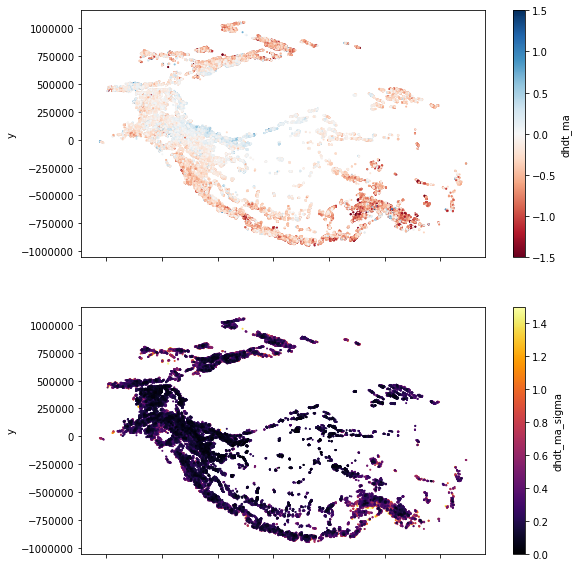

In [38]:
f, axa = plt.subplots(2,1, figsize=(10,10), sharex=True, sharey=True)
clim=1.5
mb_df_sort = mb_df.sort_values('dhdt_ma_sigma', ascending=False)
mb_df_sort.plot(ax=axa[0], kind='scatter', x='x', y='y', c='dhdt_ma', cmap='RdBu', vmin=-clim, vmax=clim, s=1)
axa[0].set_aspect('equal')
mb_df_sort.plot(ax=axa[1], kind='scatter', x='x', y='y', c='dhdt_ma_sigma', cmap='inferno', vmin=0, vmax=clim, s=1)
axa[1].set_aspect('equal')
#plt.tight_layout()

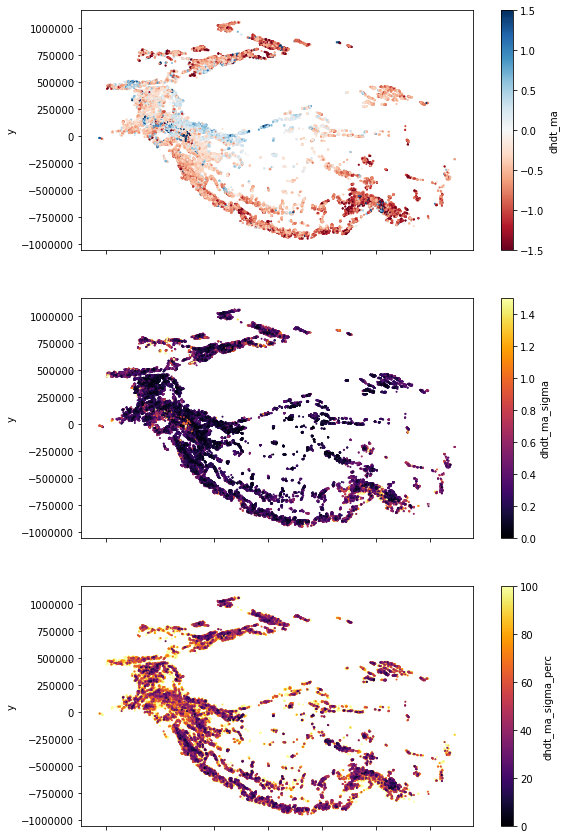

In [528]:
mb_df['dhdt_ma_sigma_perc'] = 100*mb_df['dhdt_ma_sigma']/mb_df['dhdt_ma'].abs()
f, axa = plt.subplots(3,1, figsize=(10,15), sharex=True, sharey=True)
clim=1.5
mb_df_sort = mb_df.sort_values('dhdt_ma_sigma_perc', ascending=False)
mb_df_sort.plot(ax=axa[0], kind='scatter', x='x', y='y', c='dhdt_ma', cmap='RdBu', vmin=-clim, vmax=clim, s=1)
axa[0].set_aspect('equal')
mb_df_sort.plot(ax=axa[1], kind='scatter', x='x', y='y', c='dhdt_ma_sigma', cmap='inferno', vmin=0, vmax=clim, s=1)
axa[1].set_aspect('equal')
mb_df_sort.plot(ax=axa[2], kind='scatter', x='x', y='y', c='dhdt_ma_sigma_perc', cmap='inferno', vmin=0, vmax=100, s=1)
axa[2].set_aspect('equal')
#plt.tight_layout()

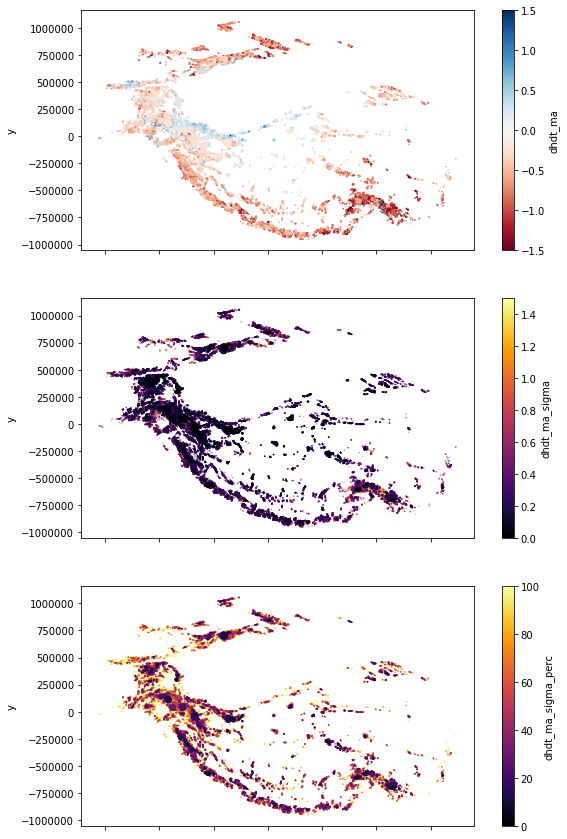

In [534]:
f, axa = plt.subplots(3,1, figsize=(10,15), sharex=True, sharey=True)
clim=1.5
s=150*mb_df_sort['area_m2']/mb_df_sort['area_m2'].max()
mb_df_sort = mb_df.sort_values('dhdt_ma_sigma_perc', ascending=False)
mb_df_sort.plot(ax=axa[0], kind='scatter', x='x', y='y', c='dhdt_ma', cmap='RdBu', vmin=-clim, vmax=clim, s=s)
axa[0].set_aspect('equal')
mb_df_sort.plot(ax=axa[1], kind='scatter', x='x', y='y', c='dhdt_ma_sigma', cmap='inferno', vmin=0, vmax=clim, s=s)
axa[1].set_aspect('equal')
mb_df_sort.plot(ax=axa[2], kind='scatter', x='x', y='y', c='dhdt_ma_sigma_perc', cmap='inferno', vmin=0, vmax=100, s=s)
axa[2].set_aspect('equal')
#plt.tight_layout()

In [39]:
mb_df_t1 = mb_df['t1'].mean()
mb_df_t2 = mb_df['t2'].mean()
print(mb_df_t1, mb_df_t2)
dt_str = '%.0f-%.0f' % (mb_df_t1, mb_df_t2)

if os.path.exists(merge_fn) and not regenerate_files:
    print("Loading merged polygons and mb")
    glac_df_mb = gpd.read_file(merge_fn)
    #glac_df_mb.set_index(rgi_col, inplace=True)
    print(glac_df_mb.shape)
else:
    print("Merging glacier polygons and mb results")
    glac_df_mb = glac_df.merge(mb_df, left_index=True, right_index=True)
    print(glac_df_mb.shape)
    #print("Writing out: %s" % merge_fn)
    #With index set to RGIId, it is not written out, hack to create new column
    glac_df_mb = glac_df_mb.reset_index().rename(columns={'index':rgi_col})
    #glac_df_mb.to_file(merge_fn, driver=driver)

2000.4119999999998 2018.4119999999998
Merging glacier polygons and mb results
(94436, 74)
Writing out: /scr/hma/hma_gmb_data/mb/mb_20190213_std_sys/hma_mb_20190215_0815_std+mean_rgi60_merge_HMA_aea_hex32_std+mean_mb_combined_splitsigma.gpkg


In [40]:
glac_df_mb.set_index(rgi_col, inplace=True)
print("%i merged records loaded" % (glac_df_mb.shape[0]))

94436 merged records loaded


In [41]:
if area_filter:
    print("Filtering by glacier polygon area (min %0.2f km^2)" % (min_area_m2/1E6))
    orig_count = glac_df_mb.shape[0]
    glac_df_mb = glac_df_mb[glac_df_mb['area_m2'] > min_area_m2]
    print("%i of %i records preserved" % (glac_df_mb.shape[0], orig_count))

## Load low-res shaded relief map for figures

In [42]:
hs, hs_ds, hs_clim, hs_extent_cartopy = load_hs(hs_fn)

Loading shaded relief map


## Response to reviewers: compare mb with and without spatial filter on dh/dt maps

In [162]:
mb_fltr_csv_fn = os.path.join(topdir, "mb/mb_combined_20190213_nmad/hma_mb_20190214_1015_nmad.csv")
mb_fltr = load_mb(mb_fltr_csv_fn)
mb_nofltr_csv_fn = os.path.join(topdir, "mb/mb_combined_20190908_nofltr/hma_mb_20190908_2044.csv")
mb_nofltr = load_mb(mb_nofltr_csv_fn)

Loading mb
Loading mb


In [163]:
mb_fltr.columns

Index(['x', 'y', 'z_med', 'z_min', 'z_max', 'z_slope', 'z_aspect', 'dhdt_ma',
       'dhdt_ma_sigma', 'mb_mwea', 'mb_mwea_sigma', 'area_m2', 'mb_m3wea',
       'mb_m3wea_sigma', 't1', 't2', 'dt', 'valid_area_perc', 'H_m',
       'debris_m', 'perc_debris', 'perc_pond', 'perc_clean', 'vm_ma', 'mb_Gta',
       'mb_Gta_sigma'],
      dtype='object')

In [164]:
#mb_diff = mb_fltr[['dhdt_ma','dhdt_ma_sigma']] - mb_nofltr[['dhdt_ma','dhdt_ma_sigma']]
mb_diff = mb_fltr - mb_nofltr

Text(0.5, 0, 'dh/dt uncertainty (m/yr)')

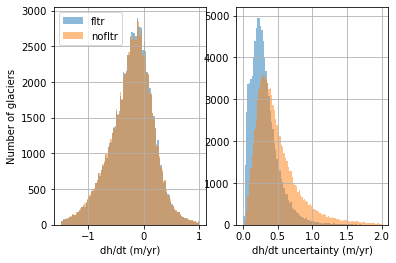

In [165]:
mb_hist_opt = {'bins':100, 'range':(-1.5, 1.0), 'alpha':0.5}
f,axa = plt.subplots(1,2)
mb_fltr['dhdt_ma'].hist(ax=axa[0], label='fltr', **mb_hist_opt)
mb_nofltr['dhdt_ma'].hist(ax=axa[0], label='nofltr', **mb_hist_opt)
mb_hist_opt['range'] = (0,2)
mb_fltr['dhdt_ma_sigma'].hist(ax=axa[1], label='fltr', **mb_hist_opt)
mb_nofltr['dhdt_ma_sigma'].hist(ax=axa[1], label='nofltr', **mb_hist_opt)
axa[0].legend()
axa[0].set_xlabel("dh/dt (m/yr)")
axa[0].set_ylabel("Number of glaciers")
axa[1].set_xlabel("dh/dt uncertainty (m/yr)")

Text(0.5, 0, 'Mass balance uncertainty (m w.e./yr)')

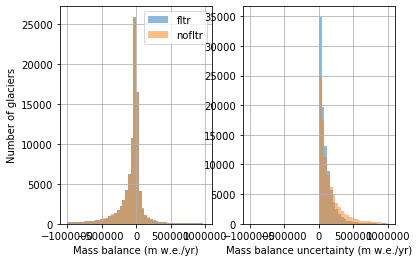

In [167]:
mb_hist_opt = {'bins':50, 'range':(-1E6,1E6),'alpha':0.5}
f,axa = plt.subplots(1,2)
mb_fltr['mb_m3wea'].hist(ax=axa[0], label='fltr', **mb_hist_opt)
mb_nofltr['mb_m3wea'].hist(ax=axa[0], label='nofltr', **mb_hist_opt)
#mb_hist_opt['range'] = (0,2)
mb_fltr['mb_m3wea_sigma'].hist(ax=axa[1], label='fltr', **mb_hist_opt)
mb_nofltr['mb_m3wea_sigma'].hist(ax=axa[1], label='nofltr', **mb_hist_opt)
axa[0].legend()
axa[0].set_xlabel("Mass balance (m w.e./yr)")
axa[0].set_ylabel("Number of glaciers")
axa[1].set_xlabel("Mass balance uncertainty (m w.e./yr)")

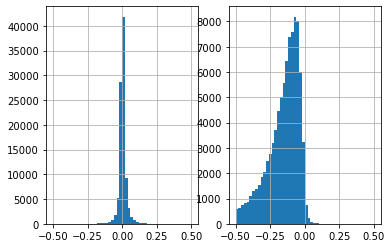

In [168]:
f,axa = plt.subplots(1,2)
mb_diff['dhdt_ma'].hist(ax=axa[0],bins=50, range=(-0.5, 0.5))
mb_diff['dhdt_ma_sigma'].hist(ax=axa[1],bins=50, range=(-0.5, 0.5))

## Evaluate percent of glacier polygon covered by dh/dt map

Text(0.5, 0, 'Percent of polygon with valid data')

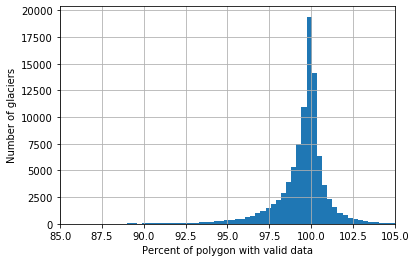

In [30]:
ax = mb_df['valid_area_perc'].hist(bins=128)
ax.set_xlim(85, 105)
ax.set_ylabel("Number of glaciers")
ax.set_xlabel("Percent of polygon with valid data")

In [31]:
#95th percentile of coverage
np.percentile(mb_df['valid_area_perc'], 5)

96.617

In [178]:
mb_df['valid_area_perc'].mean()

99.5031852533496

In [190]:
np.percentile(mb_df['valid_area_perc'], (10))

97.755

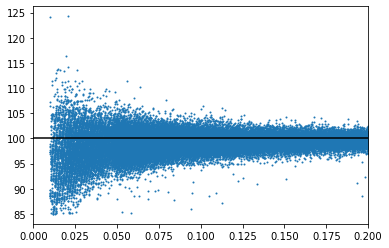

In [32]:
#Glacier area vs. percent coverage
f,ax = plt.subplots()
ax.scatter(mb_df['area_m2']/1E6, mb_df['valid_area_perc'], s=1)
ax.set_xlim(0,0.2)
ax.axhline(100,color='k')

## Final count of DEMs in each stack

In [72]:
#Generate text files from valid DEMs that were included in stacks
#cd /nobackupp8/deshean/hma/combined_aster_wv/dem_align_ASTER_WV_index_2000-2018_aea_stack
#parallel --progress 'wc -l {}/*fn_list.txt > {}/stack_count.txt' ::: 1*
#cat 1*/stack_count.txt > stack_count.txt

In [73]:
combined_count_fn = '/nobackupp8/deshean/hma/combined_aster_wv/dem_align_ASTER_WV_index_2000-2018_aea_stack/stack_count.txt'
aster_count_fn = '/nobackup/deshean/hma/aster/dsm/dem_align_ASTERonly/dem_align_ASTERonly_index_2000-2018_aea_stack/stack_count.txt'

In [74]:
def count_proc(count_fn):
    count_df = pd.read_csv(count_fn, sep=' ', names=['stack_count', 'stack_name'])
    count_df['RGIId'] = count_df['stack_name'].str.split('/',1).str[0]
    count_df.set_index('RGIId', inplace=True)
    return count_df

In [ ]:
combined_count_df = count_proc(combined_count_fn)
aster_count_df = count_proc(aster_count_fn)

In [68]:
combined_count_df['stack_count'].median()

35.0

In [67]:
aster_count_df['stack_count'].median()

33.0

Text(0, 0.5, 'Number of stacks')

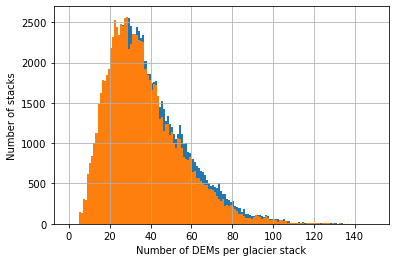

In [69]:
ax = combined_count_df['stack_count'].hist(bins=np.arange(0,150))
aster_count_df['stack_count'].hist(bins=np.arange(0,150))
ax.set_xlabel("Number of DEMs per glacier stack")
ax.set_ylabel("Number of stacks")

In [70]:
combined_count_df['aster_stack_count'] = aster_count_df['stack_count']

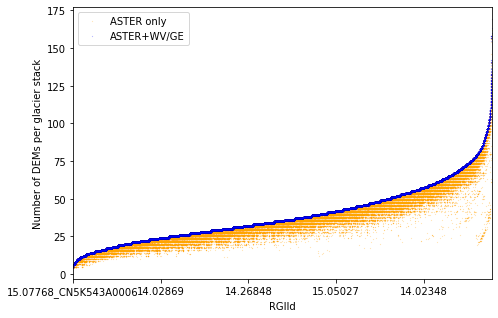

In [71]:
f,ax = plt.subplots(figsize=(7.5,5))
combined_count_df.sort_values(by='stack_count')['aster_stack_count'].plot(ax=ax, color='orange', lw=0, marker='.', ms=0.2, label='ASTER only')
combined_count_df.sort_values(by='stack_count')['stack_count'].plot(ax=ax, color='blue', lw=0, marker='.', ms=0.2, label='ASTER+WV/GE')
ax.set_ylabel("Number of DEMs per glacier stack")
plt.legend(loc='upper left')

In [72]:
combined_count_df['diff'] = combined_count_df['stack_count'] - combined_count_df['aster_stack_count']

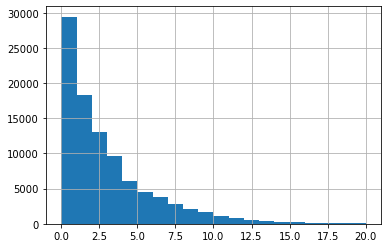

In [78]:
combined_count_df['diff'].hist(bins=20, range=(0,20))

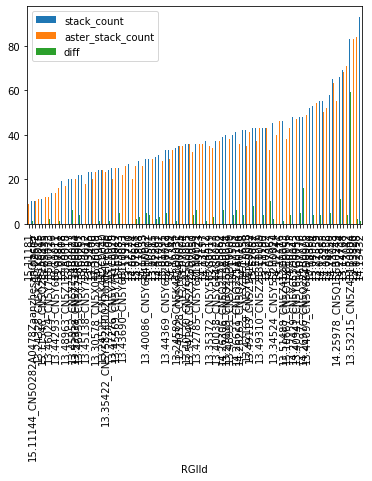

In [80]:
combined_count_df.sample(100).sort_values(by='stack_count').plot.bar()

## Total glacier area covered

In [43]:
#MB total area
mb_area = glac_df_mb.area.sum()/1E6
#RGI total area
rgi_area = glac_df['Area'].sum()
#rgi_area = glac_df.area.sum()/1E6
print('MB area: %0.2f km^2' % mb_area)
print('RGI area: %0.2f km^2' % rgi_area)
print('Percent coverage: %0.2f%%' % (100*mb_area/rgi_area))

MB area: 97002.70 km^2
RGI area: 97300.12 km^2
Percent coverage: 99.69%


In [44]:
#Total RGI glacier count
rgi_count = 95608 - 72 #some RGI 10 included in our gpkg
mb_count = glac_df_mb.shape[0]
print('MB count: %i' % mb_count)
print('RGI count: %i' % rgi_count)
print('Percent coverage: %0.2f%%' % (100*mb_count/rgi_count))

MB count: 94436
RGI count: 95536
Percent coverage: 98.85%


## Sort by area

In [45]:
glac_df_mb_sort = glac_df_mb.sort_values(by='area_m2', ascending=False)

(-2, 2)

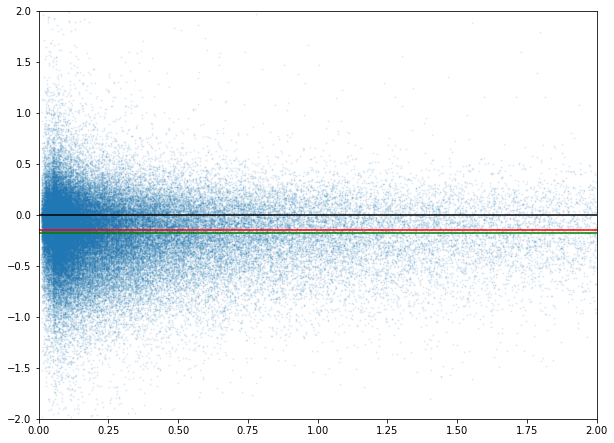

In [47]:
f,ax = plt.subplots(figsize=(10,7.5))
ax.scatter(glac_df_mb['Area'], glac_df_mb['mb_mwea'], s=1, alpha=0.1)
ax.axhline(0,c='k')
ax.axhline(glac_df_mb['mb_mwea'].median(),c='r')
ax.axhline(glac_df_mb['mb_mwea'].mean(),c='g')
ax.set_xlim(0,2)
ax.set_ylim(-2, 2)

(0, 100)

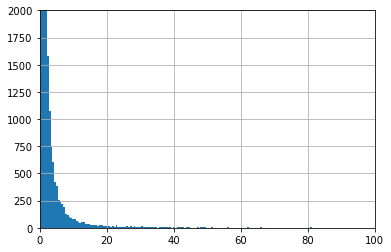

In [83]:
ax = glac_df_mb['Area'].hist(bins=2000)
ax.set_ylim(0,2000)
ax.set_xlim(0,100)

(-10000000.0, 10000000.0)

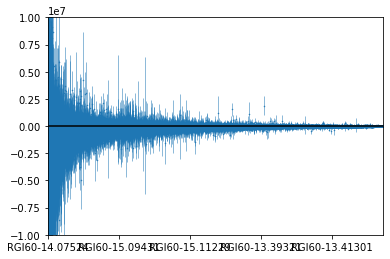

In [196]:
#Plot mb and error for all glaciers, sorted by area
f, ax = plt.subplots()
glac_df_mb_sort['mb_m3wea'].plot(marker='.', markersize=1, ls='none', lw=0.5, \
                                 yerr=glac_df_mb_sort['mb_m3wea_sigma'], ax=ax)
ax.axhline(0, color='k', zorder=99)
ax.set_ylim(-0.1E8, 0.1E8)

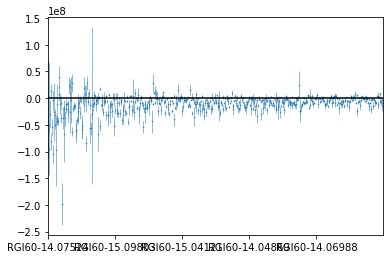

In [197]:
f, ax = plt.subplots()
cutoff = 500
glac_df_mb_sort['mb_m3wea'].head(cutoff).plot(marker='.', markersize=1, ls='none', lw=0.5, \
                                 yerr=glac_df_mb_sort['mb_m3wea_sigma'].head(cutoff), ax=ax)
ax.axhline(0, color='k', zorder=99)

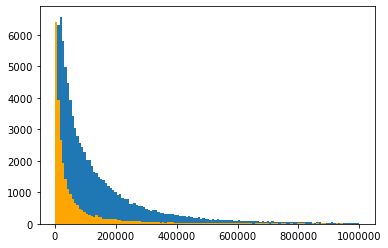

In [198]:
f, ax = plt.subplots()
asdf = ax.hist(glac_df_mb['mb_m3wea_sigma'], bins=128, range=(0,1E6))
asdf = ax.hist(glac_df_mb['mb_m3wea'], bins=128, range=(0,1E6), color='orange')
#mb_df['mb_m3wea'].hist(bins=128, range=(0,1E6),ax=ax)

In [46]:
idx = slice(0,100000)
print(glac_df_mb['mb_m3wea'].iloc[idx].sum()/1E9)
print(rss(glac_df_mb['mb_m3wea_sigma'].iloc[idx])/1E9)
print(glac_df_mb['mb_m3wea_sigma'][idx].sum()/1E9)

-18.975358849018004
0.3254717068424677
21.524032616649997


In [47]:
def mb_hist(df, col='mb_mwea', hist_clim=(-1.5, 1.5), outlier_clim=None):
    f, ax = plt.subplots(figsize=(4,4))
    ax.set_xlabel('Mass balance (m we/yr)')
    ax.set_ylabel('Number of glaciers')
    ax.set_xlim(*hist_clim)
    df[col].hist(range=hist_clim, bins=64, grid=False)
    ax.axvline(0, lw=0.5, color='k')
    if outlier_clim is not None:
        ax.axvline(outlier_clim[0], lw=1.0, color='r', ls=':')
        ax.axvline(outlier_clim[1], lw=1.0, color='r', ls=':')
    ax.minorticks_on()
    return ax

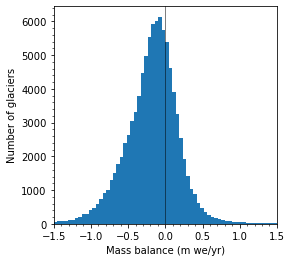

In [48]:
ax = mb_hist(glac_df_mb)

## Remove Outliers

Removing outliers
-6.29
13.287
Removing outliers (-2.84, 2.84)
94436 records before outlier removal
94389 records after outlier removal


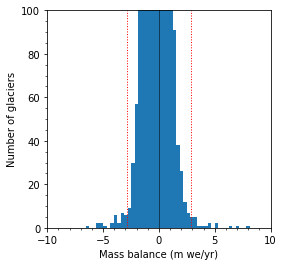

In [49]:
remove_outliers = True
if remove_outliers:
    print("Removing outliers")

    print(glac_df_mb['mb_mwea'].min())
    print(glac_df_mb['mb_mwea'].max())
    
    if False:
        #outlier_perc = (0.01, 0.99)
        outlier_perc = (0.0001, 0.9999)
        outlier_clim = (glac_df_mb['mb_mwea'].quantile(outlier_perc[0]), glac_df_mb['mb_mwea'].quantile(outlier_perc[1]))
    else:
        std_f = 7
        outlier_clim = glac_df_mb['mb_mwea'].mean() - std_f*glac_df_mb['mb_mwea'].std()
        #outlier_clim = glac_df_mb['mb_mwea'].median() - std_f*malib.mad(glac_df_mb['mb_mwea'].values)
        outlier_clim = (outlier_clim, -outlier_clim)
    
    ax = mb_hist(glac_df_mb, hist_clim=(-10,10), outlier_clim=outlier_clim)
    ax.set_ylim(0,100)
    
    print("Removing outliers (%0.2f, %0.2f)" % (outlier_clim))
    #inlier_idx = np.abs(glac_df_mb['mb_mwea'] - glac_df_mb['mb_mwea'].mean()) <= (3*glac_df_mb['mb_mwea'].std())
    inlier_idx = (glac_df_mb['mb_mwea'] >= outlier_clim[0]) & (glac_df_mb['mb_mwea'] <= outlier_clim[1])

    print("%i records before outlier removal" % (glac_df_mb.shape[0]))
    print("%i records after outlier removal" % (glac_df_mb[inlier_idx].shape[0]))
    glac_df_mb = glac_df_mb[inlier_idx]

In [50]:
idx = slice(0,100000)
print(glac_df_mb['mb_m3wea'].iloc[idx].sum()/1E9)
print(rss(glac_df_mb['mb_m3wea_sigma'].iloc[idx])/1E9)
print(glac_df_mb['mb_m3wea_sigma'][idx].sum()/1E9)

-18.962813928534
0.32543324598947004
21.500476323924005


# Spatial autocorrelation factor Acorf vs. glacier area A
A quick look at the coefficient used to scale area 

In [28]:
np.sqrt(1000000/np.pi)

564.1895835477563

In [30]:
np.sqrt(1/5)

0.4472135954999579

31415.926535897932
785398.1633974483
3141592.653589793


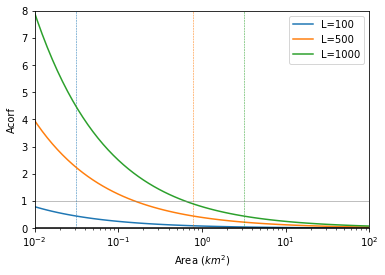

In [25]:
f,ax = plt.subplots()

areaa = np.logspace(3, 9, 100)
for L in [100,500,1000]:
    #L = np.array(1000)
    Acor = np.pi*(L**2)
    print(Acor)
    Acorf = np.sqrt(Acor/(5*areaa))
    color = next(ax._get_lines.prop_cycler)['color']
    ax.semilogx(areaa/1E6, Acorf, color=color, label='L=%i' % L)
    ax.axvline(Acor/1E6, color=color, lw=0.5, ls='--')

ax.axhline(1.0, color='0.5', lw=0.5)
ax.axhline(0.0, color='k')
#ax.axvline(Acor, color='r')
ax.set_xlabel('Area ($km^2$)')
ax.set_ylabel('Acorf')
ax.legend()
ax.set_ylim(0,8)
ax.set_xlim(0.01,100)
f.savefig('Acor_plot.jpg')

In [468]:
L=32000
Acor = np.pi*(L**2)
Acor/1E6

3216.990877275948

In [469]:
hex_df.area.mean()/1E6

886.8100134752669

In [470]:
Acorf = np.sqrt(Acor/(5*region_df.area))
Acorf

himap_region
E. Hindu Kush           0.08
W. Himalaya             0.06
E. Himalaya             0.06
C. Himalaya             0.05
Karakoram               0.09
W. Pamir                0.08
Pamir Alay              0.09
N./W. Tien Shan         0.06
Dzhungarsky Alatau      0.13
W. Kunlun Shan          0.07
Nyainqentanglha         0.06
Gangdise Mtns           0.06
Hengduan Shan           0.04
Tibetan Interior Mtns   0.03
Tanggula Shan           0.07
E. Tibetan Mtns         0.04
Qilian Shan             0.06
E. Kunlun Shan          0.05
Altun Shan              0.11
E. Tien Shan            0.07
C. Tien Shan            0.08
E. Pamir                0.13
dtype: float64

In [472]:
glac_gdf_mb_hex_region_agg[('dhdt_ma_sigma_A','sum','sum')]/1E9

himap_region
Pamir Alay              0.62
E. Hindu Kush           0.81
W. Pamir                1.48
E. Pamir                0.37
W. Himalaya             2.15
N./W. Tien Shan         0.85
Karakoram               3.54
W. Kunlun Shan          1.42
C. Tien Shan            2.01
Dzhungarsky Alatau      0.19
C. Himalaya             2.53
Gangdise Mtns           0.35
Tibetan Interior Mtns   0.65
E. Tien Shan            0.92
Altun Shan              0.05
E. Kunlun Shan          0.75
E. Himalaya             1.28
Tanggula Shan           0.40
Nyainqentanglha         3.33
E. Tibetan Mtns         0.13
Qilian Shan             0.38
Hengduan Shan           0.55
Name: (dhdt_ma_sigma_A, sum, sum), dtype: float64

In [473]:
glac_gdf_mb_hex_region_agg[('dhdt_ma_sigma_A','sum','sum')]*Acorf/1E9

himap_region
Altun Shan              0.01
C. Himalaya             0.13
C. Tien Shan            0.16
Dzhungarsky Alatau      0.02
E. Himalaya             0.08
E. Hindu Kush           0.07
E. Kunlun Shan          0.04
E. Pamir                0.05
E. Tibetan Mtns         0.01
E. Tien Shan            0.06
Gangdise Mtns           0.02
Hengduan Shan           0.02
Karakoram               0.31
N./W. Tien Shan         0.05
Nyainqentanglha         0.20
Pamir Alay              0.06
Qilian Shan             0.02
Tanggula Shan           0.03
Tibetan Interior Mtns   0.02
W. Himalaya             0.13
W. Kunlun Shan          0.10
W. Pamir                0.11
dtype: float64

In [474]:
glac_gdf_mb_hex_region_agg[('dhdt_ma_sigma_A','sum','rss')]/1E9

himap_region
Pamir Alay              0.14
E. Hindu Kush           0.16
W. Pamir                0.21
E. Pamir                0.09
W. Himalaya             0.30
N./W. Tien Shan         0.15
Karakoram               0.46
W. Kunlun Shan          0.23
C. Tien Shan            0.38
Dzhungarsky Alatau      0.06
C. Himalaya             0.34
Gangdise Mtns           0.07
Tibetan Interior Mtns   0.14
E. Tien Shan            0.24
Altun Shan              0.02
E. Kunlun Shan          0.22
E. Himalaya             0.28
Tanggula Shan           0.11
Nyainqentanglha         0.51
E. Tibetan Mtns         0.05
Qilian Shan             0.08
Hengduan Shan           0.11
Name: (dhdt_ma_sigma_A, sum, rss), dtype: float64

## Binned mb by glacier polygon area

In [83]:
#bins=np.arange(0,500,1)
bins=np.logspace(-2,3,128)
bin_count, bin_edges, binnumber = scipy.stats.binned_statistic(glac_df_mb['Area'], glac_df_mb['mb_mwea'], statistic='count', bins=bins)
bin_mean, bin_edges, binnumber = scipy.stats.binned_statistic(glac_df_mb['Area'], glac_df_mb['mb_mwea'], statistic='mean', bins=bins)
bin_std, bin_edges, binnumber = scipy.stats.binned_statistic(glac_df_mb['Area'], glac_df_mb['mb_mwea'], statistic=np.std, bins=bins)
bin_median, bin_edges, binnumber = scipy.stats.binned_statistic(glac_df_mb['Area'], glac_df_mb['mb_mwea'], statistic='median', bins=bins)
#scipy.stats.median_absolute_deviation in version 1.3.0
bin_nmad, bin_edges, binnumber = scipy.stats.binned_statistic(glac_df_mb['Area'], glac_df_mb['mb_mwea'], statistic=malib.mad, bins=bins)

In [84]:
#bin_width = (bin_edges[1] - bin_edges[0])
#bin_centers = bin_edges[1:] - bin_width/2
bin_width = (bin_edges[:-1] - bin_edges[1:])
bin_centers = bin_edges[:-1] - bin_width/2

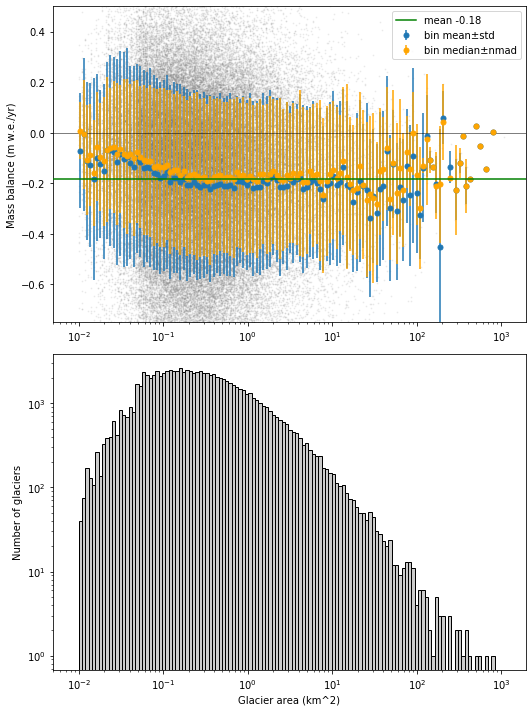

In [85]:
f,axa = plt.subplots(2, figsize=(7.5,10), sharex=True)
axa[0].scatter(glac_df_mb['Area'], glac_df_mb['mb_mwea'], s=1, c='0.5', alpha=0.1)
axa[0].errorbar(bin_centers, bin_mean, ls='none', yerr=bin_std, marker='o', markersize=5, label='bin mean\u00b1std')
axa[0].errorbar(bin_centers, bin_median, ls='none', c='orange', yerr=bin_nmad, marker='o', markersize=5, label='bin median\u00b1nmad')
axa[0].axhline(0,c='k',lw=0.5)
#axa[0].axhline(glac_df_mb['mb_mwea'].median(),c='r')
axa[0].axhline(glac_df_mb['mb_mwea'].mean(),c='g',zorder=999, label='mean %0.2f' % glac_df_mb['mb_mwea'].mean())
axa[0].set_ylim(-0.75,0.5)
axa[1].bar(bin_centers, bin_count, width=bin_width, edgecolor='k', facecolor='0.8')
#axa[1].bar(bin_centers, bin_count, edgecolor='k')
axa[1].set_xlabel('Glacier area (km^2)')
axa[0].set_xscale('log')
axa[0].set_ylabel('Mass balance (m w.e./yr)')
axa[1].set_yscale('log')
axa[1].set_ylabel('Number of glaciers')
axa[0].legend()
#axa[1].set_ylim(0,10)
#axa[0].set_xlim(bins[0], bins[-1])
axa[0].xaxis.set_tick_params(which='both', labelbottom=True)
plt.tight_layout()
fig_fn = os.path.splitext(glac_shp_join_fn)[0] + out_fn_suffix + '_area_v_mb.png'
#f.savefig(fig_fn, **plt_opt)

## Consider total mb for small and large glaciers

In [43]:
area_thresh = 0.1 #km2
small_idx = glac_df_mb['Area'] < area_thresh
big_idx = glac_df_mb['Area'] >= area_thresh

In [44]:
print(glac_df_mb['mb_mwea'][small_idx].mean())
print(glac_df_mb['mb_mwea'][small_idx].median())
print(glac_df_mb['mb_m3wea'][small_idx].sum()/1E9)
print(glac_df_mb['Area'][small_idx].sum())

-0.13279346399868788
-0.105
-0.206847295014
1448.8449999999998


In [45]:
print(glac_df_mb['mb_mwea'][big_idx].mean())
print(glac_df_mb['mb_mwea'][big_idx].median())
print(glac_df_mb['mb_m3wea'][big_idx].sum()/1E9)
print(glac_df_mb['Area'][big_idx].sum())

-0.19892844387937317
-0.168
-18.75596663352
95544.57500000001


In [46]:
mb_gt_lt = glac_df_mb['Area'][small_idx].sum()*glac_df_mb['mb_mwea'][small_idx].mean()/1000
mb_gt_lt

-0.19239714634717894

In [47]:
mb_gt_gt = glac_df_mb['Area'][small_idx].sum()*glac_df_mb['mb_mwea'][big_idx].mean()/1000
mb_gt_gt

-0.28821648127241034

In [48]:
# Difference in total mass balance (Gt/yr) if applying specific mass balance from larger glaciers to all glaciers under 0.1 km2
mb_gt_gt - mb_gt_lt

-0.0958193349252314

## Maps of glaciers binned by area

In [147]:
bins=np.logspace(-2,3,11)
bins

array([1.00000000e-02, 3.16227766e-02, 1.00000000e-01, 3.16227766e-01,
       1.00000000e+00, 3.16227766e+00, 1.00000000e+01, 3.16227766e+01,
       1.00000000e+02, 3.16227766e+02, 1.00000000e+03])

In [148]:
df_cut = pd.cut(glac_df_mb['Area'], bins)

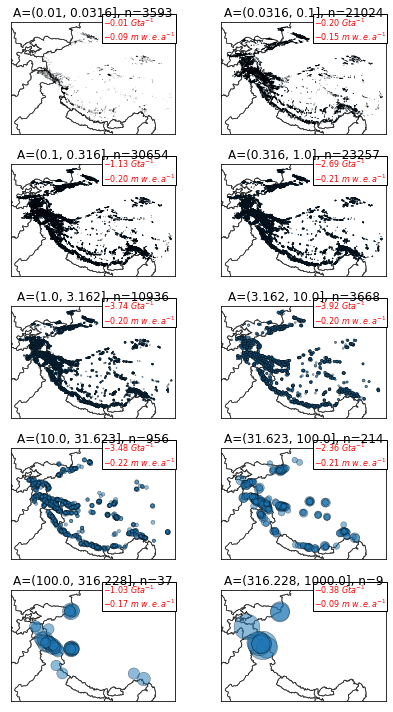

In [149]:
rc = (5,2)
f,axa = plt.subplots(*rc, figsize=(6,10), sharex=True, sharey=True)
axa = axa.ravel()

for n,i in enumerate(glac_df_mb.groupby(df_cut)):
    border_df.plot(ax=axa[n], facecolor='none', edgecolor='0.2', lw=0.7)
    axa[n].scatter(i[1]['x'], i[1]['y'], s=i[1]['Area'], label=i[0], edgecolor='k', lw=0.5, alpha=0.5)
    axa[n].set_title('A=%s, n=%i' % (i[0], i[1].shape[0]))
    mb_gta = i[1]['mb_m3wea'].sum()/1E9
    mb_mwea = i[1]['mb_m3wea'].sum()/i[1]['area_m2'].sum()
    #mb_label = r'$%0.2f Gta^-1$' % mb_gta
    #axa[n].annotate(mb_label, xy=(0.05, 0.05), xycoords='axes fraction', color='r')
    mb_label = r'$%0.2f\ Gta^{-1}$' % mb_gta +'\n' + '$%0.2f\ m\ w.e.a^{-1}$' % mb_mwea
    #axa[n].annotate(mb_label, xy=(0.01, 0.06), xycoords='axes fraction', color='r', fontsize=8)
    axa[n].text(0.56, 0.84, mb_label, transform=axa[n].transAxes, color='r', fontsize=8, \
    #axa[n].text(0.56, 0.8, mb_label, transform=axa[n].transAxes, color='r', fontsize=7, \
                bbox=dict(facecolor='white', alpha=1.0, edgecolor='k', pad=1.0))
    pltlib.hide_ticks(axa[n])

axa[0].set_xlim(extent[0], extent[2])
axa[0].set_ylim(extent[1], extent[3])
axa[0].set_aspect('equal')

plt.tight_layout()
#plt.suptitle("Spatial distribution of glaciers, binned by area (km2)")
fig_fn = os.path.splitext(glac_shp_join_fn)[0] + out_fn_suffix + '_area_spatial.png'
f.savefig(fig_fn, **plt_opt)

In [150]:
i[1]['mb_m3wea'].sum()/i[1]['area_m2'].sum()

-0.08586631367961631

In [151]:
i[1].columns

Index(['GLIMSId', 'BgnDate', 'EndDate', 'CenLon', 'CenLat', 'O1Region',
       'O2Region', 'Area', 'Zmin', 'Zmax', 'Zmed', 'Slope', 'Aspect', 'Lmax',
       'Status', 'Connect', 'Form', 'TermType', 'Surging', 'Linkages', 'Name',
       'geometry', 'mascon', 'area_deg', 'area_km2', 'basin', 'elev_flag',
       'lat_center', 'lat_span', 'location', 'lon_center', 'lon_span', 'qdgc',
       'lat', 'lon', 'areakm2', 'id', 'left', 'top', 'right', 'bottom',
       'kaab_region', 'himap_region', 'basin_name', 'DN_left', 'ENDO', 'ENDO',
       'DN_right', 'x', 'y', 'z_med', 'z_min', 'z_max', 'z_slope', 'z_aspect',
       'dhdt_ma', 'dhdt_ma_sigma', 'mb_mwea', 'mb_mwea_sigma', 'area_m2',
       'mb_m3wea', 'mb_m3wea_sigma', 't1', 't2', 'dt', 'valid_area_perc',
       'H_m', 'debris_m', 'perc_debris', 'perc_pond', 'perc_clean', 'vm_ma',
       'mb_Gta', 'mb_Gta_sigma'],
      dtype='object')

In [152]:
glac_df_mb['mb_m3wea'].groupby(df_cut).agg('sum')/1E9

Area
(0.01, 0.0316]      -0.01
(0.0316, 0.1]       -0.20
(0.1, 0.316]        -1.13
(0.316, 1.0]        -2.69
(1.0, 3.162]        -3.74
(3.162, 10.0]       -3.92
(10.0, 31.623]      -3.48
(31.623, 100.0]     -2.36
(100.0, 316.228]    -1.03
(316.228, 1000.0]   -0.38
Name: mb_m3wea, dtype: float64

## RGI Polygon Date

In [176]:
rgi_decyear=glac_df_mb['BgnDate'].astype(int)/10000
miny = np.floor(rgi_decyear.min())
maxy = np.ceil(rgi_decyear.max())
print(miny, maxy)

1998.0 2014.0


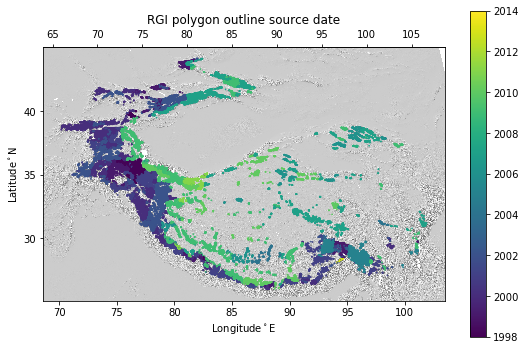

In [50]:
f,ax = plt.subplots(figsize=(9,6))
sc = ax.scatter(glac_df_mb['x'], glac_df_mb['y'], c=rgi_decyear, s=0.5, vmin=miny, vmax=maxy)
plt.colorbar(sc)
ax.set_title("RGI polygon outline source date")
ax.set_aspect('equal', adjustable='box')
add_hs(hs, ax, hs_clim, hs_extent_cartopy)
pltlib.latlon_ticks(ax, in_crs=glac_crs)

#glac_df_mb.plot.scatter(x='x', y='y', c='BgnDate')
rgi_date_fig_fn = os.path.splitext(glac_shp_join_fn)[0]+'_RGI_sourceyear_fig.png'
f.savefig(rgi_date_fig_fn, **plt_opt)

In [51]:
# Check min/max mass numbers
rgi_idx = [glac_df_mb['mb_m3wea'].idxmax(),]
rgi_idx.append(glac_df_mb['mb_m3wea'].idxmin())
glac_df_mb.loc[rgi_idx]

,GLIMSId,BgnDate,EndDate,CenLon,CenLat,O1Region,O2Region,Area,Zmin,Zmax,Zmed,Slope,Aspect,Lmax,Status,Connect,Form,TermType,Surging,Linkages,Name,geometry,mascon,area_deg,area_km2,basin,elev_flag,lat_center,lat_span,location,lon_center,lon_span,qdgc,lat,lon,areakm2,id,left,top,right,bottom,kaab_region,himap_region,basin_name,DN_left,ENDO,ENDO,DN_right,x,y,z_med,z_min,z_max,z_slope,z_aspect,dhdt_ma,dhdt_ma_sigma,mb_mwea,mb_mwea_sigma,area_m2,mb_m3wea,mb_m3wea_sigma,t1,t2,dt,valid_area_perc,H_m,debris_m,perc_debris,perc_pond,perc_clean,vm_ma,mb_Gta,mb_Gta_sigma
RGI60-14.04404,G075438E36192N,19980813,-9999999,75.44,36.19,14,2,203.34,3314,7718,5391,23.60,21,31640,0,0,0,0,3,9,Khurdopin Glacier,POLYGON ((-832770.2283471222 56816.06814658215...,36N76E,1.00,"12,373.54","5,051.00",0.00,36.00,1.00,80.00,76.08,1.24,E075N36C,36.25,75.25,2493.27629,2985,"-842,814.95","71,740.08","-813,947.44","46,740.08",Karakoram,Karakoram,Indus,5367,0,0,51,"-838,312.43","62,425.23","5,369.00","3,295.32","7,510.49",15.66,143.91,0.23,0.01,0.20,0.06,"203,335,845.65","39,691,132.12","5,224,127.20","2,000.41","2,018.41",18.00,100.00,142.66,0.18,15.82,0.45,83.72,53.99,0.04,0.01
RGI60-15.11909,G096657E29334N,20050908,-9999999,96.66,29.33,15,3,179.59,3980,6341,5207,12.90,78,32403,0,0,1,0,1,9,Yagnung,POLYGON ((1108921.644128018 -679012.9025896977...,29N97E,1.00,"12,406.28","5,035.00",0.00,29.00,1.00,80.00,96.88,1.15,E096N29D,29.25,96.75,2693.48103,11025,"1,105,742.21","-678,259.92","1,134,609.72","-703,259.92",Nyainqentangla,Nyainqentanglha,Brahmaputra,21,0,0,51,"1,117,064.38","-685,115.41","5,166.14","3,921.18","6,317.99",9.99,116.07,-1.30,0.01,-1.10,0.09,"179,589,230.18","-198,383,836.77","24,336,811.74","2,000.41","2,018.41",18.00,99.96,171.93,0.14,10.37,0.13,89.51,61.99,-0.20,0.02


In [52]:
#mb_m3wea_sigma_thresh = glac_df_mb['mb_m3wea_sigma'].quantile(0.99)
#glac_df_mb = glac_df_mb[glac_df_mb['mb_m3wea_sigma'] < mb_m3wea_sigma_thresh]

In [521]:
#Evaluate SNR
glac_df_mb['mb_m3wea_sigma_perc'] = glac_df_mb['mb_m3wea_sigma']/glac_df_mb['mb_m3wea'].abs()

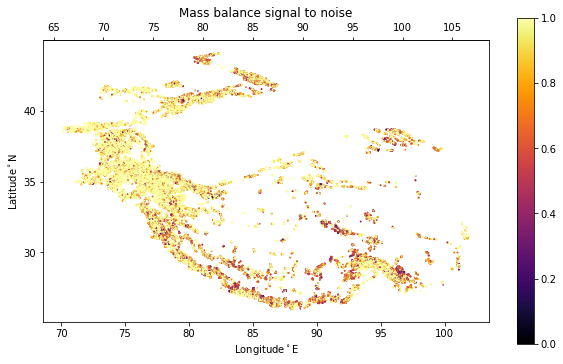

In [522]:
f,ax = plt.subplots(figsize=(10,6))
sc = ax.scatter(glac_df_mb['x'], glac_df_mb['y'], c=glac_df_mb['mb_m3wea_sigma_perc'], s=0.5, cmap='inferno', vmin=0, vmax=1)
plt.colorbar(sc)
ax.set_aspect('equal')
ax.set_title("Individual glacier mass balance percent uncertainty")
pltlib.latlon_ticks(ax, in_crs=glac_crs)
#glac_df_mb.plot.scatter(x='x', y='y', c='BgnDate')
#rgi_date_fig_fn = os.path.splitext(glac_shp_join_fn)[0]+'_SNR_fig.png'
#f.savefig(rgi_date_fig_fn, **plt_opt)

# Aggregation over hexagon bins for independent spatial samples

In [286]:
if hex_shp_fn is not None:
    glac_df_mb_hex = spatial_aggregate(glac_df, glac_df_mb, hex_df, hex_col)

In [287]:
#glac_gdf_mb_hex = gpd.GeoDataFrame(glac_df_mb_hex, geometry=hex_df.geometry)
from shapely.geometry import Point
hex_geom = [Point(p) for p in zip(glac_df_mb_hex['centroid_x'], glac_df_mb_hex['centroid_y'])]
glac_gdf_mb_hex = gpd.GeoDataFrame(glac_df_mb_hex, geometry=hex_geom)

In [277]:
glac_df_mb_hex.shape

(1713, 86)

In [278]:
glac_df_mb_hex.dropna(axis=0, how='any').shape

(1602, 86)

In [279]:
#Note, some nan values for some columns here
glac_df_mb_hex.head()

,"(area_m2, mean)","(area_m2, sum)","(mb_mwea, mean)","(mb_mwea, median)","(mb_mwea, std)","(mb_mwea, sum)","(mb_mwea, size)","(mb_mwea_sigma, mean)","(mb_mwea_sigma, sum)","(mb_mwea_sigma, rss)","(dhdt_ma, mean)","(dhdt_ma, median)","(dhdt_ma, std)","(dhdt_ma, sum)","(dhdt_ma_sigma, mean)","(dhdt_ma_sigma, sum)","(dhdt_ma_sigma, rss)","(dhdt_ma_sigma, rms)","(dhdt_ma_A, mean)","(dhdt_ma_A, sum)","(dhdt_ma_A_abs, mean)","(dhdt_ma_A_abs, sum)","(dhdt_ma_sigma_A, mean)","(dhdt_ma_sigma_A, sum)","(dhdt_ma_sigma_A, rss)","(dhdt_ma_sigma_A, rms)","(mb_m3wea, mean)","(mb_m3wea, median)","(mb_m3wea, sum)","(mb_m3wea_sigma, mean)","(mb_m3wea_sigma, sum)","(mb_m3wea_sigma, rss)","(mb_m3wea_sigma, rms)","(mb_Gta, sum)","(mb_Gta_sigma, mean)","(mb_Gta_sigma, sum)","(mb_Gta_sigma, rss)","(mb_Gta_sigma, rms)","(Area, mean)","(Area, sum)","(t1, mean)","(t1, amin)","(t1, amax)","(t2, mean)","(t2, amin)","(t2, amax)","(dt, mean)","(dt, amin)","(dt, amax)","(z_med, mean)","(z_med, median)","(z_med, amin)","(z_med, amax)","(dhdt_ma, m3_to_ma)","(dhdt_ma_sigma, perc)","(dhdt_ma_sigma, perc_to_ma)","(mb_m3wea_sigma, sum_perc)","(mb_m3wea_abs, sum)","(mb_m3wea_sigma, sum_perc_to_m3wea)","(mb_m3wea_sigma, sum_perc_to_Gta)","(mb_m3wea_sigma, sum_perc_to_mwea)","(mb_mwea, count)","(mb_mwea_sigma, rss_mean)","(Area_all, mean)","(Area_all, sum)","(Area, perc)","(mb_mwea, total_m3a)","(mb_mwea, total_Gta)","(mb_mwea, Gta_to_mwea)","(mb_mwea_sigma, Gta_to_mwea)","(mb_mwe_cum, mean)","(mb_mwe_cum, total_m3)","(mb_mwe_cum, total_Gt)","(meltwater, count)","(meltwater, total_m3a)","(meltwater, total_m3a_sigma)","(meltwater, total_Gta)","(meltwater, total_Gta_sigma)","(meltwater, total_mmSLEa)","(meltwater, total_mmSLEa_sigma)","(meltwater_cum, total_m3)","(meltwater_cum, total_Gt)","(meltwater_cum, total_mmSLE)",centroid_x,centroid_y,geometry
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2341,"21,039,809.43","1,325,507,993.88",-0.04,-0.05,0.19,-2.68,63.00,0.30,18.74,2.76,-0.05,-0.06,0.23,-3.15,0.35,21.94,3.24,0.41,"-1,238,670.51","-78,036,241.87","1,263,094.15","79,574,931.30","2,174,674.26","137,004,478.28","108,998,576.23","13,732,529.81","-1,055,431.40","-5,490.90","-66,492,178.08","1,865,789.47","117,544,736.85","93,039,082.66","11,721,822.62",-0.07,0.00,0.12,0.09,0.01,21.04,"1,325.51","2,000.41","2,000.41","2,000.41","2,018.41","2,018.41","2,018.41",18.00,18.00,18.00,"5,667.13","5,687.08","5,071.26","7,060.97",-0.06,1.72,1.72,1.89,"67,638,691.61","127,992,171.58",0.13,0.10,63,0.04,21.04,"1,325.51",100.00,"-56,386,732.06",-0.06,-0.05,0.09,-0.77,"-1,014,961,177.14",-1.01,38.00,"-67,146,209.75","116,474,412.28",-0.07,0.12,-0.00,0.00,"-1,208,631,775.55",-1.21,-1.21,"-705,614.78","-22,300.00",POINT (-705614.7779106668 -22300.00000000032)
2196,"13,265,250.74","1,140,811,563.68",0.02,0.00,0.45,2.09,86.00,0.60,51.21,6.77,0.03,0.00,0.53,2.46,0.70,60.07,7.95,0.86,"127,763.77","10,987,684.31","259,246.77","22,295,222.26","1,417,692.94","121,921,592.41","80,102,239.04","8,637,646.58","108,527.13",101.00,"9,333,333.07","1,207,065.71","103,807,650.97","68,213,543.00","7,355,655.51",0.01,0.00,0.10,0.07,0.01,13.27,"1,140.81","2,000.41","2,000.41","2,000.41","2,018.41","2,018.41","2,018.41",18.00,18.00,18.00,"5,530.38","5,509.25","4,533.83","7,821.87",0.01,5.47,5.47,5.64,"18,950,938.92","106,866,160.78",0.11,0.09,86,0.08,12.97,"1,140.99",99.98,"27,742,050.73",0.03,0.01,0.09,0.44,"499,356,913.19",0.50,42.00,"-4,828,733.73","16,039,982.48",-0.00,0.02,-0.00,0.00,"-86,917,207.18",-0.09,-0.09,"-761,040.40","9,700.00",POINT (-761040.4037528707 9700)
1320,"14,591,332.17","933,845,259.08",0.06,0.06,0.25,3.86,64.00,0.36,22.72,3.17,0.07,0.06,0.30,4.54,0.42,26.58,3.72,0.46,"-1,431,018.94","-91,585,211.91","2,517,954.48","161,149,087.01","1,422,858.93","91,062,971.27","58,854,650.65","7,356,831.33","-1,215,515.56","6,476.22","-77,792,995.92","1,241,959.83","79,485,429.08","51,313,666.87","6,414,208.36",-0.08,0.00,0.08,0.05,0.01,14.59,933.8

In [280]:
glac_df_mb_hex.columns

Index([                    ('area_m2', 'mean'),
                            ('area_m2', 'sum'),
                           ('mb_mwea', 'mean'),
                         ('mb_mwea', 'median'),
                            ('mb_mwea', 'std'),
                            ('mb_mwea', 'sum'),
                           ('mb_mwea', 'size'),
                     ('mb_mwea_sigma', 'mean'),
                      ('mb_mwea_sigma', 'sum'),
                      ('mb_mwea_sigma', 'rss'),
                           ('dhdt_ma', 'mean'),
                         ('dhdt_ma', 'median'),
                            ('dhdt_ma', 'std'),
                            ('dhdt_ma', 'sum'),
                     ('dhdt_ma_sigma', 'mean'),
                      ('dhdt_ma_sigma', 'sum'),
                      ('dhdt_ma_sigma', 'rss'),
                      ('dhdt_ma_sigma', 'rms'),
                         ('dhdt_ma_A', 'mean'),
                          ('dhdt_ma_A', 'sum'),
                     ('dhdt_ma_A_abs', '

In [57]:
glac_df_mb_hex[('dhdt_ma_sigma', 'sum')].describe()

count   1,713.00
mean       24.74
std        28.77
min         0.05
25%         4.15
50%        14.75
75%        35.54
max       234.03
Name: (dhdt_ma_sigma, sum), dtype: float64

In [197]:
glac_df_mb_hex[('mb_m3wea', 'sum')]/1E9

id
2341   -0.07
2196    0.01
1320   -0.08
1978    0.06
2051   -0.06
        ... 
3429    0.00
4660   -0.00
3462    0.00
2931   -0.00
5434   -0.00
Name: (mb_m3wea, sum), Length: 1713, dtype: float64

In [196]:
glac_df_mb_hex[('mb_m3wea_sigma', 'sum_perc_to_m3wea')]/1E9

id
2341   -0.13
2196    0.05
1320   -0.06
1978    0.06
2051   -0.06
        ... 
3429    0.00
4660   -0.00
3462    0.00
2931   -0.00
5434   -0.00
Name: (mb_m3wea_sigma, sum_perc_to_m3wea), Length: 1713, dtype: float64

In [213]:
glac_df_mb_hex[('mb_mwea', 'Gta_to_mwea')]

id
2341   -0.05
2196    0.01
1320   -0.08
1978    0.07
2051   -0.09
        ... 
3429    0.26
4660   -0.10
3462    0.63
2931   -0.21
5434   -0.06
Name: (mb_mwea, Gta_to_mwea), Length: 1713, dtype: float64

In [211]:
glac_df_mb_hex[('mb_m3wea_sigma', 'sum_perc_to_mwea')]

id
2341   -0.09
2196    0.05
1320   -0.06
1978    0.07
2051   -0.08
        ... 
3429    0.33
4660   -0.21
3462    1.26
2931   -0.26
5434   -0.16
Name: (mb_m3wea_sigma, sum_perc_to_mwea), Length: 1713, dtype: float64

## Define percent error for Area and density

In [186]:
sigma_A_perc = 0.1
sigma_A = sigma_A_perc * glac_df_mb_hex[('Area_all', 'sum')] * 1E6
sigma_rho = 0.06
rho = 0.850
sigma_rho_perc = sigma_rho/rho
print(100*sigma_rho_perc)

7.0588235294117645


In [59]:
rss(np.sqrt((glac_df_mb_hex[('dhdt_ma_sigma', 'mean')] * 1E6*glac_df_mb_hex[('Area_all', 'sum')])**2 + \
(sigma_A*glac_df_mb_hex[('dhdt_ma', 'mean')])**2))/1E9

2.444217903350028

In [60]:
np.sqrt((glac_df_mb_hex[('dhdt_ma_sigma', 'mean')] * 1E6*glac_df_mb_hex[('Area_all', 'sum')])**2 + \
(sigma_A*glac_df_mb_hex[('dhdt_ma', 'mean')])**2).sum()/1E9

43.753079629618384

In [61]:
rss(np.sqrt((glac_df_mb_hex[('dhdt_ma_sigma_A', 'sum')] * 1E6*glac_df_mb_hex[('Area_all', 'sum')])**2 + \
((sigma_A * 1E6 * glac_df_mb_hex[('Area_all', 'sum')])*glac_df_mb_hex[('dhdt_ma', 'mean')])**2))/1E9

412541683.8241649

In [62]:
glac_df_mb_hex[('dhdt_ma_sigma_A', 'sum')].head()

id
2341   137,004,478.28
2196   121,921,592.41
1320    91,062,971.27
1978    64,052,538.21
2051    59,248,493.48
Name: (dhdt_ma_sigma_A, sum), dtype: float64

## Re-evaluted uncertainty

Correlated dhdt error in each cell 
sum of (dhdt_ma_sigma * A for each glacier)

In [63]:
glac_df_mb_hex[('dhdt_ma_sigma_A', 'sum')]/1E9

id
2341   0.14
2196   0.12
1320   0.09
1978   0.06
2051   0.06
       ... 
3429   0.00
4660   0.00
3462   0.00
2931   0.00
5434   0.00
Name: (dhdt_ma_sigma_A, sum), Length: 1713, dtype: float64

Full region 

In [64]:
rss(glac_df_mb_hex[('dhdt_ma_sigma_A', 'sum')])/1E9

1.1144577558955402

In [429]:
sigma_dh = rss(glac_df_mb_hex[('dhdt_ma_sigma_A', 'sum')])/(glac_df_mb_hex[('Area_all', 'sum')].sum()*1E6)
sigma_dh

0.01145432236625999

In [485]:
sigma_dh = rss(glac_df_mb_hex[('dhdt_ma_sigma_A', 'sum')])/(glac_df_mb_hex[('area_m2', 'sum')].sum())
sigma_dh

0.011490044679906554

In [110]:
glac_df_mb_hex[('dhdt_ma', 'mean')]

-0.251988611734373

In [151]:
glac_df_mb_hex[('dhdt_ma_A', 'sum')].sum()/1E9

-22.308094473119215

In [152]:
rho*glac_df_mb_hex[('dhdt_ma_A', 'sum')].sum()/1E9

-18.961880302151332

In [157]:
glac_df_mb_hex[('dhdt_ma_A', 'sum')].sum()/glac_df_mb_hex[('area_m2', 'sum')].sum()

-0.22999615809909765

In [129]:
glac_df_mb_hex[('Area_all', 'sum')]

id
2341   1.00
2196   1.00
1320   1.00
1978   1.00
2051   1.00
       ... 
3429   1.00
4660   1.02
3462   1.01
2931   1.01
5434   1.02
Length: 1713, dtype: float64

In [117]:
(glac_df_mb_hex[('mb_Gta', 'sum')]/glac_df_mb_hex[('Area_all', 'sum')]).mean()*1E3

-0.2518622961430949

In [120]:
(glac_df_mb_hex[('mb_Gta', 'sum')]/1E6*glac_df_mb_hex[('area_m2', 'sum')]).mean()

-2.147795439827453

In [138]:
(glac_df_mb_hex[('mb_m3wea', 'sum')]/rho/(1E6*glac_df_mb_hex[('Area_all', 'sum')])).mean()

-0.29630858369775875

In [489]:
dh = (glac_df_mb_hex[('dhdt_ma', 'mean')]*1E6*glac_df_mb_hex[('Area_all', 'sum')]).sum()/(glac_df_mb_hex[('Area_all', 'sum')].sum()*1E6)
dh

-0.15692964285306352

In [436]:
dh = glac_df_mb_hex[('dhdt_ma_A', 'sum')].sum()/glac_df_mb_hex[('area_m2', 'sum')].sum()
dh

-0.22999615809909765

In [438]:
dh = glac_df_mb_hex[('dhdt_ma_A_abs', 'sum')].sum()/glac_df_mb_hex[('area_m2', 'sum')].sum()
dh

0.32093353611393366

In [492]:
dh = glac_df_mb_hex[('dhdt_ma_A', 'sum')].sum()/(1E6*glac_df_mb_hex[('Area_all', 'sum')]).sum()
dh

-0.22928110475283098

In [494]:
sigma_dh_perc = sigma_dh/abs(dh)
sigma_dh_perc

0.05011335187124566

In [515]:
sigma_dh_perc = 0.04

## HMA total

In [174]:
mb_Gta_total = glac_df_mb_hex[('mb_Gta', 'sum')].sum(axis=0)
mb_Gta_total

-18.962813928534

### Root sum of squared errors quadrature - uncorrelated

In [516]:
sigma_dm_perc = np.sqrt(sigma_A_perc**2 + sigma_dh_perc**2 + sigma_rho_perc**2)
print('%0.2f%%' % (100*sigma_dm_perc))
print('%0.2f\u00b1%0.2f Gt/yr' % (mb_Gta_total, abs(mb_Gta_total)*sigma_dm_perc))

12.88%
-18.96±2.44 Gt/yr


### Sum of errors - correlated

In [517]:
sigma_dm_perc = sigma_A_perc + sigma_dh_perc + sigma_rho_perc
print('%0.2f%%' % (100*sigma_dm_perc))
print('%0.2f\u00b1%0.2f Gt/yr' % (mb_Gta_total, abs(mb_Gta_total)*sigma_dm_perc))

21.06%
-18.96±3.99 Gt/yr


### Combination - sum of correlated errors, then root sum of squared error

In [518]:
sigma_dm_perc = np.sqrt(sigma_A_perc**2+(sigma_dh_perc + sigma_rho_perc)**2)
print('%0.2f%%' % (100*sigma_dm_perc))
print('%0.2f\u00b1%0.2f Gt/yr' % (mb_Gta_total, abs(mb_Gta_total)*sigma_dm_perc))

14.91%
-18.96±2.83 Gt/yr


## Isolating Area and density uncertainty

In [507]:
sigma_dm_perc = np.sqrt(sigma_A_perc**2 + sigma_rho_perc**2)
print('%0.2f%%' % (100*sigma_dm_perc))
print('%0.2f\u00b1%0.2f Gt/yr' % (mb_Gta_total, abs(mb_Gta_total)*sigma_dm_perc))

12.24%
-18.96±2.32 Gt/yr


In [508]:
sigma_dm_perc = sigma_A_perc + sigma_rho_perc
print('%0.2f%%' % (100*sigma_dm_perc))
print('%0.2f\u00b1%0.2f Gt/yr' % (mb_Gta_total, abs(mb_Gta_total)*sigma_dm_perc))

17.06%
-18.96±3.23 Gt/yr


In [79]:
glac_df_mb_hex[('dhdt_ma_sigma_A', 'sum')].sum()/1E9

24.751717323393187

In [80]:
(sigma_A*glac_df_mb_hex[('dhdt_ma', 'mean')].mean()).sum()/1E9

-2.4517440121289114

In [81]:
(sigma_A*glac_df_mb_hex[('dhdt_ma', 'mean')].abs()).sum()/1E9

2.1809243643773426

In [82]:
(sigma_A*glac_df_mb_hex[('dhdt_ma', 'mean')]).sum()/1E9

-1.5268599225273813

In [ ]:
(glac_df_mb_hex[('dhdt_ma', 'mean')].mean()*(glac_df_mb_hex[('Area_all', 'sum')]*1E6*sigma_A)).sum()/1E9

In [ ]:
rss(glac_df_mb_hex[('dhdt_ma_sigma_A', 'sum')])

In [135]:
cols = [('mb_mwea', 'size'),('mb_Gta', 'sum'), ('mb_Gta_sigma', 'sum'), ('meltwater', 'count'), ('meltwater', 'total_Gta'), ('meltwater', 'total_Gta_sigma')]
glac_df_mb_hex[cols].head()

,"(mb_mwea, size)","(mb_Gta, sum)","(mb_Gta_sigma, sum)","(meltwater, count)","(meltwater, total_Gta)","(meltwater, total_Gta_sigma)"
id,,,,,,
1349,215.00,-0.08,0.20,158.00,-0.08,0.19
1181,197.00,-0.05,0.12,106.00,-0.10,0.08
1292,173.00,-0.03,0.13,101.00,-0.04,0.05
1237,149.00,-0.08,0.13,50.00,-0.10,0.10
789,152.00,-0.15,0.08,83.00,-0.16,0.08


In [136]:
glac_df_mb_hex.describe()

,"(area_m2, mean)","(area_m2, sum)","(mb_mwea, mean)","(mb_mwea, median)","(mb_mwea, std)","(mb_mwea, sum)","(mb_mwea, size)","(mb_mwea_sigma, mean)","(mb_mwea_sigma, sum)","(mb_mwea_sigma, rss)","(mb_m3wea, mean)","(mb_m3wea, median)","(mb_m3wea, sum)","(mb_m3wea_sigma, mean)","(mb_m3wea_sigma, sum)","(mb_m3wea_sigma, rss)","(mb_m3wea_sigma, rms)","(mb_Gta, sum)","(mb_Gta_sigma, mean)","(mb_Gta_sigma, sum)","(mb_Gta_sigma, rss)","(mb_Gta_sigma, rms)","(Area, mean)","(Area, sum)","(t1, mean)","(t1, amin)","(t1, amax)","(t2, mean)","(t2, amin)","(t2, amax)","(dt, mean)","(dt, amin)","(dt, amax)","(z_med, mean)","(z_med, median)","(z_med, amin)","(z_med, amax)","(mb_mwea, count)","(mb_mwea_sigma, rss_mean)","(Area_all, mean)","(Area_all, sum)","(Area, perc)","(mb_mwea, total_m3a)","(mb_mwea, total_Gta)","(mb_mwea, Gta_to_mwea)","(mb_mwea_sigma, Gta_to_mwea)","(mb_mwe_cum, mean)","(mb_mwe_cum, total_m3)","(mb_mwe_cum, total_Gt)","(meltwater, count)","(meltwater, total_m3a)","(meltwater, total_m3a_sigma)","(meltwater, total_Gta)","(meltwater, total_Gta_sigma)","(meltwater, total_mmSLEa)","(meltwater, total_mmSLEa_sigma)","(meltwater_cum, total_m3)","(meltwater_cum, total_Gt)","(meltwater_cum, total_mmSLE)",centroid_x,centroid_y
count,"1,166.00","1,166.00","1,166.00","1,166.00","1,115.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,166.00","1,137.00","1,137.00","1,137.00","1,137.00","1,137.00","1,137.00","1,137.00","1,137.00","1,137.00","1,137.00","1,166.00","1,166.00"
mean,"764,591.71","83,184,678.62",-0.22,-0.22,0.26,-14.72,80.95,0.39,31.04,3.29,"-160,011.49","-48,815.63","-16,263,133.73","180,844.00","18,439,516.57","3,895,946.22","386,165.53",-0.02,0.00,0.02,0.00,0.00,0.76,83.18,"2,000.41","2,000.41","2,000.41","2,018.41","2,018.41","2,018.41",18.00,18.00,18.00,"5,069.79","5,059.98","4,735.94","5,469.10",80.95,0.10,0.76,83.44,99.63,"-11,486,303.85",-0.01,-0.26,0.32,-3.89,"-206,753,469.33",-0.21,58.52,"-19,975,087.21","14,459,997.96",-0.02,0.01,-0.00,0.00,"-359,551,569.82",-0.36,-0.36,"-64,285.58","-83,898.63"
std,"1,080,467.18","151,514,962.75",0.26,0.26,0.13,27.53,82.96,0.22,37.47,2.90,"288,304.31","95,609.62","38,494,323.07","210,707.54","29,107,182.79","8,701,476.70","841,992.00",0.04,0.00,0.03,0.01,0.00,1.08,151.52,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,687.13,687.57,766.70,754.94,82.96,0.15,1.08,151.68,4.26,"30,778,197.14",0.03,0.28,0.21,4.64,"554,007,548.46",0.55,61.26,"38,690,607.78","24,341,581.53",0.04,0.02,0.00,0.00,"696,430,940.04",0.70,0.70,"780,081.32","512,622.28"
min,"11,200.72","11,200.72",-1.68,-1.90,0.00,-212.72,1.00,0.05,0.05,0.05,"-2,752,673.52","-2,294,873.86","-309,599,852.44","2,361.95","2,361.95","2,361.95","2,361.95",-0.31,0.00,0.00,0.00,0.00,0.01,0.01,"2,000.41","2,000.41","2,000.41","2,018.41","2,018.41","2,018.41",18.00,18.00,18.00,"3,318.95","3,303.39","2,866.82","3,362.43",1.00,0.01,0.01,0.01,19.54,"-246,519,692.80",-0.25,-1.70,0.04,-30.25,"-4,437,354,470.40",-4.44,1.00,"-326,387,413.97","2,361.95",-0.33,0.00,-0.00,0.00,"-5,874,973,451.53",-5.87,-5.87,"-1,477,532.09","-954,300.00"
25%,"222,481.75","3,963,998.66",-0.37,-0.38,0.17,-20.95,14.00,0.24,4.68,1.27,"-214,711.25","-73,278.50","-16,513,620.05","71,160.38","1,278,669.87","414,040.89","98,578.56",-0.02,0.00,0.00,0.00,0.00,0.22,3.97,"2,000.41","2,000.41","2,000.41","2,018.41","2,018.41","2,018.41",18.00,18.00,18.00,"4,640.46","4,624.61","4,101.61","5,009.70",14.00,0.03,0.22,3.98,100.00,"-12,027,563.91",-0.01,-0.43,0.19,-6.65,"-216,496,150.33",-0.22,10.00,"-20,450,011.22","996,082.57",-0.02,0.00,-0.00,0.00,"-368,100,

In [84]:
sc_kw = {'marker':'.'}

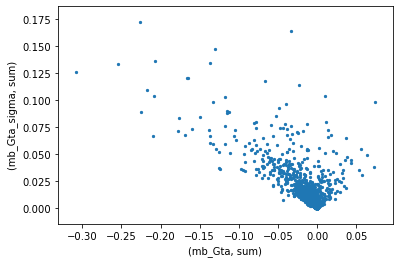

In [85]:
glac_df_mb_hex.plot.scatter(x=('mb_Gta', 'sum'),y=('mb_Gta_sigma', 'sum'), **sc_kw) 

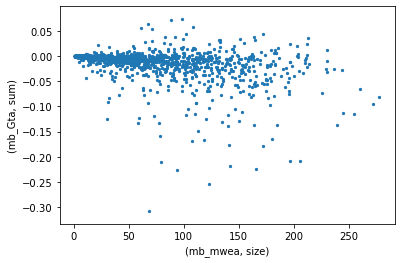

In [86]:
glac_df_mb_hex.plot.scatter(x=('mb_mwea', 'size'),y=('mb_Gta', 'sum'), **sc_kw) 

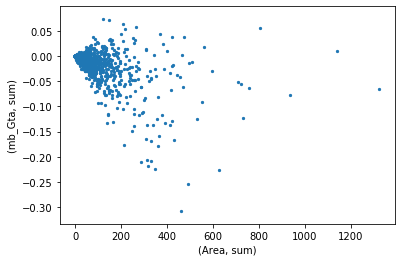

In [87]:
glac_df_mb_hex.plot.scatter(x=('Area', 'sum'),y=('mb_Gta', 'sum'), **sc_kw) 

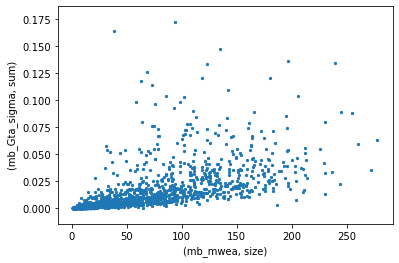

In [88]:
glac_df_mb_hex.plot.scatter(x=('mb_mwea', 'size'),y=('mb_Gta_sigma', 'sum'), **sc_kw) 

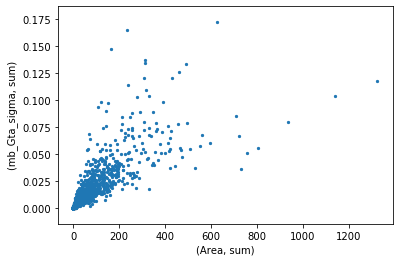

In [89]:
glac_df_mb_hex.plot.scatter(x=('Area', 'sum'),y=('mb_Gta_sigma', 'sum'), **sc_kw) 

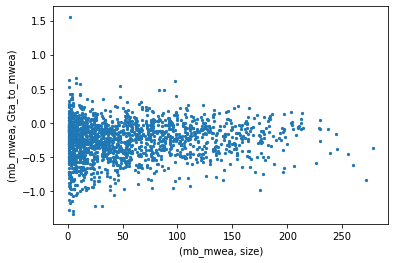

In [90]:
glac_df_mb_hex.plot.scatter(x=('mb_mwea', 'size'),y=('mb_mwea', 'Gta_to_mwea'), **sc_kw) 

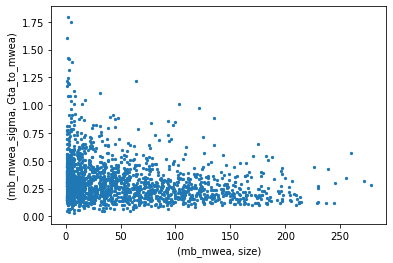

In [91]:
glac_df_mb_hex.plot.scatter(x=('mb_mwea', 'size'),y=('mb_mwea_sigma', 'Gta_to_mwea'), **sc_kw) 

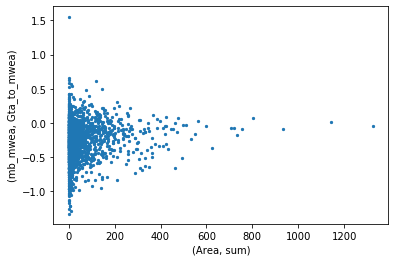

In [92]:
glac_df_mb_hex.plot.scatter(x=('Area','sum'),y=('mb_mwea', 'Gta_to_mwea'), **sc_kw) 

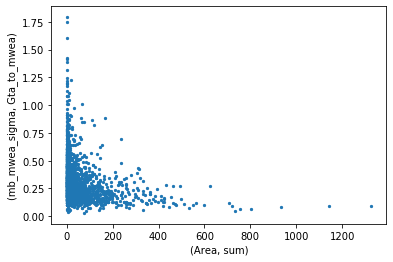

In [93]:
glac_df_mb_hex.plot.scatter(x=('Area','sum'),y=('mb_mwea_sigma', 'Gta_to_mwea'), **sc_kw) 

/Users/dshean/sw/miniconda3/envs/shean_py3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/core.py:231: UserWarning: 'color' and 'colormap' cannot be used simultaneously. Using 'color'
  "'color' and 'colormap' cannot be used " "simultaneously. Using 'color'"


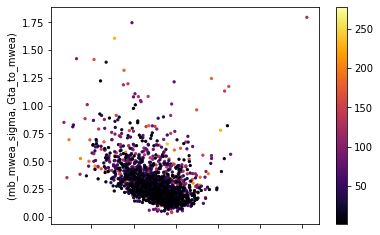

In [94]:
#c = ('Area', 'sum')
c = ('mb_mwea', 'size')
glac_df_mb_hex.sort_values(by=c).plot.scatter(x=('mb_mwea', 'Gta_to_mwea'), y=('mb_mwea_sigma', 'Gta_to_mwea'), color=glac_df_mb_hex[c], cmap='inferno', marker='.')

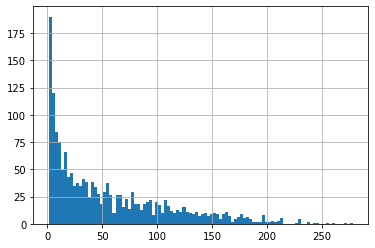

In [95]:
glac_df_mb_hex[('mb_mwea', 'size')].hist(bins=100)

In [96]:
# Count of glaciers in hex bins
print(glac_df_mb_hex[('mb_mwea', 'size')].mean())
print(glac_df_mb_hex[('mb_mwea', 'size')].min())
print(glac_df_mb_hex[('mb_mwea', 'size')].max())

55.101576182136604
1.0
278.0


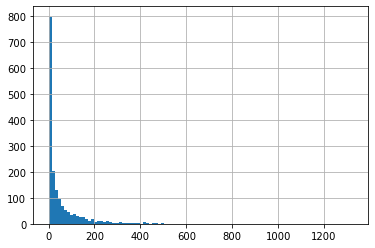

In [97]:
glac_df_mb_hex[('Area', 'sum')].hist(bins=100)

## Check for outliers

In [376]:
def hex_check(glac_df_mb_hex, col=('mb_Gta', 'sum')):
    f,axa = plt.subplots(1,2, figsize=(8,4))
    glac_df_mb_hex[col].hist(ax=axa[0], bins=100)
    axa[0].set_ylim(0,10)
    axa[0].set_xlabel(col)
    axa[0].set_ylabel("Number of hex bins")
    axa[0].axvline(0, color='k')
    axa[1].scatter(glac_df_mb_hex[('mb_mwea', 'count')], glac_df_mb_hex[col])
    axa[1].set_xlabel("Number of glaciers in hex bin")
    axa[1].set_ylabel(col)
    axa[1].axhline(0, color='k')
    plt.tight_layout()

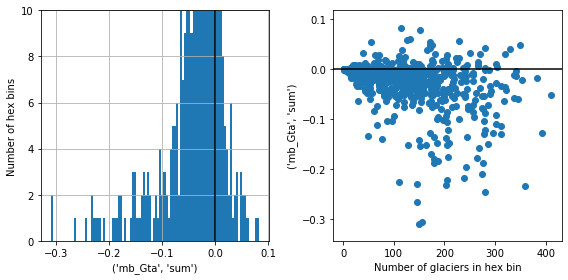

In [377]:
hex_check(glac_df_mb_hex, col=('mb_Gta', 'sum'))

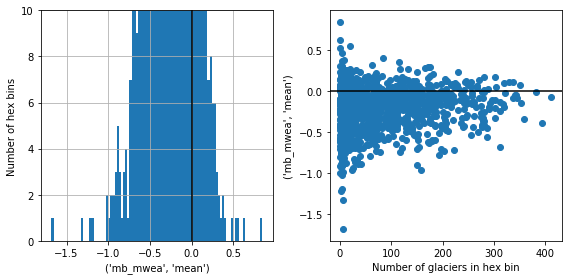

In [378]:
hex_check(glac_df_mb_hex, col=('mb_mwea', 'mean'))

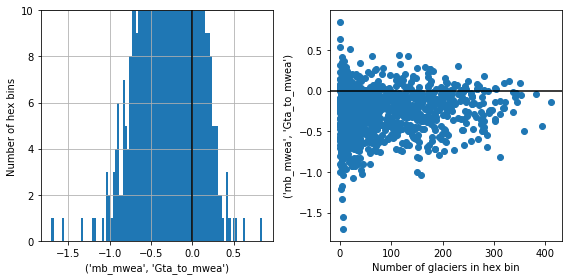

In [379]:
hex_check(glac_df_mb_hex, col=('mb_mwea', 'Gta_to_mwea'))

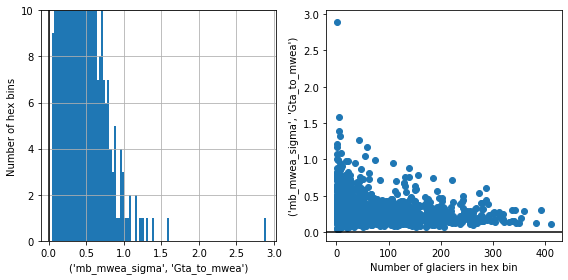

In [380]:
hex_check(glac_df_mb_hex, col=('mb_mwea_sigma', 'Gta_to_mwea'))

In [381]:
if False:
    outlier_clim = (-0.20, 0.08)
    col = ('mb_Gta', 'sum')
    print("Removing outliers (%0.2f, %0.2f)" % (outlier_clim))
    inlier_idx = (glac_df_mb_hex[col] >= outlier_clim[0]) & (glac_df_mb_hex[col] <= outlier_clim[1])

    print("%i records before outlier removal" % (glac_df_mb_hex.shape[0]))
    print("%i records after outlier removal" % (glac_df_mb_hex[inlier_idx].shape[0]))
    glac_df_mb_hex = glac_df_mb_hex[inlier_idx]

## HMA-wide numbers

In [370]:
#Sum of all hex samples - full region mb and uncertainty
hma_stats = glac_df_mb_hex.sum(axis=0)
hma_mb_Gta_sigma_rss = rss(glac_df_mb_hex[('mb_Gta_sigma', 'sum')])
#hma_mb_Gta_sigma_rss = rss(glac_df_mb_hex[('mb_m3wea_sigma', 'sum')])/1E9
hma_mb_Gta_sigma_rss = 

In [371]:
#These were incorrect (sum and rss were flipped!)
#print('%0.2f\u00b1%0.2f Gt/yr' % (hma_stats[('mb_Gta', 'sum')], hma_stats[('mb_Gta_sigma', 'rss')]))
#print('%0.1f\u00b1%0.1f Gt/yr' % (hma_stats[('mb_Gta', 'sum')], hma_stats[('mb_Gta_sigma', 'rss')]))

In [372]:
print('%0.2f\u00b1%0.2f Gt/yr' % (hma_stats[('mb_Gta', 'sum')], hma_mb_Gta_sigma_rss))
print('%0.1f\u00b1%0.1f Gt/yr' % (hma_stats[('mb_Gta', 'sum')], hma_mb_Gta_sigma_rss))

-18.96±0.97 Gt/yr
-19.0±1.0 Gt/yr


In [373]:
print('%0.1f%% uncertainty' % (100*abs(hma_mb_Gta_sigma_rss/hma_stats[('mb_Gta', 'sum')])))

5.1% uncertainty


In [259]:
print('%0.3f\u00b1%0.3f mmSLE/yr' % (hma_stats[('mb_Gta', 'sum')]/Gt2mm, hma_mb_Gta_sigma_rss/Gt2mm))

-0.052±0.003 mmSLE/yr


In [260]:
dt = 18.0
print('%0.3f\u00b1%0.3f mmSLE' % (dt*hma_stats[('mb_Gta', 'sum')]/Gt2mm, dt*hma_mb_Gta_sigma_rss/Gt2mm))

-0.942±0.058 mmSLE


In [261]:
print('%0.2f\u00b1%0.2f Gt' % (dt*hma_stats[('mb_Gta', 'sum')], dt*hma_mb_Gta_sigma_rss))

-341.33±21.17 Gt


In [159]:
hma_stats_m = 1000*hma_stats/hma_stats[('Area', 'sum')]
hma_stats_m_rss = 1000*hma_mb_Gta_sigma_rss/hma_stats[('Area', 'sum')]
#print('%0.2f\u00b1%0.2f m we/yr' % (hma_stats_m[('mb_Gta', 'sum')], hma_stats_m[('mb_Gta_sigma', 'rss')]))
print('%0.3f\u00b1%0.3f m we/yr' % (hma_stats_m[('mb_Gta', 'sum')], hma_stats_m_rss))
print('%0.2f\u00b1%0.2f m we/yr' % (hma_stats_m[('mb_Gta', 'sum')], hma_stats_m_rss))
#print('%0.1f\u00b1%0.1f m we/yr' % (hma_stats_m[('mb_Gta', 'sum')], hma_stats_m[('mb_Gta_sigma', 'rss')]))

-0.196±0.012 m we/yr
-0.20±0.01 m we/yr


In [152]:
hma_stats[('meltwater', 'total_Gta_sigma')]

16.441017679646002

In [90]:
glac_df_mb_hex[('mb_Gta_sigma', 'sum')].max()

0.22837367351600013

In [91]:
rss(glac_df_mb_hex[('mb_Gta_sigma', 'sum')])

1.1762138897466257

In [92]:
glac_df_mb_hex[('mb_Gta_sigma', 'sum')].sum()

21.500476323924

In [93]:
rss(glac_df_mb_hex[('meltwater', 'total_Gta')])

1.467725379015717

In [559]:
glac_df_mb_hex.columns

Index([                    ('area_m2', 'mean'),
                            ('area_m2', 'sum'),
                           ('mb_mwea', 'mean'),
                         ('mb_mwea', 'median'),
                            ('mb_mwea', 'std'),
                            ('mb_mwea', 'sum'),
                           ('mb_mwea', 'size'),
                     ('mb_mwea_sigma', 'mean'),
                      ('mb_mwea_sigma', 'sum'),
                      ('mb_mwea_sigma', 'rss'),
                           ('dhdt_ma', 'mean'),
                         ('dhdt_ma', 'median'),
                            ('dhdt_ma', 'std'),
                            ('dhdt_ma', 'sum'),
                     ('dhdt_ma_sigma', 'mean'),
                      ('dhdt_ma_sigma', 'sum'),
                      ('dhdt_ma_sigma', 'rss'),
                      ('dhdt_ma_sigma', 'rms'),
                         ('dhdt_ma_A', 'mean'),
                          ('dhdt_ma_A', 'sum'),
                     ('dhdt_ma_A_abs', '

In [562]:
glac_df_mb_hex[('dhdt_ma_sigma', 'perc')].max()

64.9090909090909

## Plot hex grids

In [178]:
title = suptitle + ": %s km Hex Grid Cells" % hex_width
extent = [-1610900, -1142400, 1767400, 1145700]

In [179]:
scaling_f = 0.15
cbar_fmt = '%0.2f'

Plotting image
Plotting borders
('mb_mwea', 'size')
Plotting scatterplot of ('mb_mwea', 'size') values


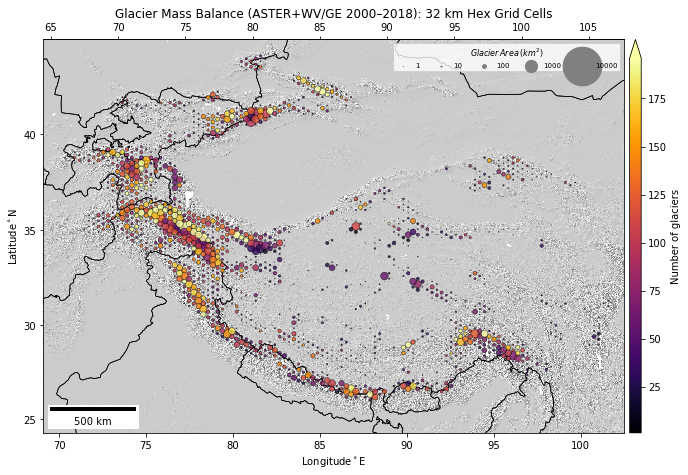

In [181]:
out_fn_suffix = '_hex%s_count' % hex_width
#mb_gt_clim = (-0.15,0.15)
#hex_fig = make_map(col=('mb_Gta', 'sum'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=mb_gt_clim, crs=crs, extent=extent, hs=hs, hs_extent_cartopy=hs_extent_cartopy, labels=None, title=title)
hex_fig = make_map(col=('mb_mwea', 'size'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=None, crs=crs, extent=extent, hs_bg=True, labels=None, title=title, cbar_fmt='%i')
hex_fig_fn = os.path.splitext(glac_shp_join_fn)[0] + out_fn_suffix + '.png'
hex_fig.savefig(hex_fig_fn, **plt_opt)

Plotting image
Plotting borders
('dhdt_ma_sigma', 'perc')
Plotting scatterplot of ('dhdt_ma_sigma', 'perc') values


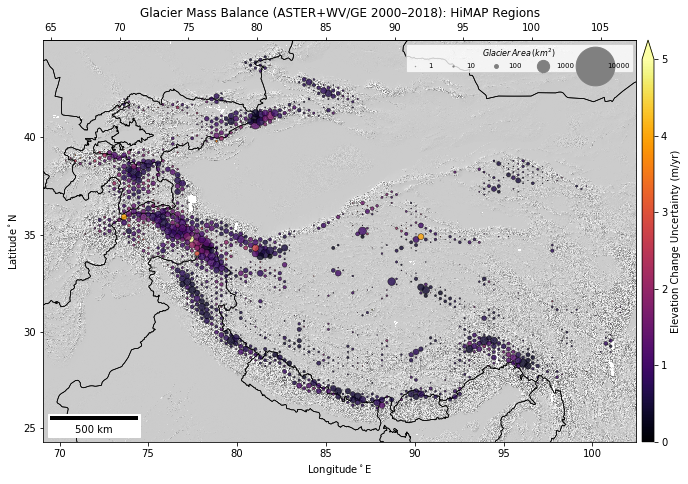

In [566]:
out_fn_suffix = '_hex%s_sigma_perc' % hex_width
#mb_gt_clim = (-0.15,0.15)
#hex_fig = make_map(col=('mb_Gta', 'sum'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=mb_gt_clim, crs=crs, extent=extent, hs=hs, hs_extent_cartopy=hs_extent_cartopy, labels=None, title=title)
hex_fig = make_map(col=('dhdt_ma_sigma', 'perc'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=(0,5), crs=crs, extent=extent, hs_bg=True, labels=None, title=title, cbar_fmt='%i')
hex_fig_fn = os.path.splitext(glac_shp_join_fn)[0] + out_fn_suffix + '.png'
#hex_fig.savefig(hex_fig_fn, **plt_opt)

In [ ]:
max_mwea = 1.0

#Earlier 27-km hex plots
max_gt = 0.15
#42 km
max_gt = 0.25
#32 km
max_gt = 0.20

Plotting image
Plotting borders
('mb_Gta', 'sum')
Plotting scatterplot of ('mb_Gta', 'sum') values
Plotting image
Plotting borders
('mb_Gta_sigma', 'sum')
Plotting scatterplot of ('mb_Gta_sigma', 'sum') values


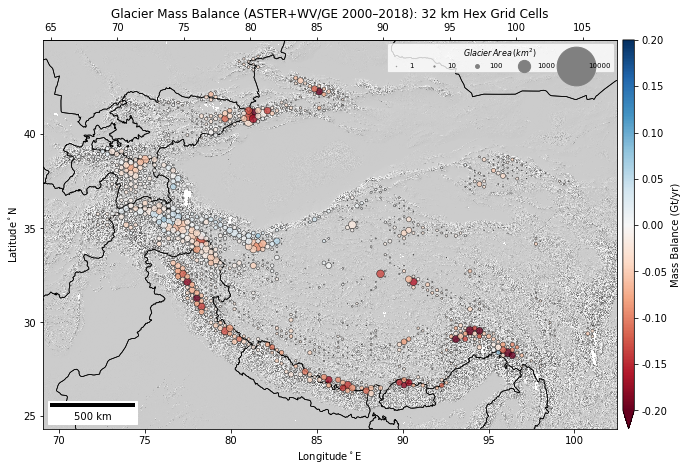

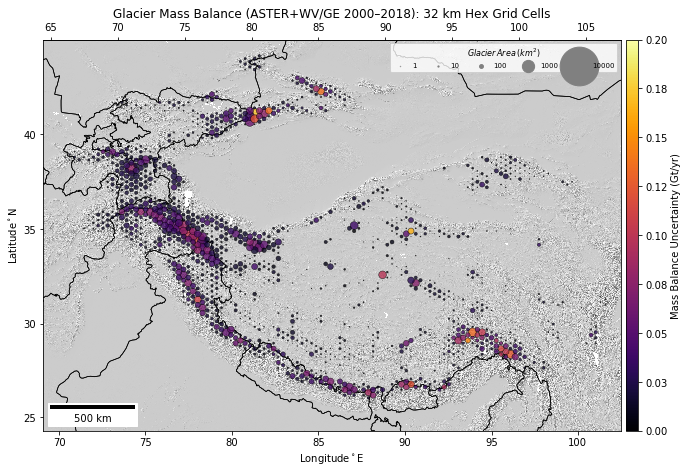

In [264]:
out_fn_suffix = '_hex%s_mb_Gta' % hex_width
mb_gt_clim = (-max_gt,max_gt)
#hex_fig = make_map(col=('mb_Gta', 'sum'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=mb_gt_clim, crs=crs, extent=extent, hs=hs, hs_extent_cartopy=hs_extent_cartopy, labels=None, title=title)
hex_fig = make_map(col=('mb_Gta', 'sum'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=mb_gt_clim, crs=crs, extent=extent, hs_bg=True, labels=None, title=title, cbar_fmt=cbar_fmt)
hex_fig_fn = os.path.splitext(glac_shp_join_fn)[0] + out_fn_suffix + '.png'
hex_fig.savefig(hex_fig_fn, **plt_opt)
mb_gt_sigma_clim = (0.00,max_gt)
hex_sigma_fig = make_map(col=('mb_Gta_sigma', 'sum'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=mb_gt_sigma_clim, crs=crs, extent=extent, labels=None, title=title, cbar_fmt=cbar_fmt)
hex_sigma_fig_fn = os.path.splitext(glac_shp_join_fn)[0] + out_fn_suffix + '_sigma.png'
hex_sigma_fig.savefig(hex_sigma_fig_fn, **plt_opt)

Plotting image
Plotting borders
('mb_Gta', 'sum')
Plotting scatterplot of ('mb_Gta', 'sum') values
Plotting image
Plotting borders
('mb_m3wea_sigma', 'sum_perc_to_Gta')
Plotting scatterplot of ('mb_m3wea_sigma', 'sum_perc_to_Gta') values


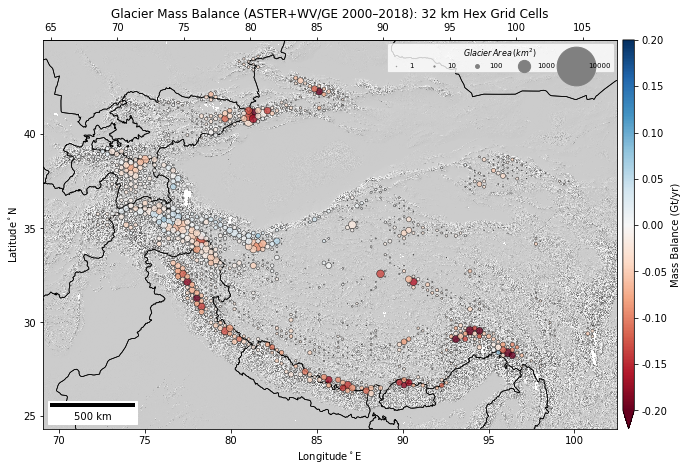

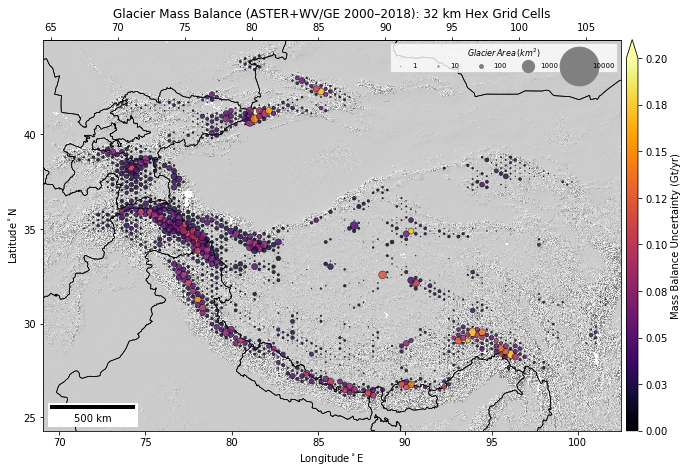

In [273]:
out_fn_suffix = '_hex%s_mb_Gta_update' % hex_width
mb_gt_clim = (-max_gt,max_gt)
#hex_fig = make_map(col=('mb_Gta', 'sum'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=mb_gt_clim, crs=crs, extent=extent, hs=hs, hs_extent_cartopy=hs_extent_cartopy, labels=None, title=title)
hex_fig = make_map(col=('mb_Gta', 'sum'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=mb_gt_clim, crs=crs, extent=extent, hs_bg=True, labels=None, title=title, cbar_fmt=cbar_fmt)
hex_fig_fn = os.path.splitext(glac_shp_join_fn)[0] + out_fn_suffix + '.png'
hex_fig.savefig(hex_fig_fn, **plt_opt)
mb_gt_sigma_clim = (0.00,max_gt)
hex_sigma_fig = make_map(col=('mb_m3wea_sigma', 'sum_perc_to_Gta'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=mb_gt_sigma_clim, crs=crs, extent=extent, labels=None, title=title, cbar_fmt=cbar_fmt)
hex_sigma_fig_fn = os.path.splitext(glac_shp_join_fn)[0] + out_fn_suffix + '_sigma.png'
hex_sigma_fig.savefig(hex_sigma_fig_fn, **plt_opt)

Plotting image
Plotting borders
('mb_mwea', 'Gta_to_mwea')
Plotting scatterplot of ('mb_mwea', 'Gta_to_mwea') values
Plotting image
Plotting borders
('mb_mwea_sigma', 'Gta_to_mwea')
Plotting scatterplot of ('mb_mwea_sigma', 'Gta_to_mwea') values


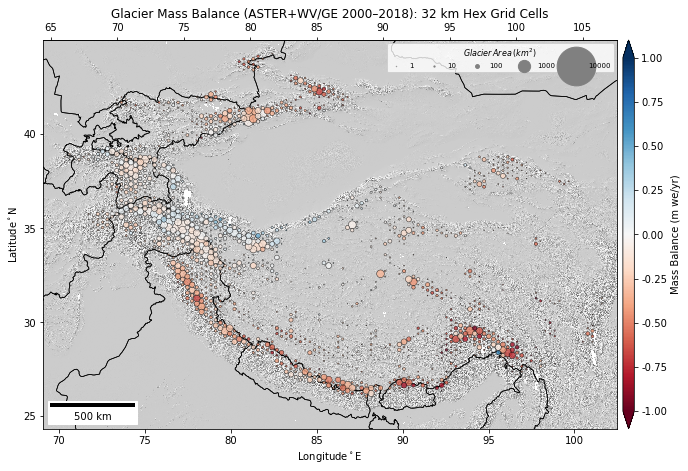

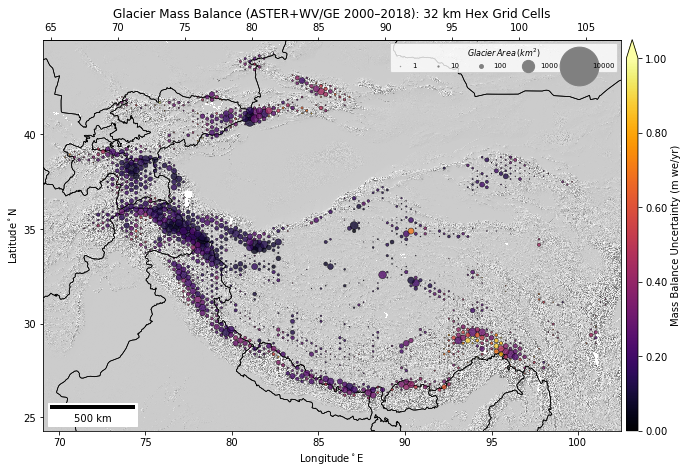

In [253]:
out_fn_suffix = '_hex%s_mb_Gta_to_mwea' % hex_width
mb_mwea_clim = (-max_mwea,max_mwea)
hex_fig = make_map(col=('mb_mwea', 'Gta_to_mwea'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=mb_mwea_clim, crs=crs, extent=extent, labels=None, title=title, cbar_fmt=cbar_fmt)
hex_fig_fn = os.path.splitext(glac_shp_join_fn)[0] + out_fn_suffix + '.png'
hex_fig.savefig(hex_fig_fn, **plt_opt)
#mb_mwea_sigma_clim = (0,0.5)
mb_mwea_sigma_clim = (0,max_mwea)
hex_sigma_fig = make_map(col=('mb_mwea_sigma', 'Gta_to_mwea'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=mb_mwea_sigma_clim, crs=crs, extent=extent, labels=None, title=title, cbar_fmt=cbar_fmt)
hex_sigma_fig_fn = os.path.splitext(glac_shp_join_fn)[0] + out_fn_suffix + '_sigma.png'
hex_sigma_fig.savefig(hex_sigma_fig_fn, **plt_opt)

Plotting image
Plotting borders
('mb_mwea', 'Gta_to_mwea')
Plotting scatterplot of ('mb_mwea', 'Gta_to_mwea') values
Plotting image
Plotting borders
('mb_m3wea_sigma', 'sum_perc_to_mwea')
Plotting scatterplot of ('mb_m3wea_sigma', 'sum_perc_to_mwea') values


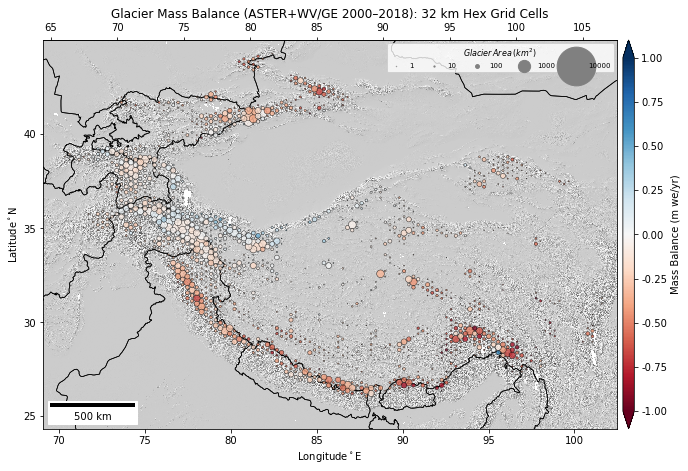

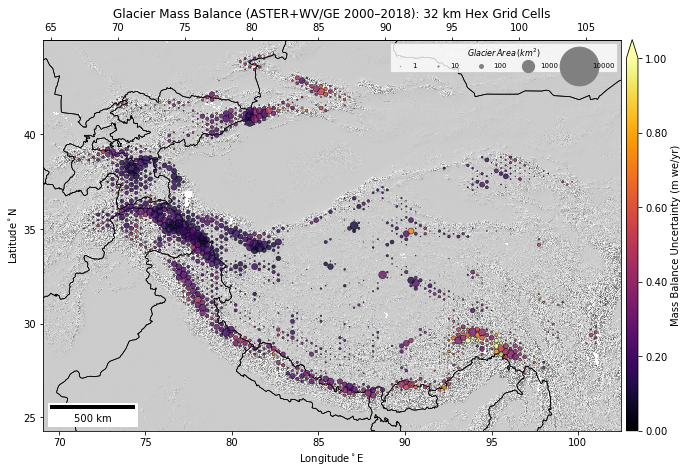

In [262]:
out_fn_suffix = '_hex%s_mb_Gta_to_mwea_update' % hex_width
mb_mwea_clim = (-max_mwea,max_mwea)
hex_fig = make_map(col=('mb_mwea', 'Gta_to_mwea'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=mb_mwea_clim, crs=crs, extent=extent, labels=None, title=title, cbar_fmt=cbar_fmt)
hex_fig_fn = os.path.splitext(glac_shp_join_fn)[0] + out_fn_suffix + '.png'
hex_fig.savefig(hex_fig_fn, **plt_opt)
mb_mwea_sigma_clim = (0,max_mwea)
hex_sigma_fig = make_map(col=('mb_m3wea_sigma', 'sum_perc_to_mwea'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=mb_mwea_sigma_clim, crs=crs, extent=extent, labels=None, title=title, cbar_fmt=cbar_fmt)
hex_sigma_fig_fn = os.path.splitext(glac_shp_join_fn)[0] + out_fn_suffix + '_sigma.png'
hex_sigma_fig.savefig(hex_sigma_fig_fn, **plt_opt)

Plotting image
Plotting borders
('dhdt_ma', 'm3_to_ma')
Plotting scatterplot of ('dhdt_ma', 'm3_to_ma') values
Plotting image
Plotting borders
('dhdt_ma_sigma', 'perc_to_ma')
Plotting scatterplot of ('dhdt_ma_sigma', 'perc_to_ma') values


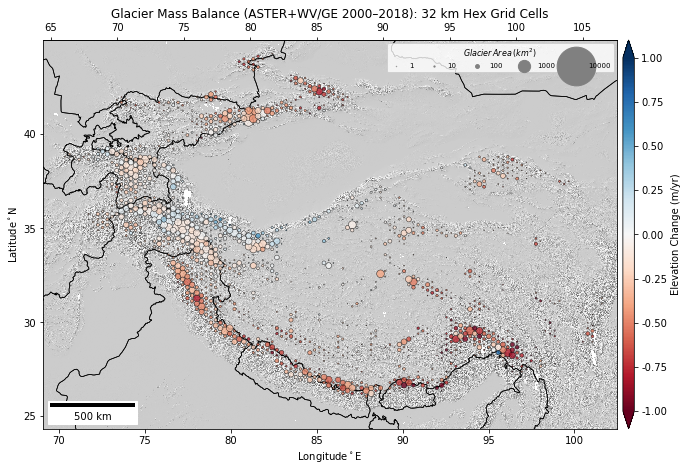

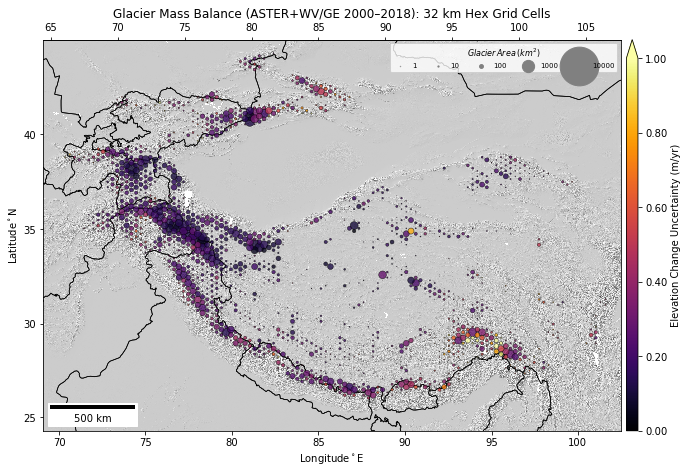

In [290]:
out_fn_suffix = '_hex%s_dhdt_ma_update' % hex_width
mb_mwea_clim = (-max_mwea,max_mwea)
hex_fig = make_map(col=('dhdt_ma', 'm3_to_ma'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=mb_mwea_clim, crs=crs, extent=extent, labels=None, title=title, cbar_fmt=cbar_fmt)
hex_fig_fn = os.path.splitext(glac_shp_join_fn)[0] + out_fn_suffix + '.png'
hex_fig.savefig(hex_fig_fn, **plt_opt)
mb_mwea_sigma_clim = (0,max_mwea)
hex_sigma_fig = make_map(col=('dhdt_ma_sigma', 'perc_to_ma'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=mb_mwea_sigma_clim, crs=crs, extent=extent, labels=None, title=title, cbar_fmt=cbar_fmt)
hex_sigma_fig_fn = os.path.splitext(glac_shp_join_fn)[0] + out_fn_suffix + '_sigma.png'
hex_sigma_fig.savefig(hex_sigma_fig_fn, **plt_opt)

In [ ]:
make_map(col=('mb_mwea', 'size'), mb_dissolve_df=glac_df_mb_hex, glac_df_mb=None, agg_df=None, border_df=border_df, clim=None, crs=crs, extent=extent, hs_bg=True, labels=None, title=title, cbar_fmt='%i')

## Exploring mb vs elevation

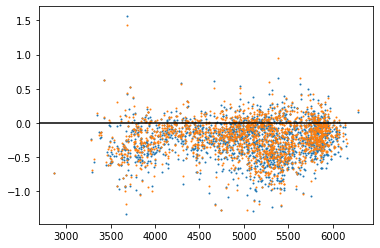

In [550]:
f,ax = plt.subplots()
z=glac_df_mb_hex[('z_med', 'median')]
mb=glac_df_mb_hex[('mb_mwea', 'Gta_to_mwea')]
mb2=glac_df_mb_hex[('mb_mwea', 'mean')]
#mb=glac_df_mb_hex[('mb_Gta', 'sum')]

ax.scatter(z,mb,s=1)
ax.scatter(z,mb2,s=1)
ax.axhline(0,c='k')
#ax.set_ylim(-0.1, 0.05)

In [551]:
def norm(a, percentile=(0.5, 99.5)):
    #amin, amax = (a.min(), a.max())
    amin, amax = np.nanpercentile(a, percentile)
    print(amin, amax)
    return ((a - amin)/(amax - amin))

-1.0667191772157816 0.4883744452961436
3409.7189200000003 6077.7026000000005


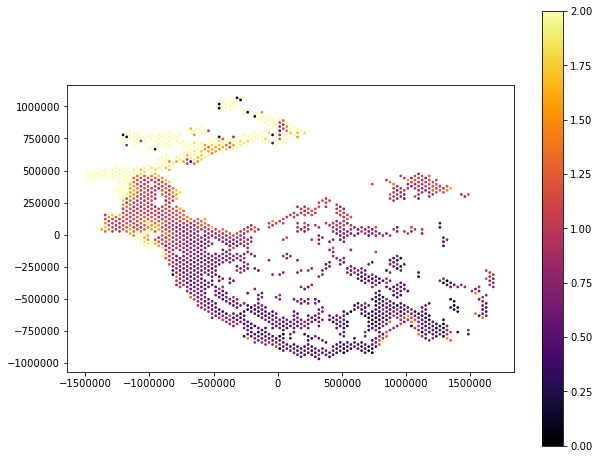

In [555]:
f,ax = plt.subplots(figsize=(10,8))
x=glac_df_mb_hex['centroid_x'].values
y=glac_df_mb_hex['centroid_y'].values
z=glac_df_mb_hex[('z_med', 'median')]
mb=glac_df_mb_hex[('mb_mwea', 'Gta_to_mwea')]
#mb=glac_df_mb_hex[('mb_mwea', 'mean')]
#asdf = norm(mb/z)
asdf = norm(mb)/norm(z)
clim=(0,2)
sc = ax.scatter(x,y,c=asdf,s=3,cmap='inferno',vmin=clim[0],vmax=clim[1])
plt.colorbar(sc)
ax.set_aspect('equal')

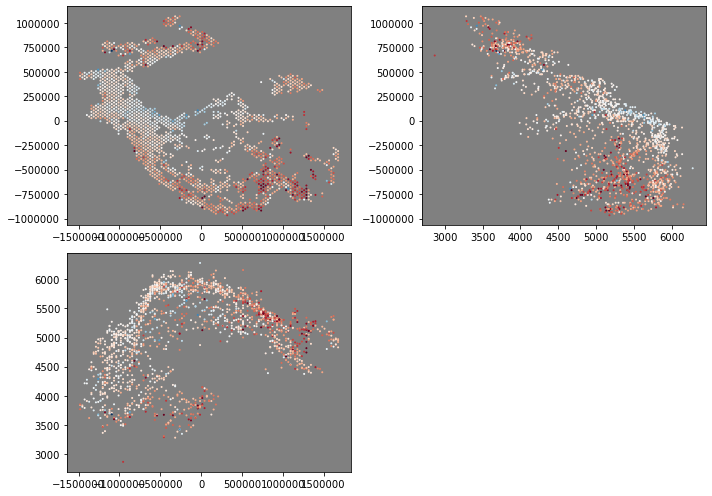

In [556]:
f,axa = plt.subplots(2,2,figsize=(10,7))
clim = (-1,1)
#axa[0][0].set_aspect('equal')
axa[0][0].scatter(x,y,c=mb,s=1,vmin=clim[0],vmax=clim[1],cmap='RdBu')
axa[1][0].scatter(x,z,c=mb,s=1,vmin=clim[0],vmax=clim[1],cmap='RdBu')
axa[0][1].scatter(z,y,c=mb,s=1,vmin=clim[0],vmax=clim[1],cmap='RdBu')
axa[1][1].axis('off')
plt.tight_layout()
for ax in axa.ravel():
    ax.set_facecolor('0.5')

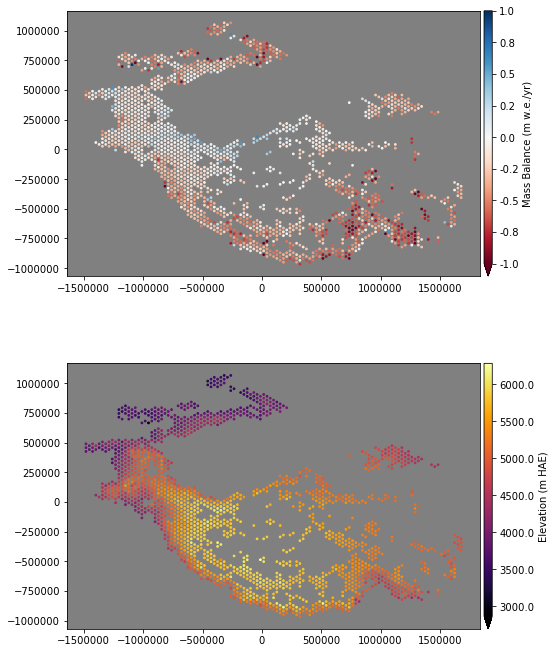

In [557]:
f,axa = plt.subplots(2, figsize=(7.5,10))
clim = (-1,1)
#axa[0][0].set_aspect('equal')
mb_m = axa[0].scatter(x,y,c=mb,s=3,vmin=clim[0],vmax=clim[1],cmap='RdBu')
z_m = axa[1].scatter(x,y,c=z,s=3,cmap='inferno')
pltlib.add_cbar(axa[0], mb_m, label='Mass Balance (m w.e./yr)')
pltlib.add_cbar(axa[1], z_m, label='Elevation (m HAE)')

for ax in axa.ravel():
    ax.set_aspect('equal')
    ax.set_facecolor('0.5')
plt.tight_layout()

## Aggregation of hex cells over regions and basins

In [292]:
#Fix incorrect spellings in Kaab regions
kaab_region_df.rename({'Nyainqentangla':'Nyainqentanglha', 'Pamir Alai':'Pamir Alay'}, inplace=True)

In [358]:
mb_unit = 'Gta'
region_clim = (-3.5, 3.5)
ylim = (-4.5, 1.5)
col=('mb_Gta', 'sum', 'sum')
#sigma_col=('mb_Gta_sigma', 'sum', 'rss')
sigma_col=('mb_m3wea_sigma','sum_perc_to_Gta','region')

In [333]:
sigma_col_Gta = ('mb_m3wea_sigma','sum_perc_to_Gta','region')

In [339]:
mb_unit = 'mwea'
region_clim = (-0.5, 0.5)
ylim = (-0.80, 0.2)
col=('mb_mwea', 'sum', 'sum')
#sigma_col=('mb_mwea_sigma', 'sum', 'rss')
sigma_col=('mb_m3wea_sigma','sum_perc_to_mwea','region')

In [294]:
def hex_agg_plot(glac_gdf_mb_hex_region_agg, region_df, title, out_fn_suffix, clim=None, \
                col=col, sigma_col=sigma_col, map=True, hs_bg=True, savefig=True, glac=False):
    
    fig, ax = plt.subplots(figsize=(6,6))
    
    y_label = 'Mass Balance (Gt/yr)'
    if 'mb_mwea' in col:
        y_label = 'Mass Balance (m we/yr)'
    elif 'meltwater' in col[0]:
        y_label = 'Excess Meltwater (Gt/yr)'
       
    #Add Brun et al. bars if present
    if 'new_mb_mwea' in glac_gdf_mb_hex_region_agg:
        if 'mb_mwea' in col:
            col_idx = [col,'new_mb_mwea']
            sigma_col_idx = [sigma_col,'new_mb_err_mwea']
        else:
            col_idx = [col,'new_mb_gta']
            sigma_col_idx = [sigma_col,'new_mb_err_gta']
        color=['darkorange','0.8']
    elif 'brun_mb_gta' in glac_gdf_mb_hex_region_agg:
        if 'meltwater' in col[0]:
            col_idx = [col,'brun_excess_gta']
            sigma_col_idx = [sigma_col,'brun_excess_err_gta']
        else:
            col_idx = [col,'brun_mb_gta']
            sigma_col_idx = [sigma_col,'brun_mb_err_gta']
        color=['darkorange','0.8']
    else:
        col_idx = col
        sigma_col_idx = sigma_col
        color='darkorange'
    
    mb_tot = glac_gdf_mb_hex_region_agg[col_idx]
    err = glac_gdf_mb_hex_region_agg[sigma_col_idx]
    
    #if 'orig_mb_mwea' in glac_gdf_mb_hex_region_agg:
    if len(col_idx) == 2:
        colnames=["This Study", "Brun et al. (2017)"]
        mb_tot.columns = colnames
        err.columns = colnames
    
    width = 1.3*(glac_gdf_mb_hex_region_agg[('Area_all', 'sum', 'sum')]/glac_gdf_mb_hex_region_agg[('Area_all', 'sum', 'sum')].max()).values
    
    print(width)
    
    #mb_tot.plot.bar(ax=ax, color=color)
    mb_tot.plot.bar(yerr=err, ax=ax, color=color, edgecolor='k', linewidth=0.5, \
                    error_kw=dict(ecolor='k', lw=0.5, capsize=2.0, capthick=0.5))
    ax.axhline(0, color='k', lw=0.5)
    ax.set_ylabel(y_label)
    ax.set_ylim(*ylim)
    ax.set_xlabel(mb_tot.index.name)
    ax.grid(axis='y', lw=0.5, ls=':')
 
    plt.tight_layout()
    if savefig:
        fig_fn = os.path.splitext(glac_shp_join_fn)[0]+ out_fn_suffix + '_bar.png'
        fig.savefig(fig_fn, **plt_opt) 
    #return mb_tot, err
    if map:
        hex_region_fig_fn = os.path.splitext(glac_shp_join_fn)[0] + out_fn_suffix + '.png'
        hex_region_fig = make_map(col=col, sigma_col=sigma_col, \
                                  mb_dissolve_df=glac_gdf_mb_hex_region_agg, glac_df_mb=glac_df_mb, \
                                  agg_df=region_df, border_df=border_df, clim=clim, crs=crs, \
                                  extent=extent, labels='name+val+sigma', title=title, hs_bg=hs_bg, glac=glac)
        if savefig:
            hex_region_fig.savefig(hex_region_fig_fn, **plt_opt) 

In [295]:
append_centroid_xy(region_df)
append_centroid_xy(kaab_region_df)
append_centroid_xy(basin_df)

In [296]:
def short_lbl(df):
    orig_index_name = df.index.name
    df[orig_index_name+'_orig'] = df.index
    regex_dict = {'Eastern':'E.','East':'E.','Western':'W.','West':'W.',\
                  'Northern':'N.','Southern':'S.','Central':'C.','Mountains':'Mtns',\
                  'Tibetan Plateau':'TP', 'Extended':'Ext.'}
    new_index = df[orig_index_name+'_orig'].replace(regex=regex_dict)
    df.index = new_index
    df.index.name = orig_index_name

In [297]:
region_df.head()
region_df_cp = region_df.copy()
short_lbl(region_df)
region_df.head()

,geometry,centroid_x,centroid_y,himap_region_orig
himap_region,,,,
E. Hindu Kush,(POLYGON ((-1007072.451620904 169859.103980618...,"-1,203,427.33","52,490.72",Eastern Hindu Kush
W. Himalaya,(POLYGON ((-821513.7920037253 -39192.895313012...,"-794,613.29","-266,517.78",Western Himalaya
E. Himalaya,(POLYGON ((974925.0577844162 -645901.231420908...,"646,584.48","-866,752.59",Eastern Himalaya
C. Himalaya,(POLYGON ((-384112.099573634 -588849.806896036...,"-151,474.46","-782,787.79",Central Himalaya
Karakoram,(POLYGON ((-793139.7461575471 184761.164018728...,"-781,483.71","19,769.49",Karakoram


In [298]:
kaab_region_df.head()
kaab_region_df_cp = kaab_region_df.copy()
short_lbl(kaab_region_df)
kaab_region_df.head()

,geometry,centroid_x,centroid_y,kaab_region_orig
kaab_region,,,,
Inner TP,(POLYGON ((-4401.725805810875 124890.025851544...,"659,777.94","-187,764.02",Inner TP
Kunlun,(POLYGON ((-1002287.270993384 465136.935820820...,"-526,188.79","106,040.12",Kunlun
Pamir Alay,(POLYGON ((-1247293.932661358 322182.736021329...,"-1,262,182.12","466,842.59",Pamir Alay
Nyainqentanglha,(POLYGON ((693944.8486240985 -732894.492323651...,"966,755.14","-658,278.05",Nyainqentanglha
C. Himalaya,(POLYGON ((-137023.4274918161 -852014.06355443...,"170,838.01","-850,516.83",Central Himalaya


In [299]:
#Revert
#region_df = region_df_cp
#region_df.set_index('himap_region', inplace=True)
region_df.head()

,geometry,centroid_x,centroid_y,himap_region_orig
himap_region,,,,
E. Hindu Kush,(POLYGON ((-1007072.451620904 169859.103980618...,"-1,203,427.33","52,490.72",Eastern Hindu Kush
W. Himalaya,(POLYGON ((-821513.7920037253 -39192.895313012...,"-794,613.29","-266,517.78",Western Himalaya
E. Himalaya,(POLYGON ((974925.0577844162 -645901.231420908...,"646,584.48","-866,752.59",Eastern Himalaya
C. Himalaya,(POLYGON ((-384112.099573634 -588849.806896036...,"-151,474.46","-782,787.79",Central Himalaya
Karakoram,(POLYGON ((-793139.7461575471 184761.164018728...,"-781,483.71","19,769.49",Karakoram


## HiMAP regions

In [465]:
extent = [-1610900, -1142400, 1767400, 1145700]
title = suptitle + ": HiMAP Regions"
glac_gdf_mb_hex_region_agg = hex_agg(glac_gdf_mb_hex, region_df, region_col)

One-time spatial join by hex
(1713, 91)


In [466]:
region_df.shape

(22, 5)

In [467]:
glac_gdf_mb_hex_region_agg.head()

mb_m3wea_sigma                                       mb_m3wea  \
                           sum                                            sum   
                           sum            rss           rms               sum   
himap_region                                                                    
Pamir Alay      530,066,393.45 118,369,984.21 16,108,114.57    -58,741,295.86   
E. Hindu Kush   696,474,067.44 132,881,466.36 16,234,054.91   -299,501,899.65   
W. Pamir      1,279,836,376.13 177,919,934.35 17,881,626.21   -948,628,640.32   
E. Pamir        316,666,786.83  79,045,317.43 13,174,219.57     26,677,982.17   
W. Himalaya   1,877,678,817.36 260,222,409.11 22,232,300.79 -2,518,278,804.91   

                        z_med          Area_all         meltwater  \
                       median               sum         total_m3a   
                size     mean   median      sum               sum   
himap_region                                                        
Pamir Alay     54.00 4,036.87 4,055.37 1,847.06   -200,435,415.55   
E. Hindu Kush  67.00 4,663.76 4,660.65 2,980.56   -419,822,658.95   
W. Pamir       99.00 4,712.37 4,872.60 8,288.01 -1,134,661,359.60   
E. Pamir       36.00 4,926.29 4,966.27 2,367.49   -155,081,845.60   
W. Himalaya   137.00 5,137.30 5,193.44 7,990.64 -2,630,277,823.65   

                                                                    dhdt_ma_A  \
               total_m3a_sigma                                            sum   
                           sum            rss           rms               sum   
himap_region                                                                    
Pamir Alay      279,198,075.87  68,240,161.21  9,463,207.70    -69,099,107.49   
E. Hindu Kush   454,693,911.26  85,195,439.00 10,567,193.67   -352,354,186.47   
W. Pamir        932,410,206.04 131,950,021.30 13,328,964.98 -1,116,039,527.69   
E. Pamir        138,388,882.47  36,423,231.38  6,340,470.74     31,453,128.78   
W. Himalaya   1,629,581,947.58 237,916,881.50 20,401,204.28 -2,962,668,142.92   

                       area_m2  dhdt_ma_sigma_A                 \
                           sum              sum                  
                           sum              sum            rss   
himap_region                                                     
Pamir Alay    1,845,872,221.41   620,318,921.43 138,532,236.18   
E. Hindu Kush 2,980,554,767.40   812,033,010.38 155,086,126.22   
W. Pamir      8,287,361,922.83 1,480,954,068.40 205,014,480.19   
E. Pamir      2,367,475,005.42   365,820,899.41  90,907,144.81   
W. Himalaya   7,989,127,930.51 2,146,079,688.38 295,562,837.11   

                 dhdt_ma_A_abs  dhdt_ma              dhdt_ma_sigma             \
                           sum m3_to_ma m3_to_ma_abs          perc perc_to_ma   
                           sum   region       region        region     region   
himap_region                                                                    
Pamir Alay      402,519,684.11    -0.04         0.22          0.34       0.08   
E. Hindu Kush   635,477,513.07    -0.12         0.21          0.24       0.05   
W. Pamir      1,553,665,271.95    -0.13         0.19          0.13       0.02   
E. Pamir        396,288,012.03     0.01         0.17          0.23       0.04   
W. Himalaya   3,226,225,720.83    -0.37         0.40          0.09       0.04   

              mb_m3wea_sigma     mb_m3wea_abs    mb_m3wea_sigma  \
                    sum_perc              sum sum_perc_to_m3wea   
                      region           region            region   
himap_region                                                      
Pamir Alay              0.38   342,141,731.50    131,423,523.22   
E. Hindu Kush           0.30   540,155,886.11    160,835,067.17   
W. Pamir                0.22 1,320,615,481.15    284,814,132.83   
E. Pamir                0.29   336,844,810.23     96,294,718.44   
W. Himalaya             0.19 2,742,291,862.71    530,994,452.43   

     

[0.11278178 0.18199302 0.50606625 0.14455895 0.48790864 0.13896316
 1.3        0.51655386 0.44306134 0.03180476 0.52038171 0.07865399
 0.23184035 0.12606863 0.01802236 0.1828746  0.18362033 0.11240565
 0.42810749 0.01887988 0.09754895 0.07879021]
Plotting image
Plotting borders
('mb_Gta', 'sum', 'sum')
Plotting scatterplot of ('mb_Gta', 'sum', 'sum') values
Adding annotations


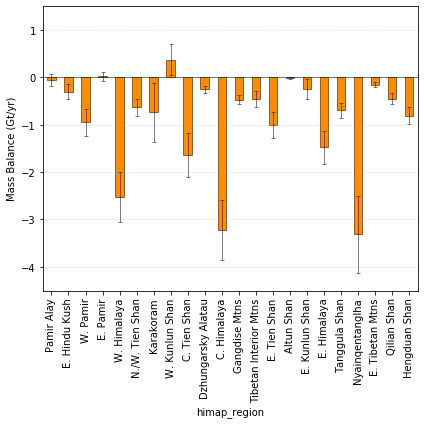

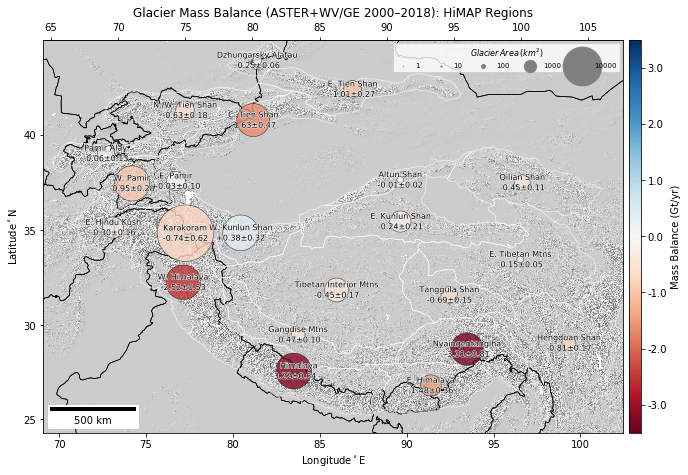

In [361]:
hex_agg_plot(glac_gdf_mb_hex_region_agg, region_df, title, col=col, sigma_col=sigma_col, \
             out_fn_suffix='_hex%s_himap_region_%s_update' % (hex_width, mb_unit), clim=region_clim)

In [319]:
#Number of cells per region
glac_gdf_mb_hex_region_agg['mb_m3wea','sum','size'].describe()

count    22.00
mean     77.86
std      35.74
min       9.00
25%      55.25
50%      80.00
75%     100.75
max     137.00
Name: (mb_m3wea, sum, size), dtype: float64

In [338]:
agg_sum = glac_gdf_mb_hex_region_agg[('mb_Gta','sum','sum')].sum()

agg_sigma_sum = glac_gdf_mb_hex_region_agg[sigma_col_Gta].sum()
agg_sigma_rss = rss(glac_gdf_mb_hex_region_agg[sigma_col_Gta])
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_sum))
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_rss))

sigma_col_orig = ('mb_Gta_sigma','sum','rss')
agg_sigma_sum = glac_gdf_mb_hex_region_agg[sigma_col_orig].sum()
agg_sigma_rss = rss(glac_gdf_mb_hex_region_agg[sigma_col_orig])
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_sum))
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_rss))

-18.96±5.92 Gt/yr
-18.96±1.60 Gt/yr
-18.96±3.78 Gt/yr
-18.96±0.97 Gt/yr


In [321]:
glac_gdf_mb_hex_region_agg

mb_m3wea_sigma                               \
                                   sum                                
                                   sum            rss           rms   
himap_region                                                          
Pamir Alay              530,066,393.45 118,369,984.21 16,108,114.57   
E. Hindu Kush           696,474,067.44 132,881,466.36 16,234,054.91   
W. Pamir              1,279,836,376.13 177,919,934.35 17,881,626.21   
E. Pamir                316,666,786.83  79,045,317.43 13,174,219.57   
W. Himalaya           1,877,678,817.36 260,222,409.11 22,232,300.79   
N./W. Tien Shan         728,444,261.34 126,884,817.05 12,688,481.70   
Karakoram             3,050,980,416.60 395,860,469.29 40,829,889.86   
W. Kunlun Shan        1,234,820,957.07 199,212,393.61 20,998,830.06   
C. Tien Shan          1,736,694,366.15 330,381,927.62 37,650,514.92   
Dzhungarsky Alatau      162,305,573.85  48,159,843.16 11,048,625.76   
C. Himalaya           2,215,346,379.70 298,297,105.70 27,006,551.01   
Gangdise Mtns           309,601,901.75  59,079,107.23  5,711,392.87   
Tibetan Interior Mtns   560,317,844.68 122,828,807.04 11,212,684.72   
E. Tien Shan            798,786,625.23 209,300,090.68 29,024,700.34   
Altun Shan               46,001,656.38  19,683,061.26  6,561,020.42   
E. Kunlun Shan          645,536,622.55 192,280,274.93 19,132,602.45   
E. Himalaya           1,109,302,489.29 244,334,029.31 29,850,152.60   
Tanggula Shan           359,778,333.71  96,856,080.95 12,609,587.70   
Nyainqentanglha       2,918,634,493.85 452,807,601.00 40,663,322.97   
E. Tibetan Mtns         111,946,219.99  46,014,429.40  9,392,656.07   
Qilian Shan             328,037,532.47  67,693,278.12  7,977,729.33   
Hengduan Shan           483,218,208.11  99,380,257.96 10,908,400.47   

                               mb_m3wea           z_med           Area_all  \
                                    sum          median                sum   
                                    sum   size     mean   median       sum   
himap_region                                                                 
Pamir Alay               -58,741,295.86  54.00 4,036.87 4,055.37  1,847.06   
E. Hindu Kush           -299,501,899.65  67.00 4,663.76 4,660.65  2,980.56   
W. Pamir                -948,628,640.32  99.00 4,712.37 4,872.60  8,288.01   
E. Pamir                  26,677,982.17  36.00 4,926.29 4,966.27  2,367.49   
W. Himalaya           -2,518,278,804.91 137.00 5,137.30 5,193.44  7,990.64   
N./W. Tien Shan         -631,812,630.29 100.00 3,799.02 3,774.67  2,275.85   
Karakoram               -740,094,809.58  94.00 5,360.25 5,389.61 21,290.52   
W. Kunlun Shan           376,997,223.12  90.00 5,598.88 5,721.26  8,459.77   
C. Tien Shan          -1,633,652,965.62  77.00 4,102.45 4,124.66  7,256.16   
Dzhungarsky Alatau      -254,001,748.25  19.00 3,522.35 3,521.31    520.88   
C. Himalaya           -3,224,399,959.34 122.00 5,458.63 5,452.90  8,522.46   
Gangdise Mtns           -470,111,266.17 107.00 5,858.63 5,863.40  1,288.14   
Tibetan Interior Mtns   -449,551,658.95 120.00 5,833.18 5,839.17  3,796.93   
E. Tien Shan          -1,005,249,066.84  52.00 3,825.64 3,853.14  2,064.67   
Altun Shan                -6,525,585.68   9.00 5,148.40 5,159.12    295.16   
E. Kunlun Shan          -239,126,302.29 101.00 5,301.16 5,286.35  2,995.00   
E. Himalaya           -1,479,062,220.59  67.00 5,326.89 5,324.83  3,007.21   
Tanggula Shan           -693,578,583.03  59.00 5,451.77 5,448.28  1,840.90   
Nyainqentanglha       -3,312,322,102.53 124.00 5,229.11 5,329.32  7,011.26   
E. Tibetan Mtns         -150,454,361.02  24.00 5,246.46 5,273.78    309.20   
Qilian Shan             -446,107,541.16  72.00 4,740.56 4,725.70  1,597.59   
Hengduan Shan           -805,287,691.74  83.00 5,074.38 5,103.17  1,290.37   

                              meltwater                                  \
                              total_m3a  total_m3a_sigma                 

## Kaab et al regions

In [362]:
extent = [-1610900, -1142400, 1767400, 1145700]
title = suptitle + ": Kääb et al. (2015) Regions"
glac_gdf_mb_hex_region_agg = hex_agg(glac_gdf_mb_hex, kaab_region_df, kaab_region_col)

One-time spatial join by hex
(1702, 90)


In [323]:
#Number of cells per region
glac_gdf_mb_hex_region_agg['mb_m3wea','sum','size'].describe()

count    12.00
mean    141.83
std     149.37
min      59.00
25%      72.00
50%      88.00
75%     120.25
max     587.00
Name: (mb_m3wea, sum, size), dtype: float64

[0.12272765 0.33661199 0.45412989 1.3        0.49591554 0.65838299
 0.77561038 0.29833995 0.31879652 0.87726928 0.15149038 0.44337599]
Plotting image
Plotting borders
('mb_Gta', 'sum', 'sum')
Plotting scatterplot of ('mb_Gta', 'sum', 'sum') values
Adding annotations


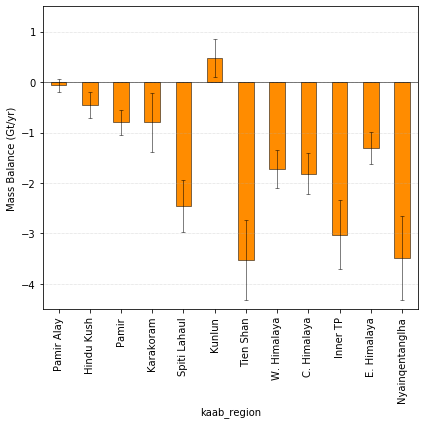

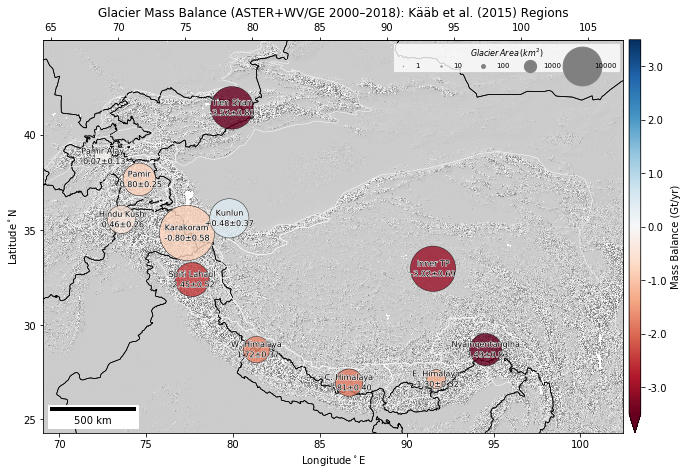

In [363]:
hex_agg_plot(glac_gdf_mb_hex_region_agg, kaab_region_df, title, col=col, sigma_col=sigma_col, \
             out_fn_suffix='_hex%s_kaab_region_%s_update' % (hex_width, mb_unit), clim=region_clim)

## Combine with Brun estimates for Kaab regions

In [325]:
# Load Brun et al. (2017) numbers for Kaab et al (2015) regions
brun_fn = os.path.join(topdir, 'brun_update.csv')
brun_df = pd.read_csv(brun_fn)
brun_df.set_index('region', inplace=True)
brun_df

,orig_mb_mwea,orig_mb_err_mwea,orig_mb_gta,orig_mb_err_gta,new_mb_mwea,new_mb_err_mwea,new_mb_gta,new_mb_err_gta
region,,,,,,,,
East Himalaya,-0.42,0.33,-1.00,0.80,-0.42,0.20,-1.00,0.50
Central Himalaya,-0.33,0.32,-1.60,1.50,-0.33,0.20,-1.60,1.00
Hindu Kush,-0.12,0.14,-0.60,0.70,-0.12,0.07,-0.60,0.40
Inner TP,-0.14,0.14,-1.80,1.80,-0.14,0.07,-1.80,0.90
Karakoram,-0.03,0.14,-0.50,2.50,-0.03,0.07,-0.50,1.20
Kunlun,0.14,0.14,1.40,1.40,0.14,0.08,1.40,0.80
Nyainqentanglha,-0.62,0.35,-4.00,2.20,-0.62,0.23,-4.00,1.50
Pamir Alay,-0.04,0.14,-0.10,0.30,-0.04,0.07,-0.10,0.10
Pamir,-0.08,0.14,-0.60,1.00,-0.08,0.07,-0.60,0.50


In [326]:
brun_df.head()
brun_df_cp = brun_df.copy()
short_lbl(brun_df)
brun_df.head()

,orig_mb_mwea,orig_mb_err_mwea,orig_mb_gta,orig_mb_err_gta,new_mb_mwea,new_mb_err_mwea,new_mb_gta,new_mb_err_gta,region_orig
region,,,,,,,,,
E. Himalaya,-0.42,0.33,-1.00,0.80,-0.42,0.20,-1.00,0.50,East Himalaya
C. Himalaya,-0.33,0.32,-1.60,1.50,-0.33,0.20,-1.60,1.00,Central Himalaya
Hindu Kush,-0.12,0.14,-0.60,0.70,-0.12,0.07,-0.60,0.40,Hindu Kush
Inner TP,-0.14,0.14,-1.80,1.80,-0.14,0.07,-1.80,0.90,Inner TP
Karakoram,-0.03,0.14,-0.50,2.50,-0.03,0.07,-0.50,1.20,Karakoram


In [327]:
brun_df['new_mb_err_gta'].sum()

10.200000000000001

In [328]:
rss(brun_df['new_mb_err_gta'])

3.5071355833500366

In [329]:
# Merge with Brun
glac_gdf_mb_hex_region_agg_brun = glac_gdf_mb_hex_region_agg.merge(brun_df, left_index=True, right_index=True)

/Users/dshean/sw/miniconda3/envs/shean_py3/lib/python3.7/site-packages/pandas/core/reshape/merge.py:618: UserWarning: merging between different levels can give an unintended result (3 levels on the left, 1 on the right)
  warnings.warn(msg, UserWarning)


In [330]:
glac_gdf_mb_hex_region_agg_brun.index.name = 'kaab_region'

[0.12272765 0.33661199 0.45412989 1.3        0.49591554 0.65838299
 0.77561038 0.29833995 0.31879652 0.87726928 0.15149038 0.44337599]


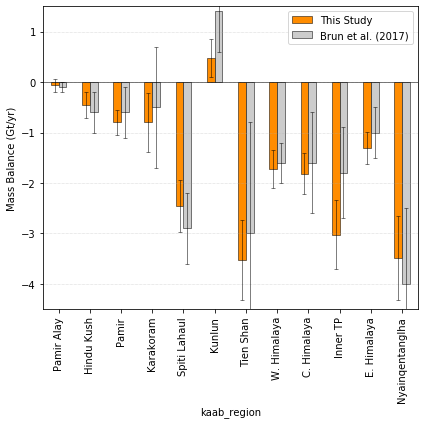

In [364]:
hex_agg_plot(glac_gdf_mb_hex_region_agg_brun, kaab_region_df, title, col=col,sigma_col=sigma_col, \
             out_fn_suffix='_hex%s_kaab_region_brun_%s_update' % (hex_width, mb_unit), clim=region_clim, map=False)

In [335]:
agg_sum = glac_gdf_mb_hex_region_agg[('mb_Gta','sum','sum')].sum()

agg_sigma_sum = glac_gdf_mb_hex_region_agg[sigma_col_Gta].sum()
agg_sigma_rss = rss(glac_gdf_mb_hex_region_agg[sigma_col_Gta])
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_sum))
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_rss))

sigma_col_orig = ('mb_Gta_sigma','sum','rss')
agg_sigma_sum = glac_gdf_mb_hex_region_agg[sigma_col_orig].sum()
agg_sigma_rss = rss(glac_gdf_mb_hex_region_agg[sigma_col_orig])
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_sum))
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_rss))

-18.96±5.51 Gt/yr
-18.96±1.76 Gt/yr
-18.96±3.15 Gt/yr
-18.96±0.97 Gt/yr


## Basin aggregation

In [344]:
basin_df.index = basin_df.index.str.replace('_',' ')
basin_df.rename({'Irrawady':'Irrawaddy'}, inplace=True)

In [345]:
#Irrawady centroid is not actually in basin due to curvature
basin_df.at['Irrawaddy', 'centroid_x'] += 250000
basin_df.at['Irrawaddy', 'centroid_y'] -= 300000

In [346]:
basin_df

,DN,ENDO,geometry,centroid_x,centroid_y
basin_name,,,,,
Irrawaddy,51,0,(POLYGON ((1224583.943096086 -732191.808398038...,"1,379,268.23","-1,655,012.38"
Salween,68,0,(POLYGON ((672169.7126029407 -336521.677728236...,"1,210,804.92","-1,157,828.84"
Ganges,21,0,(POLYGON ((-665049.6944216116 -495091.74933694...,"-381,727.37","-1,042,360.00"
Mekong,29,0,(POLYGON ((854358.4188662369 -207992.492380907...,"1,926,020.68","-1,752,219.17"
Tarim,3546,1,(POLYGON ((345884.0639544324 617350.1410054772...,"-185,054.84","375,149.41"
Amu Darya,1270,1,(POLYGON ((-2094846.421080804 1476189.78996319...,"-1,719,095.50","559,547.89"
Indus,5367,0,(POLYGON ((-1641980.304020386 -430007.62272057...,"-1,336,645.54","-360,903.37"
Ili,5073,1,(POLYGON ((450350.5195374562 667594.5286882111...,"-111,943.87","1,006,719.62"
Syr Darya,7195,1,(POLYGON ((-1086009.053956824 477540.657353113...,"-1,292,769.06","1,229,230.80"


In [347]:
glac_gdf_mb_hex_basin_agg = hex_agg(glac_gdf_mb_hex, basin_df, basin_col)

One-time spatial join by hex
(1713, 91)


In [348]:
#Number of cells per region
glac_gdf_mb_hex_basin_agg['mb_m3wea','sum','size'].describe()

count    14.00
mean    122.36
std      91.23
min       6.00
25%      67.50
50%     105.50
75%     181.50
max     301.00
Name: (mb_m3wea, sum, size), dtype: float64

In [349]:
col

('mb_mwea', 'sum', 'sum')

In [350]:
glac_gdf_mb_hex_basin_agg

mb_m3wea_sigma                               \
                                            sum                                
                                            sum            rss           rms   
basin_name                                                                     
Amu Darya                      1,856,211,970.06 219,391,433.68 17,913,235.55   
Indus                          4,987,259,578.67 457,042,725.69 26,343,504.76   
Syr Darya                        644,240,549.17 103,592,755.24 10,109,617.74   
Ganges                         2,209,274,874.64 302,591,758.10 29,390,309.67   
Tarim                          3,568,842,841.51 395,440,048.69 25,525,545.38   
Ili                            1,530,813,244.83 279,246,238.97 29,113,432.95   
Inner Tibetan Plateau            867,702,309.19 152,213,944.82 10,985,095.25   
Brahmaputra                    4,072,316,080.47 511,291,690.29 33,424,183.41   
Inner Tibetan Plateau Extended   739,785,597.74 192,218,920.23 17,847,078.70   
Salween                          474,248,577.97 110,543,573.59 14,039,047.88   
Irrawaddy                         17,041,210.09   9,604,313.58  3,920,944.60   
Yellow                            35,358,307.30  33,074,143.04 11,693,475.41   
Mekong                            43,494,800.62  14,741,225.18  3,575,272.26   
Yangtze                          453,886,381.65 108,816,367.08 11,872,839.02   

                                        mb_m3wea           z_med           \
                                             sum          median            
                                             sum   size     mean   median   
basin_name                                                                  
Amu Darya                        -956,893,678.91 150.00 4,557.32 4,637.52   
Indus                          -3,502,419,240.42 301.00 5,217.74 5,272.79   
Syr Darya                        -384,075,091.96 105.00 3,867.19 3,840.25   
Ganges                         -3,138,693,393.58 106.00 5,409.15 5,386.50   
Tarim                            -799,884,638.18 240.00 4,983.34 5,121.58   
Ili                            -1,934,314,473.98  92.00 3,747.67 3,763.22   
Inner Tibetan Plateau            -845,407,264.62 192.00 5,740.11 5,830.74   
Brahmaputra                    -5,015,102,729.99 234.00 5,389.50 5,426.24   
Inner Tibetan Plateau Extended   -737,377,432.50 116.00 4,958.16 4,952.50   
Salween                          -780,759,589.07  62.00 5,304.24 5,365.86   
Irrawaddy                         -15,887,454.99   6.00 4,710.02 4,750.89   
Yellow                            -45,336,092.45   8.00 4,917.64 5,016.38   
Mekong                            -55,317,568.91  17.00 5,209.03 5,298.92   
Yangtze                          -751,345,278.96  84.00 5,234.89 5,221.05   

                                Area_all         meltwater                   \
                                     sum         total_m3a  total_m3a_sigma   
                                     sum               sum              sum   
basin_name                                                                    
Amu Darya                      10,251.51 -1,305,236,582.26 1,210,425,233.42   
Indus                          28,098.35 -4,583,192,330.09 3,498,260,015.86   
Syr Darya                       2,142.89   -463,519,360.64   485,514,408.22   
Ganges                          8,573.80 -3,204,785,175.92 2,033,273,077.39   
Tarim                          20,757.26 -2,312,420,713.94 2,035,703,708.91   
Ili                             4,572.51 -1,989,432,940.63 1,415,655,293.02   
Inner Tibetan Plateau           5,987.72 -1,008,991,353.85   681,476,478.03   
Brahmaputra                    10,486.45 -5,374,580,230.73 3,457,310,564.98   
Inner Tibetan Plateau Extended  3,058.46   -787,533,452.41   662,185,881.51   
Salween                         1,338.58   -798,981,434.17   439,890,747.82   
Irrawaddy                          29.04    -17,012,592.60    14,493,220.99   
Yellow              

In [351]:
#brun_basin_df['brun_excess_gta'] = brun_basin_df['brun_excess_m3s'] * spy/1E9
#brun_basin_df['brun_excess_err_gta'] = brun_basin_df['brun_excess_err_m3s'] * spy/1E9

In [352]:
# Load Brun et al. (2017) numbers
brun_basin_fn = os.path.join(topdir, 'brun_basin.csv')
brun_basin_df = pd.read_csv(brun_basin_fn)
brun_basin_df.set_index('basin_name', inplace=True)
spy = 365.25*24*60*60
print(spy)
brun_basin_df['brun_mb_gta_to_m3s'] = brun_basin_df['brun_mb_gta']*1E9/spy
brun_basin_df['brun_mb_gta_to_m3s_int'] = brun_basin_df['brun_mb_gta_to_m3s'].round(0).astype(int)
brun_basin_df

31557600.0


,brun_mb_gta,brun_mb_err_gta,brun_excess_m3s,brun_excess_err_m3s,brun_mb_gta_to_m3s,brun_mb_gta_to_m3s_int
basin_name,,,,,,
Amu Darya,-1.00,0.80,-31,24,-31.69,-32
Brahmaputra,-5.10,2.10,-163,66,-161.61,-162
Ganges,-2.70,0.70,-84,24,-85.56,-86
Ili,-1.60,0.90,-49,27,-50.70,-51
Indus,-4.00,2.00,-125,63,-126.75,-127
Inner Tibetan Plateau,-0.40,0.50,-12,16,-12.68,-13
Mekong,-0.09,0.04,-3,2,-2.85,-3
Salween,-0.80,0.30,-24,9,-25.35,-25
Syr Darya,-0.30,0.20,-10,5,-9.51,-10


In [353]:
glac_gdf_mb_hex_basin_agg_brun = glac_gdf_mb_hex_basin_agg.merge(brun_basin_df, left_index=True, right_index=True, how='outer')

In [354]:
#glac_gdf_mb_hex_basin_agg_brun['centroid_x'] = glac_gdf_mb_hex_basin_agg_brun[('centroid_x','','')]
#glac_gdf_mb_hex_basin_agg_brun['centroid_y'] = glac_gdf_mb_hex_basin_agg_brun[('centroid_y','','')]

In [355]:
glac_gdf_mb_hex_basin_agg_brun.sort_values(by=('centroid_x','',''), inplace=True)
glac_gdf_mb_hex_basin_agg_brun

,"(mb_m3wea_sigma, sum, sum)","(mb_m3wea_sigma, sum, rss)","(mb_m3wea_sigma, sum, rms)","(mb_m3wea, sum, sum)","(mb_m3wea, sum, size)","(z_med, median, mean)","(z_med, median, median)","(Area_all, sum, sum)","(meltwater, total_m3a, sum)","(meltwater, total_m3a_sigma, sum)","(meltwater, total_m3a_sigma, rss)","(meltwater, total_m3a_sigma, rms)","(dhdt_ma_A, sum, sum)","(area_m2, sum, sum)","(dhdt_ma_sigma_A, sum, sum)","(dhdt_ma_sigma_A, sum, rss)","(dhdt_ma_A_abs, sum, sum)","(dhdt_ma, m3_to_ma, region)","(dhdt_ma, m3_to_ma_abs, region)","(dhdt_ma_sigma, perc, region)","(dhdt_ma_sigma, perc_to_ma, region)","(mb_m3wea_sigma, sum_perc, region)","(mb_m3wea_abs, sum, region)","(mb_m3wea_sigma, sum_perc_to_m3wea, region)","(mb_m3wea_sigma, sum_perc_to_Gta, region)","(mb_m3wea_sigma, sum_perc_to_mwea, region)","(centroid_x, , )","(centroid_y, , )","(mb_Gta, sum, sum)","(mb_Gta_sigma, sum, rss)","(mb_mwea, sum, sum)","(mb_mwea_sigma, sum, rss)","(meltwater_Gta, sum, sum)","(meltwater_Gta_sigma, sum, rss)","(meltwater_Gta_sigma, sum, sum)","(meltwater_Gta_hex, sum, sum)","(meltwater_Gta_hex_sigma, sum, rss)","(meltwater_Gta_hex_sigma, sum, sum)","(ENDO, , )",brun_mb_gta,brun_mb_err_gta,brun_excess_m3s,brun_excess_err_m3s,brun_mb_gta_to_m3s,brun_mb_gta_to_m3s_int
basin_name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Amu Darya,"1,856,211,970.06","219,391,433.68","17,913,235.55","-956,893,678.91",150.00,"4,557.32","4,637.52","10,251.51","-1,305,236,582.26","1,210,425,233.42","144,339,839.74","11,824,780.41","-1,125,823,916.62","10,249,647,727.77","2,157,128,033.58","254,673,118.74","1,945,354,312.34",-0.11,0.19,0.13,0.02,0.22,"1,653,551,165.49","355,566,131.15",0.36,0.03,"-1,719,095.50","559,547.89",-0.96,0.22,-0.09,0.02,-1.31,0.14,1.21,-1.06,0.19,1.49,1,-1.00,0.80,-31.00,24.00,-31.69,-32.00
Indus,"4,987,259,578.67","457,042,725.69","26,343,504.76","-3,502,419,240.42",301.00,"5,217.74","5,272.79","28,098.35","-4,583,192,330.09","3,498,260,015.86","345,372,856.63","20,040,565.77","-4,119,825,537.87","28,092,971,425.85","5,755,920,750.92","527,190,598.70","6,662,662,048.44",-0.15,0.24,0.08,0.02,0.19,"5,663,262,741.17","1,064,953,767.15",1.06,0.04,"-1,336,645.54","-360,903.37",-3.50,0.46,-0.12,0.02,-4.58,0.35,3.50,-3.99,0.39,3.82,0,-4.00,2.00,-125.00,63.00,-126.75,-127.00
Syr Darya,"644,240,549.17","103,592,755.24","10,109,617.74","-384,075,091.96",105.00,"3,867.19","3,840.25","2,142.89","-463,519,360.64","485,514,408.22","80,750,860.37","8,075,086.04","-451,846,561.09","2,141,272,537.84","750,591,674.68","120,626,022.28","638,763,643.81",-0.21,0.30,0.19,0.06,0.25,"542,949,097.24","138,171,758.09",0.14,0.06,"-1,292,769.06","1,229,230.80",-0.38,0.10,-0.18,0.05,-0.46,0.08,0.49,-0.40,0.10,0.56,1,-0.30,0.20,-10.00,5.00,-9.51,-10.00
Ganges,"2,209,274,874.64","302,591,758.10","29,390,309.67","-3,138,693,393.58",106.00,"5,409.15","5,386.50","8,573.80","-3,204,785,175.92","2,033,273,077.39","282,959,514.80","27,483,457.63","-3,692,563,910.70","8,562,670,186.90","2,527,378,919.59","345,665,395.04","3,848,067,110.23",-0.43,0.45,0.09,0.04,0.19,"3,270,857,043.70","630,601,156.95",0.63,0.07,"-381,727.37","-1,042,360.00",-3.14,0.30,-0.37,0.04,-3.20,0.28,2.03,-3.14,0.30,2.21,0,-2.70,0.70,-84.00,24.00,-85.56,-86.00
Tarim,"3,568,842,841.51","395,440,048.69","25,525,545.38","-799,884,638.18",240.00,"4,983.34","5,121.58","20,757.26","-2,312,420,713.94","2,035,703,708.91","298,233,488.64","19,882,232.58","-940,538,451.93","20,744,265,992.41","4,125,259,643.91","456,725,454.68","4,499,200,953.97",-0.05,0.22,0.10,0.02,0.20,"3,824,320,810.87","759,155,597.21",0.76,0.04,"-185,054.84","375,149.41",-0.80,0.40,-0.04,0.02,-2.31,0.30,2.04,-1.87,0.35,2.18,1,0.40,1.30,0.00,41.00,12.68,13.00
Ili,"1,530,813,244.83","279,246,238.97","29,113,432.95","-1,934,314,473.98",92.00,"3,747.67","3,763.22","4,572.51","-1,989,432,940.63","1,415,655,293.02","264,135,312.08","27,842,306.55","-2,275,661,341.43","4,572,029,818.73","1,763,791,747.64","321,812,171.27","2,405,343,032.39",-0

[0.47429684 1.3        0.09914289 0.39667595 0.96035678 0.21155202
 0.27702803 0.48516654 0.14150299 0.06193092 0.00134375 0.0038529
 0.00515691 0.08348803]
Plotting borders
Plotting glacier polygons
('mb_Gta', 'sum', 'sum')
Plotting scatterplot of ('mb_Gta', 'sum', 'sum') values
Adding annotations


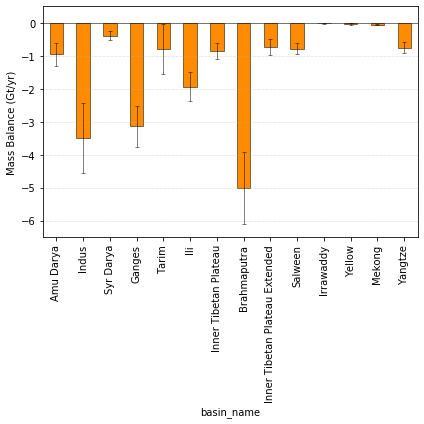

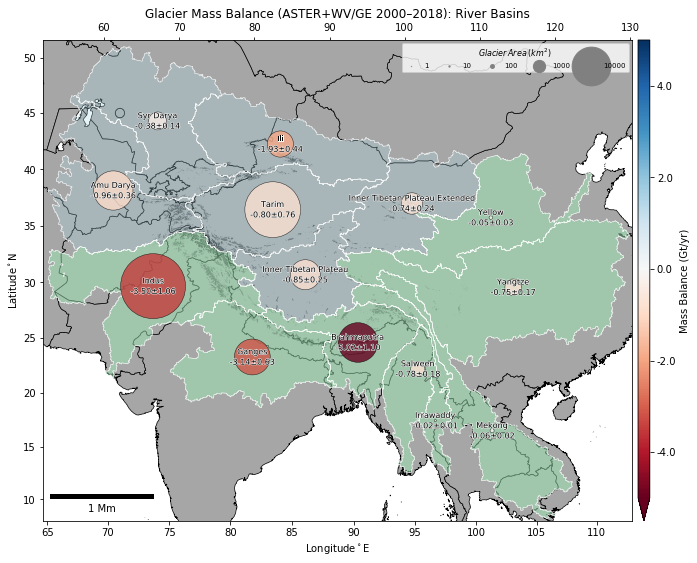

In [367]:
#Make sure this is run after Gta cell above is run, won't work for mwea
mb_unit = 'Gta'
basin_melt_gt_clim = (-5, 5)
ylim = (-6.5, 0.5)

extent = [-2396534,-2619071,3273634,2008000]
title = suptitle + ": River Basins"
hex_agg_plot(glac_gdf_mb_hex_basin_agg, basin_df, title, col=col, sigma_col=sigma_col, \
             out_fn_suffix='_hex%s_basin_%s_update' % (hex_width, mb_unit), clim=basin_melt_gt_clim, hs_bg=False, map=True, glac=True, savefig=True)

[0.47429684 1.3        0.09914289 0.39667595 0.96035678 0.21155202
 0.27702803 0.48516654 0.14150299 0.06193092 0.00134375 0.0038529
 0.00515691 0.08348803]


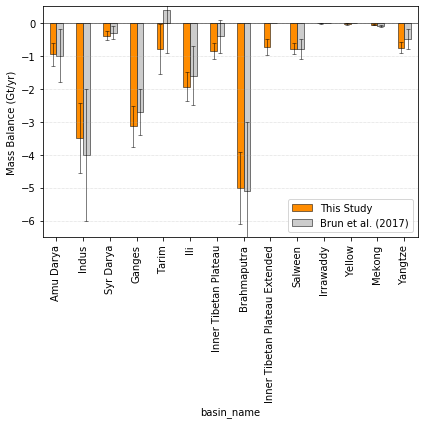

In [368]:
hex_agg_plot(glac_gdf_mb_hex_basin_agg_brun, basin_df, title, col=col, sigma_col=sigma_col, \
             out_fn_suffix='_hex%s_basin_brun_%s_update' % (hex_width, mb_unit), clim=basin_melt_gt_clim, hs_bg=False, map=False)

In [411]:
agg_sum = glac_gdf_mb_hex_basin_agg[('mb_Gta','sum','sum')].sum()

agg_sigma_sum = glac_gdf_mb_hex_basin_agg[sigma_col_Gta].sum()
agg_sigma_rss = rss(glac_gdf_mb_hex_basin_agg[sigma_col_Gta])
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_sum))
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_rss))

sigma_col_orig = ('mb_Gta_sigma','sum','rss')
agg_sigma_sum = glac_gdf_mb_hex_basin_agg[sigma_col_orig].sum()
agg_sigma_rss = rss(glac_gdf_mb_hex_basin_agg[sigma_col_orig])
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_sum))
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_rss))

-18.96±5.38 Gt/yr
-18.96±1.96 Gt/yr
-18.96±2.89 Gt/yr
-18.96±0.97 Gt/yr


## HMA-wide using same aggregation machinery

In [388]:
region_df['dummy'] = 1

In [402]:
region_df2 = region_df.copy()

In [403]:
region_df2['geometry'] = region_df2.buffer(1)

In [407]:
hma_df = region_df2.dissolve(by='dummy')
hma_df

,geometry,centroid_x,centroid_y,himap_region_orig
dummy,,,,
1,POLYGON ((1599313.248298781 -269871.3693222655...,"-1,203,427.33","52,490.72",Eastern Hindu Kush


In [572]:
glac_gdf_mb_hex_hma_agg = hex_agg(glac_gdf_mb_hex, hma_df, 'dummy')

One-time spatial join by hex


/Users/dshean/sw/miniconda3/envs/shean_py3/lib/python3.7/site-packages/geopandas/tools/sjoin.py:56: UserWarning: CRS of frames being joined does not match!(None != {'proj': 'aea', 'lat_1': 25, 'lat_2': 47, 'lat_0': 36, 'lon_0': 85, 'x_0': 0, 'y_0': 0, 'datum': 'WGS84', 'units': 'm', 'no_defs': True})
  '(%s != %s)' % (left_df.crs, right_df.crs))


(1713, 90)


In [573]:
glac_gdf_mb_hex_hma_agg

mb_m3wea_sigma                                        mb_m3wea  \
                    sum                                             sum   
                    sum            rss           rms                sum   
dummy                                                                     
1     21,500,476,323.92 969,879,321.94 23,433,600.34 -18,962,813,928.53   

                  z_med           Area_all          meltwater  \
                 median                sum          total_m3a   
          size     mean   median       sum                sum   
dummy                                                           
1     1,713.00 5,042.32 5,169.53 97,295.83 -22,711,674,160.09   

                                                              dhdt_ma_A  \
        total_m3a_sigma                                             sum   
                    sum            rss           rms                sum   
dummy                                                                     
1     16,441,017,679.65 805,372,759.09 19,707,825.14 -22,308,094,473.12   

                area_m2   dhdt_ma_sigma_A                      dhdt_ma_A_abs  \
                    sum               sum                                sum   
                    sum               sum              rss               sum   
dummy                                                                          
1     96,993,335,269.14 24,751,717,323.39 1,114,457,755.90 31,128,414,067.41   

       dhdt_ma              dhdt_ma_sigma            mb_m3wea_sigma  \
      m3_to_ma m3_to_ma_abs          perc perc_to_ma       sum_perc   
        region       region        region     region         region   
dummy                                                                 
1        -0.23         0.32          0.04       0.01           0.13   

           mb_m3wea_abs    mb_m3wea_sigma                                   \
                    sum sum_perc_to_m3wea sum_perc_to_Gta sum_perc_to_mwea   
                 region            region          region           region   
dummy                                                                        
1     26,459,151,957.30  3,374,395,535.83            3.37             0.03   

         centroid_x centroid_y mb_Gta mb_Gta_sigma mb_mwea mb_mwea_sigma  \
                                  sum          sum     sum           sum   
                                  sum          rss     sum           rss   
dummy                                                                      
1     -1,203,427.33  52,490.72 -18.96         0.97   -0.19          0.01   

      meltwater_Gta meltwater_Gta_sigma       meltwater_Gta_hex  \
                sum                 sum                     sum   
                sum                 rss   sum               sum   
dummy                                                             
1            -22.71                0.81 16.44            -20.83   

      meltwater_Gta_hex_sigma        
                          sum        
                          rss   sum  
dummy                                
1                        0.91 18.11

In [418]:
glac_gdf_mb_hex_hma_agg.columns

MultiIndex([(         'mb_m3wea_sigma',               'sum',    'sum'),
            (         'mb_m3wea_sigma',               'sum',    'rss'),
            (         'mb_m3wea_sigma',               'sum',    'rms'),
            (               'mb_m3wea',               'sum',    'sum'),
            (               'mb_m3wea',               'sum',   'size'),
            (                  'z_med',            'median',   'mean'),
            (                  'z_med',            'median', 'median'),
            (               'Area_all',               'sum',    'sum'),
            (              'meltwater',         'total_m3a',    'sum'),
            (              'meltwater',   'total_m3a_sigma',    'sum'),
            (              'meltwater',   'total_m3a_sigma',    'rss'),
            (              'meltwater',   'total_m3a_sigma',    'rms'),
            (              'dhdt_ma_A',               'sum',    'sum'),
            (                'area_m2',               'sum',    

In [574]:
glac_gdf_mb_hex_hma_agg[('mb_m3wea_sigma','sum_perc','region')]

dummy
1   0.13
Name: (mb_m3wea_sigma, sum_perc, region), dtype: float64

In [578]:
np.sqrt(0.04**2 + 0.10**2 + 0.071**2)

0.129

In [575]:
glac_gdf_mb_hex_hma_agg[('dhdt_ma_sigma','perc','region')]

dummy
1   0.04
Name: (dhdt_ma_sigma, perc, region), dtype: float64

In [576]:
glac_gdf_mb_hex_hma_agg[('dhdt_ma_sigma_A','sum','rss')]/glac_gdf_mb_hex_hma_agg[(          'dhdt_ma_A_abs',               'sum',    'sum')]

dummy
1   0.04
dtype: float64

In [577]:
agg_sum = glac_gdf_mb_hex_hma_agg[('mb_Gta','sum','sum')].sum()
abs(agg_sum) * glac_gdf_mb_hex_hma_agg[('mb_m3wea_sigma','sum_perc','region')]

dummy
1   2.42
Name: (mb_m3wea_sigma, sum_perc, region), dtype: float64

In [501]:
sigma_col_Gta

('mb_m3wea_sigma', 'sum_perc_to_Gta', 'region')

In [502]:
sigma_col_Gta = ('mb_m3wea_sigma', 'sum_perc_to_Gta', 'region')
agg_sigma_sum = glac_gdf_mb_hex_hma_agg[sigma_col_Gta].sum()
agg_sigma_rss = rss(glac_gdf_mb_hex_hma_agg[sigma_col_Gta])
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_sum))
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_rss))

sigma_col_orig = ('mb_Gta_sigma','sum','rss')
agg_sigma_sum = glac_gdf_mb_hex_hma_agg[sigma_col_orig].sum()
agg_sigma_rss = rss(glac_gdf_mb_hex_hma_agg[sigma_col_orig])
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_sum))
print('%0.2f\u00b1%0.2f Gt/yr' % (agg_sum, agg_sigma_rss))

-18.96±4.61 Gt/yr
-18.96±4.61 Gt/yr
-18.96±0.97 Gt/yr
-18.96±0.97 Gt/yr


In [416]:
4.61/18.96

0.24314345991561181

## Excess meltwater analysis and SLR

In [245]:
basin_melt_gt_clim = (-5, 0)
mb_unit = 'Gta'
ylim = (-6.0, 0.5)
extent = [-2396534,-2619071,3273634,2008000]
title = suptitle + ": Excess meltwater runoff"

In [245]:
col = ('meltwater_Gta', 'sum','sum')
sigma_col = ('meltwater_Gta_sigma','sum','rss')
out_fn_suffix = '_hex%s_basin_excess_allglac_%s' % (hex_width, mb_unit)

#col = ('meltwater_Gta_hex', 'sum','sum')
#sigma_col = ('meltwater_Gta_hex_sigma','sum','rss')
#out_fn_suffix = '_hex%s_basin_excess_%s' % (hex_width, mb_unit)

[0.47277565 1.3        0.10607261 0.41301696 0.97165136 0.26153928
 0.33081483 0.48090408 0.12043041 0.05893781 0.00299916 0.0019185
 0.01032068 0.09035426]
Plotting borders
Plotting glacier polygons
('meltwater_Gta', 'sum', 'sum')
Plotting scatterplot of ('meltwater_Gta', 'sum', 'sum') values
Adding annotations


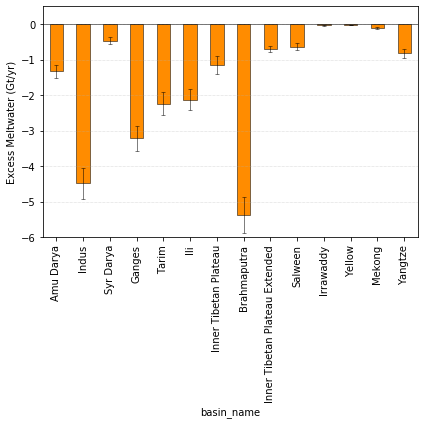

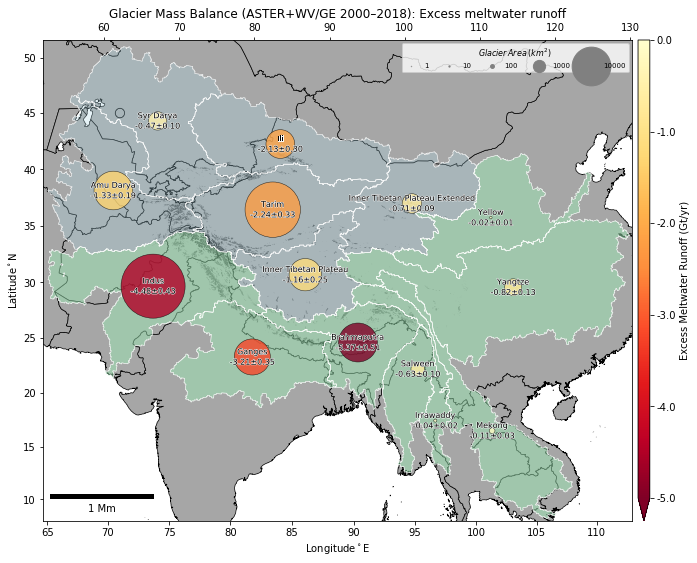

In [246]:
hex_agg_plot(glac_gdf_mb_hex_basin_agg, basin_df, title, col=col, sigma_col=sigma_col, \
             out_fn_suffix=out_fn_suffix, clim=basin_melt_gt_clim, hs_bg=False, map=True, savefig=True, glac=True)

In [193]:
glac_gdf_mb_hex_basin_agg['mb_m3wea','sum','sum']/1E9

basin_name
Amu Darya                        -1.03
Indus                            -3.41
Syr Darya                        -0.37
Ganges                           -3.14
Tarim                            -0.71
Ili                              -2.06
Inner Tibetan Plateau            -0.97
Brahmaputra                      -5.01
Inner Tibetan Plateau Extended   -0.67
Salween                          -0.62
Irrawaddy                        -0.04
Yellow                           -0.02
Mekong                           -0.10
Yangtze                          -0.80
Name: (mb_m3wea, sum, sum), dtype: float64

In [194]:
glac_gdf_mb_hex_basin_agg['mb_m3wea_sigma','sum','rss']/1E9

basin_name
Amu Darya                        0.26
Indus                            0.58
Syr Darya                        0.14
Ganges                           0.38
Tarim                            0.45
Ili                              0.34
Inner Tibetan Plateau            0.27
Brahmaputra                      0.62
Inner Tibetan Plateau Extended   0.09
Salween                          0.11
Irrawaddy                        0.02
Yellow                           0.01
Mekong                           0.03
Yangtze                          0.13
Name: (mb_m3wea_sigma, sum, rss), dtype: float64

In [195]:
glac_gdf_mb_hex_basin_agg['mb_m3wea','sum','size']

basin_name
Amu Darya                         87.00
Indus                            187.00
Syr Darya                         67.00
Ganges                            72.00
Tarim                            163.00
Ili                               66.00
Inner Tibetan Plateau            151.00
Brahmaputra                      160.00
Inner Tibetan Plateau Extended    86.00
Salween                           42.00
Irrawaddy                          5.00
Yellow                             5.00
Mekong                            12.00
Yangtze                           63.00
Name: (mb_m3wea, sum, size), dtype: float64

In [196]:
glac_gdf_mb_hex_basin_agg['meltwater','total_m3a','sum']/1E9

basin_name
Amu Darya                        -1.33
Indus                            -4.48
Syr Darya                        -0.47
Ganges                           -3.21
Tarim                            -2.24
Ili                              -2.13
Inner Tibetan Plateau            -1.16
Brahmaputra                      -5.37
Inner Tibetan Plateau Extended   -0.71
Salween                          -0.63
Irrawaddy                        -0.04
Yellow                           -0.02
Mekong                           -0.11
Yangtze                          -0.82
Name: (meltwater, total_m3a, sum), dtype: float64

In [197]:
glac_gdf_mb_hex_basin_agg['meltwater','total_m3a_sigma','rss']/1E9

basin_name
Amu Darya                        0.19
Indus                            0.43
Syr Darya                        0.10
Ganges                           0.35
Tarim                            0.33
Ili                              0.30
Inner Tibetan Plateau            0.25
Brahmaputra                      0.51
Inner Tibetan Plateau Extended   0.09
Salween                          0.10
Irrawaddy                        0.02
Yellow                           0.01
Mekong                           0.03
Yangtze                          0.13
Name: (meltwater, total_m3a_sigma, rss), dtype: float64

In [237]:
basin_sum = glac_gdf_mb_hex_basin_agg.sum()
basin_rss = rss(glac_gdf_mb_hex_basin_agg)
basin_sum/1E9

mb_m3wea_sigma           sum              sum       21.50
                                          rss        3.44
                                          rms        0.35
mb_m3wea                 sum              sum      -18.96
                                          size       0.00
z_med                    median           mean       0.00
                                          median     0.00
Area_all                 sum              sum        0.00
meltwater                total_m3a        sum      -22.71
                         total_m3a_sigma  sum       16.44
                                          rss        2.84
                                          rms        0.29
centroid_x                                           0.01
centroid_y                                          -0.00
mb_Gta                   sum              sum       -0.00
mb_Gta_sigma             sum              rss        0.00
mb_mwea                  sum              sum       -0.00
mb_mwea_sigma 

In [212]:
basin_sum

mb_m3wea_sigma           sum              sum       21,500,476,323.92
                                          rss        3,440,293,520.87
                                          rms          347,467,477.35
mb_m3wea                 sum              sum      -18,962,813,928.53
                                          size               1,166.00
z_med                    median           mean              69,234.40
                                          median            70,029.65
Area_all                 sum              sum               97,296.32
meltwater                total_m3a        sum      -22,711,674,160.09
                         total_m3a_sigma  sum       16,441,017,679.65
                                          rss        2,836,077,942.87
                                          rms          294,524,041.82
centroid_x                                               5,448,037.42
centroid_y                                              -3,589,648.70
mb_Gta              

In [238]:
basin_rss

mb_m3wea_sigma           sum              sum      8,133,094,625.05
                                          rss      1,176,213,889.75
                                          rms        107,877,806.25
mb_m3wea                 sum              sum      7,417,271,660.80
                                          size               380.60
z_med                    median           mean            18,616.75
                                          median          18,835.40
Area_all                 sum              sum             39,242.62
meltwater                total_m3a        sum      8,584,056,263.27
                         total_m3a_sigma  sum      6,091,825,519.81
                                          rss        954,374,866.64
                                          rms         90,753,012.24
centroid_x                                             4,860,825.21
centroid_y                                             3,555,231.60
mb_Gta                   sum              sum   

### Total excess meltwater aggregated for all glaciers in each basin

In [199]:
print('%0.2f\u00b1%0.2f Gt/yr' % (basin_sum[('meltwater_Gta', 'sum','sum')], basin_sum[('meltwater_Gta_sigma','sum','rss')]))

-22.71±2.84 Gt/yr


### Total excess meltwater aggregated for all hex cells in each basin

In [202]:
print('%0.2f\u00b1%0.2f Gt/yr' % (basin_sum[('meltwater_Gta_hex', 'sum','sum')], basin_sum[('meltwater_Gta_hex_sigma','sum','rss')]))

-20.61±3.28 Gt/yr


### Total excess meltwater sum of basin values (from aggregated hex cells)

In [239]:
#print('%0.2f\u00b1%0.2f Gt/yr' % (basin_sum[col], basin_sum[sigma_col]))
print('%0.2f\u00b1%0.2f Gt/yr' % (basin_sum[('meltwater_Gta_hex', 'sum','sum')], basin_rss[('meltwater_Gta_hex_sigma','sum','rss')]))

-20.61±1.12 Gt/yr


## Split into endorheic and exorheic basins

In [264]:
#col = ('meltwater_Gta', 'sum','sum')
#sigma_col = ('meltwater_Gta_sigma','sum','rss')
#col = ('meltwater_Gta_hex', 'sum','sum')
#sigma_col = ('meltwater_Gta_hex_sigma','sum','rss')
col=('mb_Gta', 'sum', 'sum')
sigma_col=('mb_Gta_sigma', 'sum', 'rss')

In [265]:
#Exohreic basins
endo_sum = glac_gdf_mb_hex_basin_agg[glac_gdf_mb_hex_basin_agg['ENDO'] == 1].sum()
exo_sum = glac_gdf_mb_hex_basin_agg[glac_gdf_mb_hex_basin_agg['ENDO'] == 0].sum()
exo_rss = rss(glac_gdf_mb_hex_basin_agg[glac_gdf_mb_hex_basin_agg['ENDO'] == 0])

In [266]:
#Endo SLR contribution
print('%0.2f\u00b1%0.2f Gt/yr' % (endo_sum[col], endo_sum[sigma_col]))
print('%0.3f\u00b1%0.3f mm/yr' % (endo_sum[col]/Gt2mm, endo_sum[sigma_col]/Gt2mm))

-5.82±1.55 Gt/yr
-0.016±0.004 mm/yr


In [271]:
#Exo Meltwater SLR contribution
print('%0.2f\u00b1%0.2f Gt/yr' % (exo_sum[col], exo_sum[sigma_col]))
print('%0.1f\u00b1%0.1f Gt/yr' % (exo_sum[col], exo_rss[sigma_col]))
print('%0.3f\u00b1%0.3f mm/yr' % (exo_sum[col]/Gt2mm, exo_sum[sigma_col]/Gt2mm))
print('%0.3f\u00b1%0.3f mm/yr' % (exo_sum[col]/Gt2mm, exo_rss[sigma_col]/Gt2mm))

-13.15±1.89 Gt/yr
-13.1±0.9 Gt/yr
-0.036±0.005 mm/yr
-0.036±0.003 mm/yr


In [243]:
#Total for 2000-2018
print('%0.2f\u00b1%0.2f Gt' % (18*exo_sum[col], 18*exo_sum[sigma_col]))
print('%0.3f\u00b1%0.3f mm' % (18*exo_sum[col]/Gt2mm, 18*exo_sum[sigma_col]/Gt2mm))

-236.64±34.04 Gt
-0.653±0.094 mm


In [272]:
0.036/0.92

0.03913043478260869

In [273]:
0.052/0.92

0.056521739130434775

In [274]:
0.052*18

0.9359999999999999

## Aggregate all glaciers, not hex cells

In [228]:
append_centroid_xy(basin_df_endo)
glac_gdf_mb_hex_basin_endo_agg = hex_agg(glac_gdf_mb_hex, basin_df_endo, 'ENDO')
glac_gdf_mb_hex_basin_endo_agg

One-time spatial join by hex
(1166, 66)


mb_m3wea_sigma                                        mb_m3wea         \
                   sum                                             sum          
                   sum            rss           rms                sum   size   
ENDO                                                                            
1     9,285,748,038.84 696,570,692.37 27,974,952.20  -5,815,883,362.13 620.00   
0    12,214,728,285.08 947,770,217.39 40,560,820.90 -13,146,930,566.40 546.00   

        z_med           Area_all          meltwater                   \
       median                sum          total_m3a  total_m3a_sigma   
         mean   median       sum                sum              sum   
ENDO                                                                   
1    4,850.51 4,975.37 47,646.43  -8,032,258,391.81 6,576,586,307.54   
0    5,297.85 5,334.42 49,649.89 -14,679,415,768.28 9,864,431,372.10   

                                   centroid_x  centroid_y mb_Gta mb_Gta_sigma  \
                                                             sum          sum   
                rss           rms                            sum          rss   
ENDO                                                                            
1    561,256,437.11 22,989,959.44 -462,571.98  617,780.25  -5.82         0.70   
0    771,895,457.87 33,186,377.79  875,027.54 -665,391.40 -13.15         0.95   

     mb_mwea mb_mwea_sigma meltwater_Gta meltwater_Gta_sigma       \
         sum           sum           sum                 sum        
         sum           rss           sum                 rss  sum   
ENDO                                                                
1      -0.12          0.01         -8.03                0.56 6.58   
0      -0.26          0.02        -14.68                0.77 9.86   

     meltwater_Gta_hex meltwater_Gta_hex_sigma        
                   sum                     sum        
                   sum                     rss   sum  
ENDO                                                  
1                -7.04                    0.64  7.28  
0               -13.57                    0.91 11.21

In [234]:
#Endo SLR contribution
print('%0.2f\u00b1%0.2f Gt/yr' % (glac_gdf_mb_hex_basin_endo_agg.iloc[0][col], \
                                  glac_gdf_mb_hex_basin_endo_agg.iloc[0][sigma_col]))
print('%0.3f\u00b1%0.3f mm/yr' % (glac_gdf_mb_hex_basin_endo_agg.iloc[0][col]/Gt2mm, \
                                  glac_gdf_mb_hex_basin_endo_agg.iloc[0][sigma_col]/Gt2mm))

-5.82±0.70 Gt/yr
-0.016±0.002 mm/yr


In [235]:
#Exo Meltwater SLR contribution
print('%0.2f\u00b1%0.2f Gt/yr' % (glac_gdf_mb_hex_basin_endo_agg.iloc[1][col], \
                                  glac_gdf_mb_hex_basin_endo_agg.iloc[1][sigma_col]))
print('%0.3f\u00b1%0.3f mm/yr' % (glac_gdf_mb_hex_basin_endo_agg.iloc[1][col]/Gt2mm, \
                                  glac_gdf_mb_hex_basin_endo_agg.iloc[1][sigma_col]/Gt2mm))

-13.15±0.95 Gt/yr
-0.036±0.003 mm/yr


In [236]:
glac_gdf_mb_hex_basin_agg.columns

MultiIndex([(         'mb_m3wea_sigma',             'sum',    'sum'),
            (         'mb_m3wea_sigma',             'sum',    'rss'),
            (         'mb_m3wea_sigma',             'sum',    'rms'),
            (               'mb_m3wea',             'sum',    'sum'),
            (               'mb_m3wea',             'sum',   'size'),
            (                  'z_med',          'median',   'mean'),
            (                  'z_med',          'median', 'median'),
            (               'Area_all',             'sum',    'sum'),
            (              'meltwater',       'total_m3a',    'sum'),
            (              'meltwater', 'total_m3a_sigma',    'sum'),
            (              'meltwater', 'total_m3a_sigma',    'rss'),
            (              'meltwater', 'total_m3a_sigma',    'rms'),
            (             'centroid_x',                '',       ''),
            (             'centroid_y',                '',       ''),
            (       

In [833]:
#These are identical to ('mb_mwea','sum','sum')
#glac_gdf_mb_hex_basin_agg['mb_Gta_to_mwea','',''] = glac_gdf_mb_hex_basin_agg['mb_m3wea','sum','sum']/glac_gdf_mb_hex_basin_agg['Area_all','sum','sum']/1E6
#glac_gdf_mb_hex_basin_agg['mb_Gta_to_mwea_sigma','',''] = glac_gdf_mb_hex_basin_agg['mb_m3wea_sigma','sum','rss']/glac_gdf_mb_hex_basin_agg['Area_all','sum','sum']/1E6
glac_gdf_mb_hex_basin_agg['meltwater_mwea','',''] = glac_gdf_mb_hex_basin_agg['meltwater','total_m3a','sum']/glac_gdf_mb_hex_basin_agg['Area_all','sum','sum']/1E6
glac_gdf_mb_hex_basin_agg['meltwater_mwea_sigma','',''] = glac_gdf_mb_hex_basin_agg['meltwater','total_m3a_sigma','rss']/glac_gdf_mb_hex_basin_agg['Area_all','sum','sum']/1E6

In [834]:
glac_gdf_mb_hex_basin_agg

mb_m3wea_sigma                               \
                                            sum                                
                                            sum            rss           rms   
basin_name                                                                     
Amu Darya                      1,707,722,617.39 170,558,418.34 12,341,174.02   
Indus                          4,947,027,294.17 400,501,967.96 19,950,424.06   
Syr Darya                        764,090,399.19 111,712,053.65 10,032,038.57   
Ganges                         2,173,827,187.45 270,820,142.40 23,053,741.49   
Tarim                          3,814,520,982.12 360,952,104.01 20,241,188.89   
Ili                            1,447,095,502.43 241,335,603.22 22,216,743.07   
Inner Tibetan Plateau            853,797,593.71 118,573,961.08  8,012,485.76   
Brahmaputra                    4,077,916,851.38 446,936,161.38 25,933,866.44   
Inner Tibetan Plateau Extended   713,065,565.70 185,605,708.61 15,521,129.08   
Salween                          437,399,659.69 100,622,524.22 11,320,918.46   
Irrawaddy                         14,886,267.33   7,144,042.42  2,700,194.23   
Yellow                            53,927,487.30  30,483,804.74  9,639,825.47   
Mekong                            84,031,787.31  32,956,337.68  7,191,662.48   
Yangtze                          411,167,128.76 106,172,927.12 11,069,292.84   

                                        mb_m3wea           z_med           \
                                             sum          median            
                                             sum   size     mean   median   
basin_name                                                                  
Amu Darya                      -1,018,463,571.91 191.00 4,571.40 4,682.66   
Indus                          -3,465,229,049.97 403.00 5,226.60 5,290.60   
Syr Darya                        -397,730,826.57 124.00 3,895.28 3,862.09   
Ganges                         -3,068,245,564.83 138.00 5,435.84 5,423.05   
Tarim                          -1,109,522,413.84 318.00 5,008.57 5,130.95   
Ili                            -1,764,497,011.53 118.00 3,746.07 3,757.33   
Inner Tibetan Plateau            -834,926,087.09 219.00 5,750.04 5,834.48   
Brahmaputra                    -4,923,647,196.83 297.00 5,388.20 5,417.60   
Inner Tibetan Plateau Extended   -677,943,054.65 143.00 4,943.43 4,959.78   
Salween                          -818,517,006.51  79.00 5,297.53 5,357.51   
Irrawaddy                         -16,026,681.57   7.00 4,698.87 4,736.66   
Yellow                            -77,821,488.09  10.00 4,832.21 4,837.49   
Mekong                           -125,431,929.55  21.00 5,251.97 5,296.26   
Yangtze                          -664,812,045.58  92.00 5,241.89 5,230.37   

                                Area_all         meltwater                   \
                                     sum         total_m3a  total_m3a_sigma   
                                     sum               sum              sum   
basin_name                                                                    
Amu Darya                       9,712.01 -1,297,031,727.02 1,170,636,060.29   
Indus                          27,693.84 -4,530,404,400.73 3,453,720,405.79   
Syr Darya                       2,442.90   -514,645,507.18   537,646,008.77   
Ganges                          8,378.11 -3,135,076,463.94 1,996,866,098.27   
Tarim                          22,640.05 -2,673,532,282.13 2,251,995,044.52   
Ili                             4,473.11 -1,818,259,319.95 1,327,654,073.28   
Inner Tibetan Plateau           5,335.28   -997,353,191.42   661,708,311.41   
Brahmaputra                    10,272.86 -5,286,930,138.19 3,457,043,798.12   
Inner Tibetan Plateau Extended  2,921.32   -729,020,979.90   633,798,580.11   
Salween                         1,354.32   -830,514,167.50   413,183,835.14   
Irrawaddy                          24.70    -17,003,038.57    12,621,097.56   
Yellow              

In [248]:
glac_gdf_mb_hex_basin_agg.columns

MultiIndex([(         'mb_m3wea_sigma',             'sum',    'sum'),
            (         'mb_m3wea_sigma',             'sum',    'rss'),
            (         'mb_m3wea_sigma',             'sum',    'rms'),
            (               'mb_m3wea',             'sum',    'sum'),
            (               'mb_m3wea',             'sum',   'size'),
            (                  'z_med',          'median',   'mean'),
            (                  'z_med',          'median', 'median'),
            (               'Area_all',             'sum',    'sum'),
            (              'meltwater',       'total_m3a',    'sum'),
            (              'meltwater', 'total_m3a_sigma',    'sum'),
            (              'meltwater', 'total_m3a_sigma',    'rss'),
            (              'meltwater', 'total_m3a_sigma',    'rms'),
            (             'centroid_x',                '',       ''),
            (             'centroid_y',                '',       ''),
            (       

In [255]:
basin_df.area/1E6

basin_name
Irrawaddy                          390,673.97
Salween                            280,908.50
Ganges                             946,058.08
Mekong                             768,243.38
Tarim                              983,017.40
Amu Darya                        1,123,674.15
Indus                            1,316,074.68
Ili                                941,437.06
Syr Darya                        1,113,237.95
Yangtze                          1,918,723.56
Inner Tibetan Plateau              681,981.08
Brahmaputra                        635,083.43
Inner Tibetan Plateau Extended     822,869.13
Yellow                             815,041.01
dtype: float64

In [256]:
basin_summary = glac_gdf_mb_hex_basin_agg[[('mb_Gta','sum','sum'),('mb_Gta_sigma','sum','rss'),\
                            ('meltwater_Gta','sum','sum'),('meltwater_Gta_sigma','sum','rss'),\
                            ('meltwater_Gta_hex','sum','sum'),('meltwater_Gta_hex_sigma','sum','rss'),\
                            ('Area_all','sum','sum')]]
basin_summary['ENDO'] = glac_gdf_mb_hex_basin_agg['ENDO']
basin_summary['basin_area'] = basin_df.area/1E6
basin_summary['basin_glac_area_perc'] = 100*basin_summary[('Area_all','sum','sum')]/basin_summary['basin_area']
out_fn = os.path.splitext(glac_shp_join_fn)[0]+'_hex%s_basin_summary.pkl' % hex_width
basin_summary.to_pickle(out_fn)

/Users/dshean/sw/miniconda3/envs/shean_py3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/Users/dshean/sw/miniconda3/envs/shean_py3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/dshean/sw/miniconda3/envs/shean_py3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexe

In [836]:
basin_summary

,mb_Gta,mb_Gta_sigma,meltwater_Gta,meltwater_Gta_sigma,meltwater_Gta_hex,meltwater_Gta_hex_sigma,ENDO
,sum,sum,sum,sum,sum,sum,
,sum,rss,sum,rss,sum,rss,
basin_name,,,,,,,
Amu Darya,-1.02,0.17,-1.30,0.13,-1.10,0.15,1
Indus,-3.47,0.40,-4.53,0.30,-4.02,0.36,0
Syr Darya,-0.40,0.11,-0.51,0.08,-0.44,0.10,1
Ganges,-3.07,0.27,-3.14,0.25,-3.07,0.27,0
Tarim,-1.11,0.36,-2.67,0.28,-2.24,0.31,1
Ili,-1.76,0.24,-1.82,0.23,-1.77,0.24,1
Inner Tibetan Plateau,-0.83,0.12,-1.00,0.10,-0.93,0.11,1


[0.47277565 1.3        0.10607261 0.41301696 0.97165136 0.26153928
 0.33081483 0.48090408 0.12043041 0.05893781 0.00299916 0.0019185
 0.01032068 0.09035426]
Plotting borders
Plotting glacier polygons
('mb_mwea', 'sum', 'sum')
Plotting scatterplot of ('mb_mwea', 'sum', 'sum') values
Adding annotations


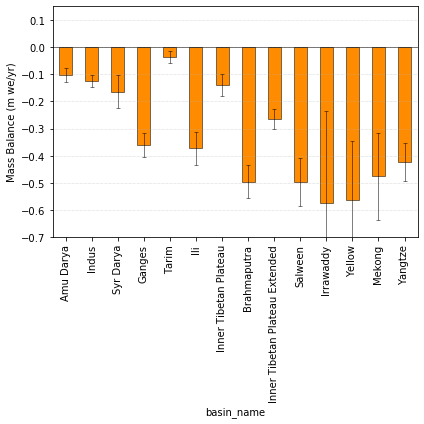

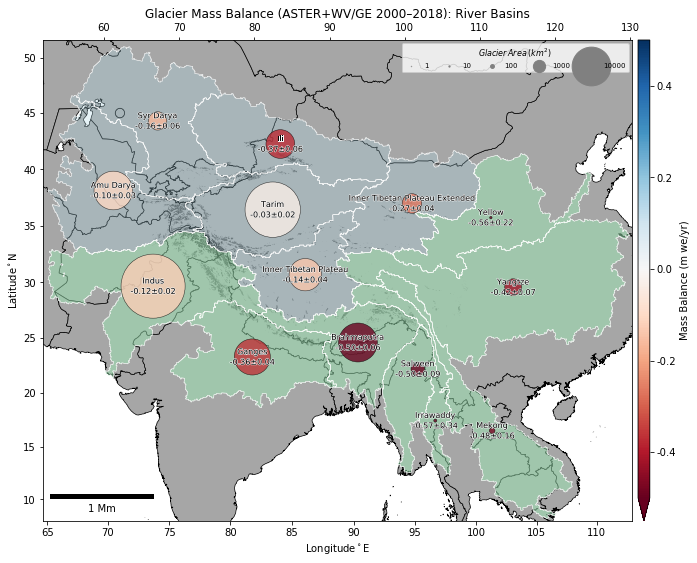

In [457]:
basin_melt_mwea_clim = (-0.5, 0.5)
mb_unit = 'mwea'
ylim = (-0.7, 0.15)
extent = [-2396534,-2619071,3273634,2008000]
title = suptitle + ": River Basins"
out_fn_suffix = '_hex%s_basin_mb_%s' % (hex_width, mb_unit)
#glac_gdf_mb_hex_basin_agg = hex_agg(glac_gdf_mb_hex, basin_df, basin_col)
#col = ('meltwater_mwea','','')
#sigma_col = ('meltwater_mwea_sigma','','')
col = ('mb_mwea','sum','sum')
sigma_col = ('mb_mwea_sigma','sum','rss')
hex_agg_plot(glac_gdf_mb_hex_basin_agg, basin_df, title, out_fn_suffix, clim=basin_melt_mwea_clim, col=col, sigma_col=sigma_col, hs_bg=False, savefig=True, glac=True)

In [569]:
30/np.sqrt(np.pi)

16.92568750643269